# UK Accident analysis
### Aim
The aim is to advise government agencies about how to improve road safety and create a model that would predict such accidents and the injuries that they incur.

### Context
This assignment is based on real world data: specifically, road traffic accidents in 2020 .All road traffic accidents involving casualties are logged
and reported in the United Kingdom, along with (probably) a majority of other non-fatal road traffic accidents. Every year, the government releases a large batch of data associated with these reports.


In [ ]:
import sqlite3
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", message="should_run_async will not call transform_cell automatically in the future")

#from pandas_profiling import ProfileReport


### Accidents File

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#this helps to show all columns
pd.set_option("display.max_columns", None)

In [ ]:
# create a connection to the database
con = sqlite3.connect("/content/drive/MyDrive/Masters/second term/data mining/assignment/accident_data_v1.0.0_2023.db")

#create a cursor object to execute query and fetch results
cur = con.cursor()

### Getting the name and length of each table

In [ ]:
# Using COUNT, find the length of each of the tables in the SQL database

# Get the list of table names
cur.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = cur.fetchall()

# Iterate over each table and count the rows
for table in tables:
    table_name = table[0]
    cur.execute(f"SELECT COUNT(*) FROM {table_name};")
    row_count = cur.fetchone()[0]
    print(f"Table: {table_name}, Length: {row_count}")

Table: accident, Length: 461352
Table: casualty, Length: 600332
Table: vehicle, Length: 849091
Table: lsoa, Length: 34378


### convert all the four table into a dataframe

In [ ]:
# read accident table into a pandas dataframe using the above connection
query = "SELECT* FROM accident"
Acc_df = pd.read_sql(query,con)

In [ ]:
# read Vehicle data  a pandas dataframe using the above connection
query = "SELECT* FROM vehicle"
Veh_df = pd.read_sql(query,con)

In [ ]:
# read cassualty table  into a pandas dataframe using the above connection
query = "SELECT* FROM casualty"
Cas_df = pd.read_sql(query,con)

In [ ]:
# read Lsoa table  into a pandas dataframe using the above connection
query = "SELECT* FROM lsoa"
lsoa_df = pd.read_sql(query,con)

###   Selecting 2020 data set

In [ ]:
# selectiong 2020 data set from the

# accident table
Acc_df = Acc_df[Acc_df["accident_year"]==2020]

# vehichel  table
Veh_df = Veh_df[Veh_df["accident_year"]==2020]

# casualty table
Cas_df = Cas_df[Cas_df["accident_year"]==2020]

## Data preprocessing(data Understanding)

### Accident table

In [ ]:
# let's view a sample of the data

Acc_df.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
370153,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,04/02/2020,3,09:00,10,E09000032,E09000032,6,0,6,20,0,-1,0,-1,9,9,1,9,9,0,0,1,3,2,E01004576
370154,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,27/04/2020,2,13:55,9,E09000022,E09000022,3,3036,6,20,9,2,6,0,0,4,1,1,1,0,0,1,1,2,E01003034
370155,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,01/01/2020,4,01:25,1,E09000033,E09000033,5,0,6,30,3,1,6,0,0,0,4,1,2,0,0,1,1,2,E01004726
370156,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,01/01/2020,4,01:50,17,E09000025,E09000025,3,11,6,30,0,-1,0,-1,0,4,4,1,1,0,0,1,1,2,E01003617
370157,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,2,01/01/2020,4,02:25,1,E09000033,E09000033,3,40,6,30,3,4,5,0,0,0,4,1,1,0,0,1,1,2,E01004763


In [ ]:
# checking the number of rows and columns
Acc_df.shape

(91199, 36)

In [ ]:
# checking column datatypes and number of non-null values

Acc_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91199 entries, 370153 to 461351
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_index                               91199 non-null  object 
 1   accident_year                                91199 non-null  int64  
 2   accident_reference                           91199 non-null  object 
 3   location_easting_osgr                        91185 non-null  float64
 4   location_northing_osgr                       91185 non-null  float64
 5   longitude                                    91185 non-null  float64
 6   latitude                                     91185 non-null  float64
 7   police_force                                 91199 non-null  int64  
 8   accident_severity                            91199 non-null  int64  
 9   number_of_vehicles                           91199 non-null  int64

 - There are 91199 rows and 36 column except for missing values in location_easting_osgr, location_northing_osgr, longitude, latitude columns

In [ ]:
# checking for missing values in the data.


Acc_df.isnull().sum() # this referein

accident_index                                  0
accident_year                                   0
accident_reference                              0
location_easting_osgr                          14
location_northing_osgr                         14
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
first_road_number                               0
road_type                                       0


 - There are 14 missing values in  the location_easting_osgr,                     location_northing_osgr,  longitude,   latitude, column of the accident table

 ### cleaning

 ### Treating the 14 missing values

In [ ]:
# checking the other columns to see if there is a relationship between the columns

missing_rows = Acc_df[["location_easting_osgr", "location_northing_osgr", "longitude", "latitude"]].isnull().any(axis=1)

# Use the 'loc' method to filter the DataFrame and get the rows with missing values
rows_with_missing_values = Acc_df.loc[missing_rows]

# Create a new DataFrame containing the rows with missing values in the specified columns
missing_rows_df = pd.DataFrame(rows_with_missing_values)

missing_rows_df


,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
395673,2020052002442,2020,052002442,NaN,NaN,NaN,NaN,5,2,2,1,26/11/2020,5,16:00,92,E08000013,E08000013,3,5038,3,40,6,2,6,0,0,0,1,1,1,0,0,3,1,2,-1
399605,2020070769852,2020,070769852,NaN,NaN,NaN,NaN,7,3,2,1,19/12/2020,7,11:10,130,E06000050,E06000050,3,5268,6,40,3,3,6,0,0,0,1,1,1,0,0,3,1,2,-1
402842,2020122001194,2020,122001194,NaN,NaN,NaN,NaN,12,3,2,2,30/09/2020,4,18:10,181,E07000164,E10000023,6,0,9,60,3,4,6,0,0,0,1,2,2,0,0,3,1,2,-1
403731,2020137330369,2020,137330369,NaN,NaN,NaN,NaN,13,3,2,1,03/03/2020,3,09:16,206,E08000036,E08000036,1,62,3,50,1,4,3,642,0,0,1,1,1,0,0,3,1,1,-1
451405,2020522005114,2020,522005114,NaN,NaN,NaN,NaN,52,3,3,2,29/05/2020,6,19:00,605,E06000024,E06000024,3,370,1,40,1,4,3,3033,0,0,7,1,1,0,0,3,1,2,-1
456590,2020622001016,2020,622001016,NaN,NaN,NaN,NaN,62,3,2,1,13/11/2020,6,20:16,-1,W06000015,W06000015,6,0,6,20,9,2,3,4161,0,5,4,1,1,0,0,3,1,-1,-1
456795,202063A017520,2020,63A017520,NaN,NaN,NaN,NaN,63,3,2,1,26/02/2020,4,08:15,-1,W06000010,W06000010,4,4298,6,50,0,-1,0,-1,0,0,1,9,-1,0,0,3,2,-1,-1
456804,202063A018920,2020,63A018920,NaN,NaN,NaN,NaN,63,3,2,1,27/02/2020,5,05:55,751,W06000010,W06000010,4,4303,6,30,3,4,6,0,0,0,1,9,1,0,0,3,2,-1,-1
456821,202063A025020,2020,63A025020,NaN,NaN,NaN,NaN,63,3,2,1,12/02/2020,4,08:15,-1,W06000010,W06000010,4,4306,6,30,0,-1,0,-1,0,0,1,2,2,0,0,3,2,-1,-1
456858,202063A035620,2020,63A035620,NaN,NaN,NaN,NaN,63,3,1,1,10/06/2020,4,18:35,-1,W06000010,W06000010,6,0,6,60,0,-1,0,-1,0,0,1,1,1,0,0,3,2,-1,-1


In [ ]:
# checking police force corresponding to missing values

# List of columns to consider
columns_to_check = ["location_easting_osgr", "location_northing_osgr", "longitude", "latitude"]

# Iterate through rows of the DataFrame
for idx, row in Acc_df.iterrows():
    # Check if any of the selected columns have missing values for the current row
    if any(row[columns_to_check].isnull()):
        # Get the police force value for the current row
        police_force = row["police_force"]

        # Create a boolean Series to identify which columns have missing values
        missing_values = row[columns_to_check].isnull()

        # Print police force and details of missing values for the current row
        print(f"Police Force: {police_force}")
        print(f"Missing values found in row {idx}:")

        # Display the selected columns with missing values for the current row
        print(row[columns_to_check][missing_values])
        print("\n")


Police Force: 5
Missing values found in row 395673:
location_easting_osgr     NaN
location_northing_osgr    NaN
longitude                 NaN
latitude                  NaN
Name: 395673, dtype: object


Police Force: 7
Missing values found in row 399605:
location_easting_osgr     NaN
location_northing_osgr    NaN
longitude                 NaN
latitude                  NaN
Name: 399605, dtype: object


Police Force: 12
Missing values found in row 402842:
location_easting_osgr     NaN
location_northing_osgr    NaN
longitude                 NaN
latitude                  NaN
Name: 402842, dtype: object


Police Force: 13
Missing values found in row 403731:
location_easting_osgr     NaN
location_northing_osgr    NaN
longitude                 NaN
latitude                  NaN
Name: 403731, dtype: object


Police Force: 52
Missing values found in row 451405:
location_easting_osgr     NaN
location_northing_osgr    NaN
longitude                 NaN
latitude                  NaN
Name: 451405, dty

In [ ]:
# checking the other column within the police station with missing value
# List of columns to consider
columns_to_check = ["location_easting_osgr", "location_northing_osgr", "longitude", "latitude"]

# Group by "police_force"
grouped = Acc_df.groupby("police_force")

# Iterate through groups
for group_name, group_data in grouped:
    # Display the current police force group being processed
    print(f"Police Force: {group_name}")

    # Iterate through rows of the group's data
    for idx, row in group_data.iterrows():
        # Check if any of the selected columns have missing values for the current row
        if any(row[columns_to_check].isnull()):
            # Display the row index where missing values are found
            print(f"Missing values found in row {idx}:")

            # Get the index of the current row within the group
            row_idx_in_group = group_data.index.get_loc(idx)

            # Determine the range of rows to display (before and after the missing value)
            start_idx = max(row_idx_in_group - 1, 0)
            end_idx = min(row_idx_in_group + 2, len(group_data))

            # Display the rows along with the corresponding police force
            print(group_data.iloc[start_idx:end_idx])
            print("\n")



Police Force: 1
Police Force: 3
Police Force: 4
Police Force: 5
Missing values found in row 395673:
       accident_index  accident_year accident_reference  \
395672  2020052002440           2020          052002440   
395673  2020052002442           2020          052002442   
395674  2020052002443           2020          052002443   

        location_easting_osgr  location_northing_osgr  longitude   latitude  \
395672               336801.0                399906.0  -2.954034  53.492063   
395673                    NaN                     NaN        NaN        NaN   
395674               341945.0                386421.0  -2.874022  53.371461   

        police_force  accident_severity  number_of_vehicles  \
395672             5                  3                   2   
395673             5                  2                   2   
395674             5                  3                   2   

        number_of_casualties        date  day_of_week   time  \
395672                     1 

In [ ]:
# filling  the missing values with the values previous value within thesame police station

# Group by "police_force"
grouped = Acc_df.groupby("police_force")

# List of columns to forward fill
fill_columns = ["location_easting_osgr", "location_northing_osgr", "longitude", "latitude"]

# Forward fill missing values within each group
Acc_df[fill_columns] = grouped[fill_columns].apply(lambda group: group.ffill())

# Acc_df now contains the original data with missing values forward filled within each group


- Missing values were identified for police forces 5, 7, 12, 13, 52, 62, and 63, with a total of 8 missing values detected within the latter station. Given that accidents are handled by distinct police units within specific regions, the missing values were imputed using forward fill based on the corresponding police station's location data.

In [ ]:
#Converting the data type into datetime line

Acc_df['date'] = pd.to_datetime(Acc_df['date'], format='%d/%m/%Y')

# checking  the data
Acc_df['date'].head()

370153   2020-02-04
370154   2020-04-27
370155   2020-01-01
370156   2020-01-01
370157   2020-01-01
Name: date, dtype: datetime64[ns]

In [ ]:
# convert time to daytime

Acc_df['converted_time'] = pd.DatetimeIndex(Acc_df['time'])
Acc_df['converted_time'].head()

370153   2023-08-14 09:00:00
370154   2023-08-14 13:55:00
370155   2023-08-14 01:25:00
370156   2023-08-14 01:50:00
370157   2023-08-14 02:25:00
Name: converted_time, dtype: datetime64[ns]

In [ ]:
# convert time to hours
Acc_df['new_time'] = Acc_df['converted_time'].dt.hour + Acc_df['converted_time'].dt.minute//60

Acc_df['new_time']

370153     9
370154    13
370155     1
370156     1
370157     2
          ..
461347    14
461348    15
461349    12
461350    14
461351    13
Name: new_time, Length: 91199, dtype: int64

- both the time and date columns were converted from string to datatime type

 - To generate a histogram depicting accidents categorized by the hour of the day, it is essential to transform the time  into hour format. This conversion is required for convenient utilization with seaborn or plt libraries.

## checking the negative values in the accident data

In [ ]:
# percentage of negative  values in each columns

missing_percentage_per_column = (Acc_df == -1).sum() / Acc_df.shape[0] * 100
print("Percentage of -1 values in each column:")
print(missing_percentage_per_column)

Percentage of -1 values in each column:
accident_index                                  0.000000
accident_year                                   0.000000
accident_reference                              0.000000
location_easting_osgr                           0.000000
location_northing_osgr                          0.000000
longitude                                       0.000000
latitude                                        0.000000
police_force                                    0.000000
accident_severity                               0.000000
number_of_vehicles                              0.000000
number_of_casualties                            0.000000
date                                            0.000000
day_of_week                                     0.000000
time                                            0.000000
local_authority_district                        1.086635
local_authority_ons_district                    0.000000
local_authority_highway                         

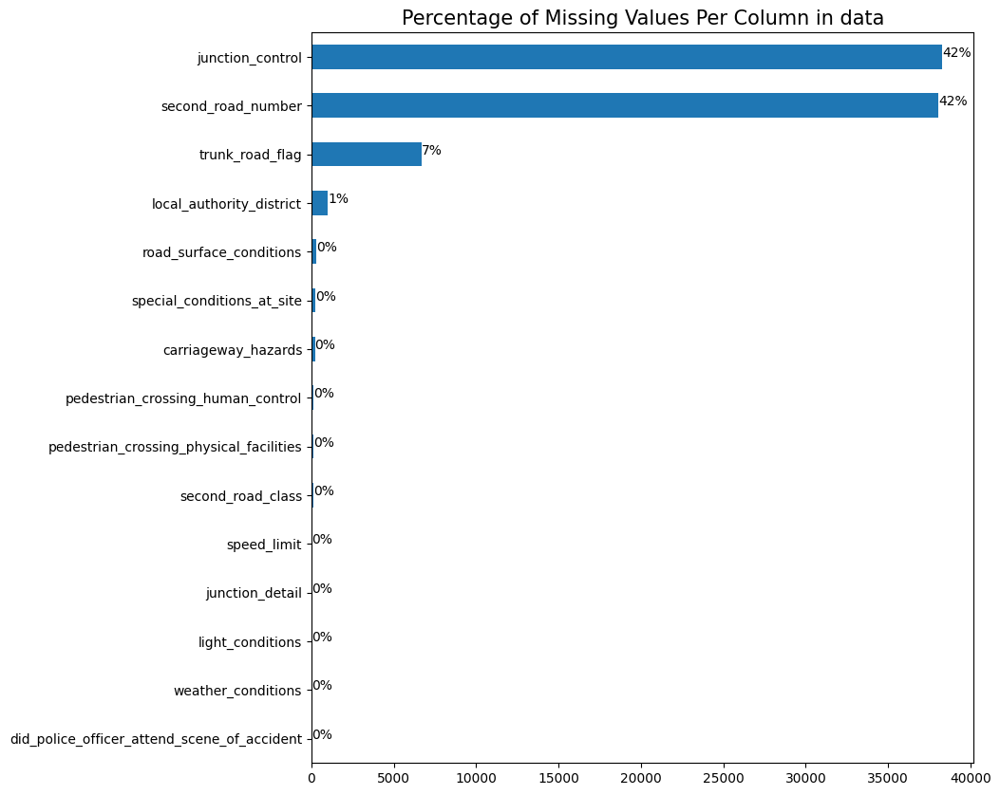

In [ ]:
# Replace -1 with NaN in the entire dataframe
Acc_df_New = Acc_df.replace(-1, np.nan)
# Plot missing values in
ax = Acc_df_New.isna().sum().sort_values(ascending = False)[:15][::-1].plot(kind = 'barh', figsize = (9, 10))
plt.title('Percentage of Missing Values Per Column in data', fontdict={'size':15})
for p in ax.patches:
    percentage ='{:,.0f}%'.format((p.get_width()/Acc_df_New.shape[0])*100)
    width, height =p.get_width(),p.get_height()
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y))

### cleaning columns that will be used for our analysis

#### columns contaning negative are all catigorical values and  will be filled with mode

[
       'local_authority_district','speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
        'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag']

In [ ]:
# Replace -1 with NaN in the entire dataframe
Acc_df = Acc_df.replace(-1, np.nan)

In [ ]:
def fillMissingcati(col, df):
    # Iterate through each column in the 'col' list
    for col_name in col:
        # Fill missing values with the most frequent value (mode) of the column
        df[col_name] = df[col_name].fillna(df[col_name].mode()[0])
    return df

# List of categorical columns that you want to fill missing values for
cati = [
       'local_authority_district','speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
        'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag']

# Call the function to fill missing values in the specified categorical columns
Acc_df = fillMissingcati(cati, Acc_df)

In [ ]:
# checking  if the changes has been made
Acc_df.isnull().sum()

accident_index                                 0
accident_year                                  0
accident_reference                             0
location_easting_osgr                          0
location_northing_osgr                         0
longitude                                      0
latitude                                       0
police_force                                   0
accident_severity                              0
number_of_vehicles                             0
number_of_casualties                           0
date                                           0
day_of_week                                    0
time                                           0
local_authority_district                       0
local_authority_ons_district                   0
local_authority_highway                        0
first_road_class                               0
first_road_number                              0
road_type                                      0
speed_limit         

In [ ]:
# check if  the columns have been added

Acc_df.shape

(91199, 38)

In [ ]:
# checking for duplicate
Acc_df.duplicated().sum()

0

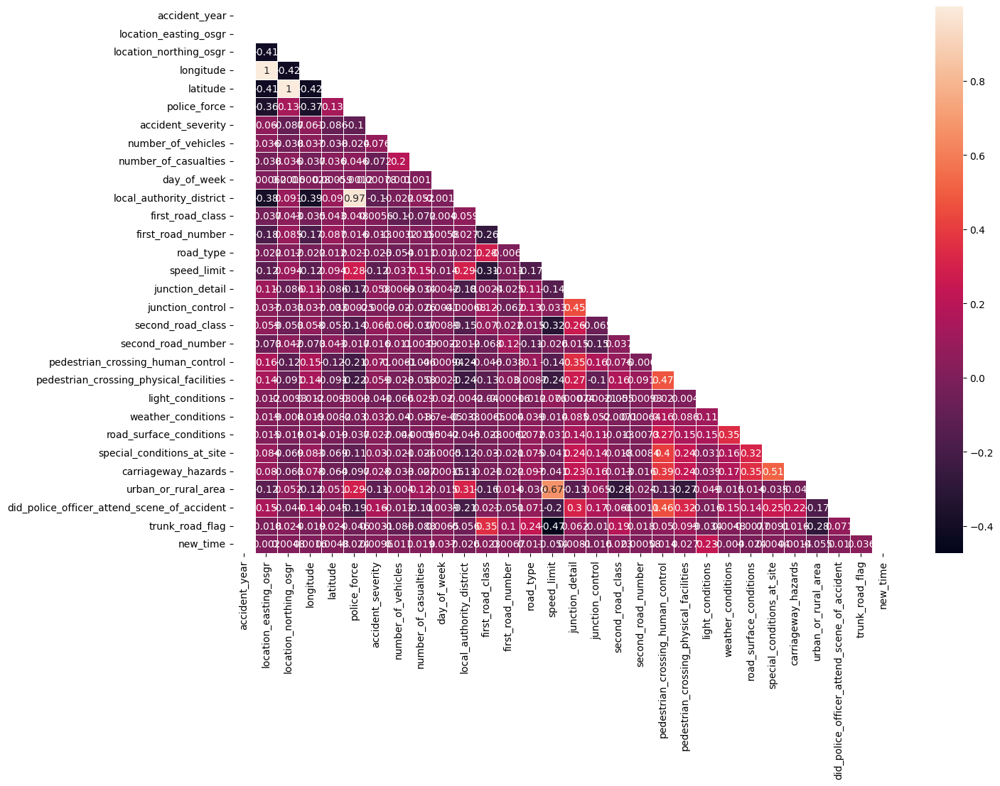

In [ ]:
#Heatmap to see correlations
plt.figure(figsize=(15,10))
corr=Acc_df.select_dtypes(include='number').corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, linewidths=.5,annot=True,mask=mask);

- The highest correlation is between second road class and juction control

### Vehicle Table cleaning

In [ ]:
# checking the first few rows of the vehicle column
Veh_df.head()

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
681716,681716,2020010219808,2020,010219808,1,9,9,5,1,5,0,0,0,0,0,0,4,9,6,2,32,6,1968,2,6,AUDI Q5,4,1
681717,681717,2020010220496,2020,010220496,1,9,0,4,2,6,0,2,0,0,0,0,1,1,2,1,45,7,1395,1,2,AUDI A1,7,1
681718,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,0,0,0,0,0,0,1,1,6,3,-1,-1,-1,-1,-1,-1,-1,-1
681719,681719,2020010228006,2020,010228006,1,8,0,18,1,5,0,0,0,0,0,0,1,1,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
681720,681720,2020010228011,2020,010228011,1,9,0,18,3,7,9,1,0,0,0,0,1,1,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1


In [ ]:
Veh_df.shape

(167375, 28)

In [ ]:
# Checking the column in the vehicle table
Veh_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 167375 entries, 681716 to 849090
Data columns (total 28 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     167375 non-null  int64 
 1   accident_index                    167375 non-null  object
 2   accident_year                     167375 non-null  int64 
 3   accident_reference                167375 non-null  object
 4   vehicle_reference                 167375 non-null  int64 
 5   vehicle_type                      167375 non-null  int64 
 6   towing_and_articulation           167375 non-null  int64 
 7   vehicle_manoeuvre                 167375 non-null  int64 
 8   vehicle_direction_from            167375 non-null  int64 
 9   vehicle_direction_to              167375 non-null  int64 
 10  vehicle_location_restricted_lane  167375 non-null  int64 
 11  junction_location                 167375 non-null  int64 
 1

- there are 167373 rows and 28 column in the vehicle table

In [ ]:
# checking for any missing values in the vehicle column
Veh_df.isnull().sum()

vehicle_index                       0
accident_index                      0
accident_year                       0
accident_reference                  0
vehicle_reference                   0
vehicle_type                        0
towing_and_articulation             0
vehicle_manoeuvre                   0
vehicle_direction_from              0
vehicle_direction_to                0
vehicle_location_restricted_lane    0
junction_location                   0
skidding_and_overturning            0
hit_object_in_carriageway           0
vehicle_leaving_carriageway         0
hit_object_off_carriageway          0
first_point_of_impact               0
vehicle_left_hand_drive             0
journey_purpose_of_driver           0
sex_of_driver                       0
age_of_driver                       0
age_band_of_driver                  0
engine_capacity_cc                  0
propulsion_code                     0
age_of_vehicle                      0
generic_make_model                  0
driver_imd_d

In [ ]:
# Remove leading spaces or tabs from column names
Veh_df.columns = Veh_df.columns.str.strip()

# Select the desired columns and calculate summary statistics
selected_columns = ["vehicle_type", "age_of_driver", "age_of_vehicle"]
description = Veh_df[selected_columns].describe()

print(description)


        vehicle_type  age_of_driver  age_of_vehicle
count  167375.000000  167375.000000   167375.000000
mean       10.051310      34.509658        5.820600
std        11.692412      20.797517        6.331929
min         1.000000      -1.000000       -1.000000
25%         9.000000      22.000000       -1.000000
50%         9.000000      34.000000        5.000000
75%         9.000000      49.000000       11.000000
max        98.000000     100.000000       96.000000


In [ ]:
Veh_df["sex_of_driver"].unique()


array([ 2,  1,  3, -1])

- There no missing values in the vehicle column

### cleaning negative values in vehicle  table

In [ ]:
# percentage of negative  values in each columns

missing_percentage_per_column = (Veh_df == -1).sum() / Veh_df.shape[0] * 100
print("Percentage of -1 values in each column:")
print(missing_percentage_per_column)

Percentage of -1 values in each column:
vehicle_index                        0.000000
accident_index                       0.000000
accident_year                        0.000000
accident_reference                   0.000000
vehicle_reference                    0.000000
vehicle_type                         0.000000
towing_and_articulation              0.411650
vehicle_manoeuvre                    0.405676
vehicle_direction_from               0.979836
vehicle_direction_to                 0.987603
vehicle_location_restricted_lane     0.382375
junction_location                    0.169679
skidding_and_overturning             0.395519
hit_object_in_carriageway            0.379985
vehicle_leaving_carriageway          0.384765
hit_object_off_carriageway           0.002390
first_point_of_impact                0.561016
vehicle_left_hand_drive              0.523973
journey_purpose_of_driver            0.109933
sex_of_driver                        0.007767
age_of_driver                       13.9

#### Visualizing the negative values in the vehicle column

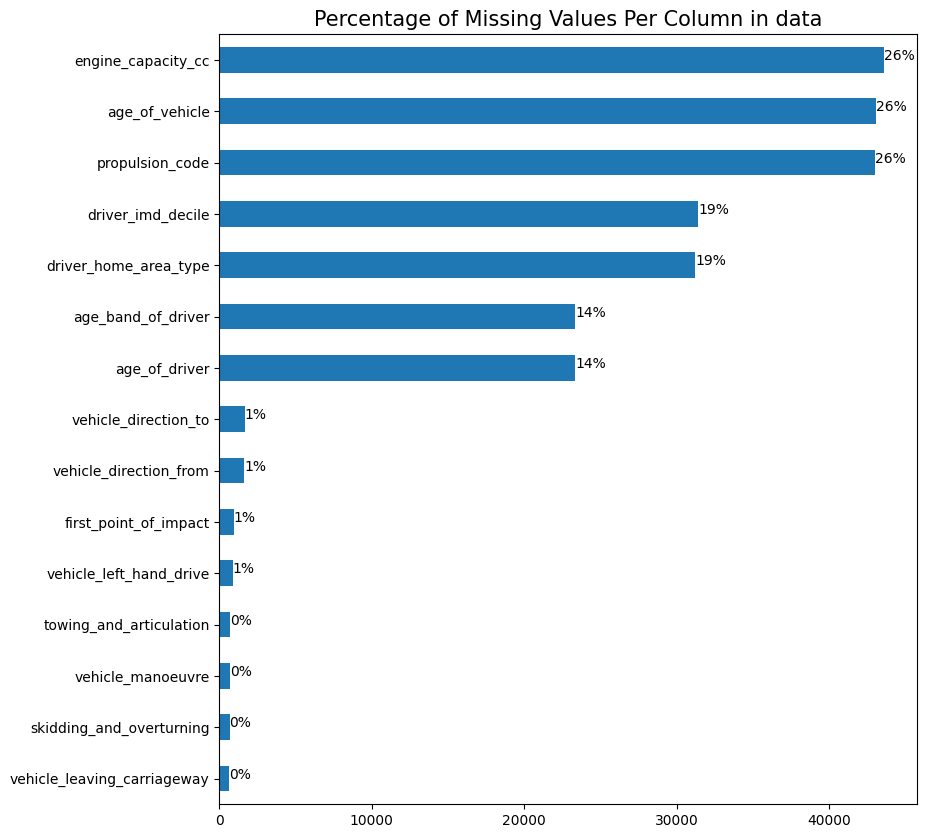

In [ ]:
# Replace -1 with NaN in the entire dataframe
Veh_df_New = Veh_df.replace(-1, np.nan)
# Plot missing values in
ax = Veh_df_New.isna().sum().sort_values(ascending = False)[:15][::-1].plot(kind = 'barh', figsize = (9, 10))
plt.title('Percentage of Missing Values Per Column in data', fontdict={'size':15})
for p in ax.patches:
    percentage ='{:,.0f}%'.format((p.get_width()/Veh_df_New.shape[0])*100)
    width, height =p.get_width(),p.get_height()
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y))

### columns to clean


       'towing_and_articulation', 'vehicle_manoeuvre',
       'vehicle_direction_from', 'vehicle_direction_to',
       'vehicle_location_restricted_lane', 'junction_location',
       'skidding_and_overturning', 'hit_object_in_carriageway',
       'vehicle_leaving_carriageway', 'hit_object_off_carriageway',
       'first_point_of_impact', 'vehicle_left_hand_drive',
       'journey_purpose_of_driver', 'sex_of_driver', 'age_of_driver',
       'age_band_of_driver', 'engine_capacity_cc', 'propulsion_code',
       'age_of_vehicle','driver_imd_decile',
       'driver_home_area_type'

In [ ]:
# Replace -1 with NaN in the entire dataframe
Veh_df = Veh_df.replace(-1, np.nan)

#### Filling the ge of driver

- fill it with , the median age between 17 and the oldest legal age was used to replace negative values

In [ ]:
# treating age of driver

# Calculate median for 'age_of_driver' values greater than or equal to 17
median_age = Veh_df[Veh_df['age_of_driver'] >= 17]['age_of_driver'].median()

# Fill NaN values with median age for values >= 17
Veh_df['age_of_driver'].fillna(median_age, inplace=True)

#### For the  contiues numerical columns, fill the missing value with median

In [ ]:
# filling the missing numeric variable

def fillMissingValues(col, df):
    # Calculate the median for each column in the 'col' list
    median_dict = {col_name: df[col_name].median() for col_name in col}

    # Fill missing values using the pre-calculated median for each column
    for col_name in col:
        df[col_name] = df[col_name].fillna(median_dict[col_name])

    return df

# List of numeric columns that you want to fill missing values for
numeri = ['engine_capacity_cc', 'age_of_vehicle']

# Call the function to fill missing values in the specified columns
Veh_df = fillMissingValues(numeri, Veh_df)


#### Fill the negetive values in the catigorical columns with mode

In [ ]:
def fillMissingcati(col, df):
    # Iterate through each column in the 'col' list
    for col_name in col:
        # Fill missing values with the most frequent value (mode) of the column
        df[col_name] = df[col_name].fillna(df[col_name].mode()[0])
    return df

# List of categorical columns that you want to fill missing values for
cati = [
       'towing_and_articulation', 'vehicle_manoeuvre',
       'vehicle_direction_from', 'vehicle_direction_to',
       'vehicle_location_restricted_lane', 'junction_location',
       'skidding_and_overturning', 'hit_object_in_carriageway',
       'vehicle_leaving_carriageway', 'hit_object_off_carriageway',
       'first_point_of_impact', 'vehicle_left_hand_drive',
       'journey_purpose_of_driver', 'sex_of_driver',
       'age_band_of_driver','propulsion_code',
       'driver_imd_decile',
       'driver_home_area_type']

# Call the function to fill missing values in the specified categorical columns
Veh_df = fillMissingcati(cati, Veh_df)

In [ ]:
# checking if the correction has been made
Veh_df.isnull().sum()

vehicle_index                       0
accident_index                      0
accident_year                       0
accident_reference                  0
vehicle_reference                   0
vehicle_type                        0
towing_and_articulation             0
vehicle_manoeuvre                   0
vehicle_direction_from              0
vehicle_direction_to                0
vehicle_location_restricted_lane    0
junction_location                   0
skidding_and_overturning            0
hit_object_in_carriageway           0
vehicle_leaving_carriageway         0
hit_object_off_carriageway          0
first_point_of_impact               0
vehicle_left_hand_drive             0
journey_purpose_of_driver           0
sex_of_driver                       0
age_of_driver                       0
age_band_of_driver                  0
engine_capacity_cc                  0
propulsion_code                     0
age_of_vehicle                      0
generic_make_model                  0
driver_imd_d

In [ ]:
Veh_df.shape

(167375, 28)

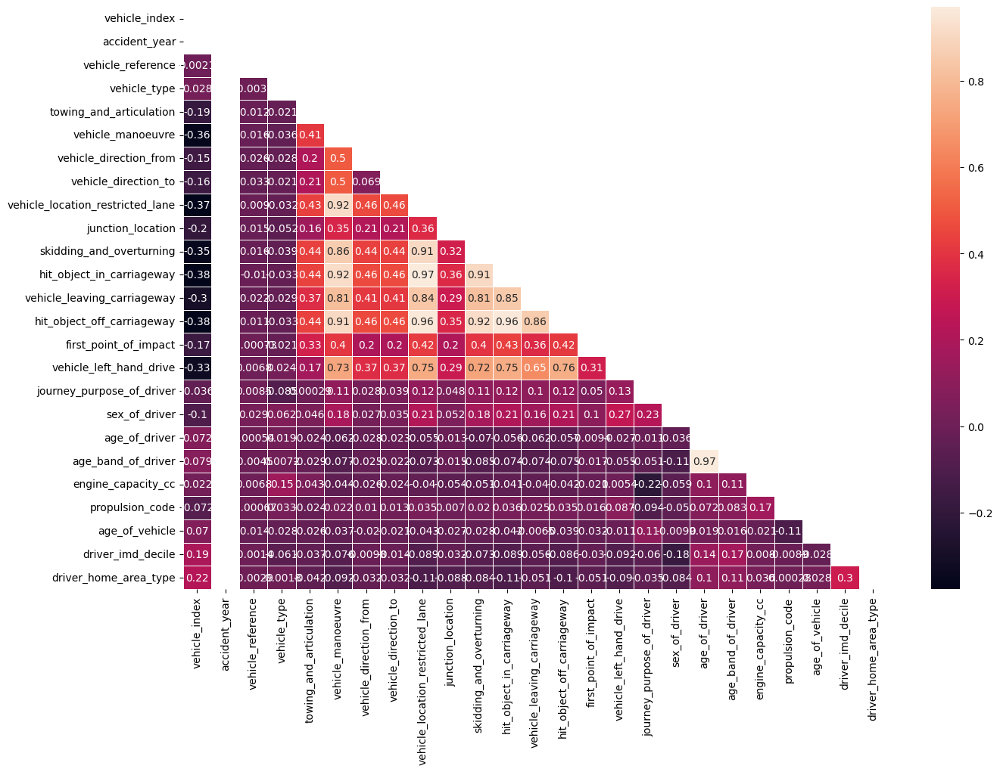

In [ ]:
#Heatmap to see correlations
plt.figure(figsize=(15,10))
corr=Veh_df.select_dtypes(include='number').corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, linewidths=.5,annot=True,mask=mask);

- There are higher correlations between columns in the vehicle table when compared to the accident table. This could suggest that vehicle-related factors have stronger relationships among themselves than the factors within the accident table. This observation could have implications for analyzing and understanding the data.

### Casualty table

In [ ]:
# checking the first few rows of the casualty colum
Cas_df.head()

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
484748,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
484749,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
484750,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
484751,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
484752,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3


In [ ]:
Cas_df.shape

(115584, 19)

In [ ]:
# checking the column and data type in the casualty columns
Cas_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115584 entries, 484748 to 600331
Data columns (total 19 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   casualty_index                      115584 non-null  int64 
 1   accident_index                      115584 non-null  object
 2   accident_year                       115584 non-null  int64 
 3   accident_reference                  115584 non-null  object
 4   vehicle_reference                   115584 non-null  int64 
 5   casualty_reference                  115584 non-null  int64 
 6   casualty_class                      115584 non-null  int64 
 7   sex_of_casualty                     115584 non-null  int64 
 8   age_of_casualty                     115584 non-null  int64 
 9   age_band_of_casualty                115584 non-null  int64 
 10  casualty_severity                   115584 non-null  int64 
 11  pedestrian_location               

In [ ]:
# checking for missing values

Cas_df.isnull().sum()

casualty_index                        0
accident_index                        0
accident_year                         0
accident_reference                    0
vehicle_reference                     0
casualty_reference                    0
casualty_class                        0
sex_of_casualty                       0
age_of_casualty                       0
age_band_of_casualty                  0
casualty_severity                     0
pedestrian_location                   0
pedestrian_movement                   0
car_passenger                         0
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
dtype: int64

- There are 11584 row and 19 columns in the casualty table. there are no missing values

### Cleaning the casualty columns

#### checking the negative values in the casuality column

In [ ]:
# percentage of negative  values in each columns

missing_percentage_per_column = (Cas_df == -1).sum() / Cas_df.shape[0] * 100
print("Percentage of -1 values in each column:")
print(missing_percentage_per_column)


Percentage of -1 values in each column:
casualty_index                        0.000000
accident_index                        0.000000
accident_year                         0.000000
accident_reference                    0.000000
vehicle_reference                     0.000000
casualty_reference                    0.000000
casualty_class                        0.000000
sex_of_casualty                       0.654070
age_of_casualty                       2.146491
age_band_of_casualty                  2.146491
casualty_severity                     0.000000
pedestrian_location                   0.001730
pedestrian_movement                   0.001730
car_passenger                         0.269068
bus_or_coach_passenger                0.019034
pedestrian_road_maintenance_worker    0.081326
casualty_type                         0.000000
casualty_home_area_type               9.310977
casualty_imd_decile                   9.439023
dtype: float64


#### visualizing the negative values

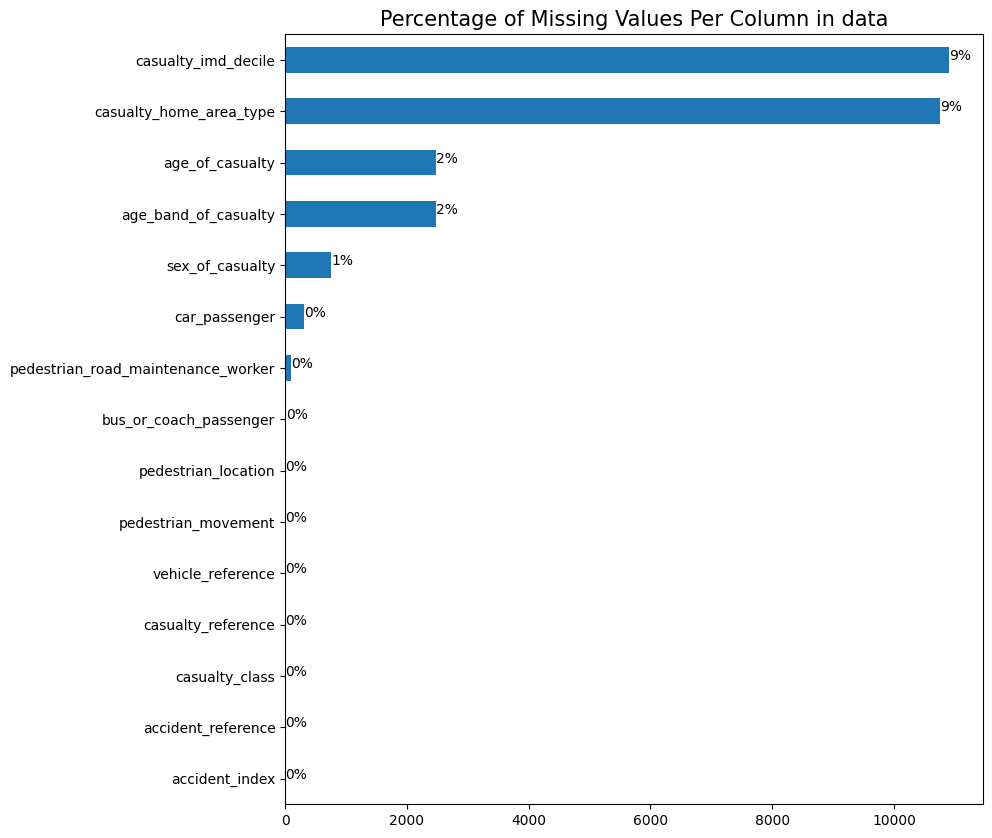

In [ ]:
# Replace -1 with NaN in the entire dataframe
Cas_df_New = Cas_df.replace(-1, np.nan)
# Plot missing values in
ax = Cas_df_New.isna().sum().sort_values(ascending = False)[:15][::-1].plot(kind = 'barh', figsize = (9, 10))
plt.title('Percentage of Missing Values Per Column in data', fontdict={'size':15})
for p in ax.patches:
    percentage ='{:,.0f}%'.format((p.get_width()/Cas_df_New.shape[0])*100)
    width, height =p.get_width(),p.get_height()
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y))

In [ ]:
# Replace -1 with NaN in the entire dataframe
Cas_df = Cas_df.replace(-1, np.nan)

#### columns to clean

['sex_of_casualty', 'age_of_casualty',
       'age_band_of_casualty', 'pedestrian_location',
       'pedestrian_movement', 'car_passenger', 'bus_or_coach_passenger',
       'pedestrian_road_maintenance_worker',
       'casualty_home_area_type', 'casualty_imd_decile']

### Fill the continuous numeric column with median

In [ ]:
# filling the missing numeric variable

def fillMissingValues(col, df):
    # Calculate the median for each column in the 'col' list
    median_dict = {col_name: df[col_name].median() for col_name in col}

    # Fill missing values using the pre-calculated median for each column
    for col_name in col:
        df[col_name] = df[col_name].fillna(median_dict[col_name])

    return df

# List of numeric columns that you want to fill missing values for
numeri = ['age_of_casualty']

# Call the function to fill missing values in the specified columns
Cas_df = fillMissingValues(numeri, Cas_df)

Fill the catigorical  column with mode

In [ ]:
def fillMissingcati(col, df):
    # Iterate through each column in the 'col' list
    for col_name in col:
        # Fill missing values with the most frequent value (mode) of the column
        df[col_name] = df[col_name].fillna(df[col_name].mode()[0])
    return df

# List of categorical columns that you want to fill missing values for
cati = ['sex_of_casualty', 'age_band_of_casualty', 'pedestrian_location',
        'pedestrian_movement', 'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker'
        , 'casualty_home_area_type', 'casualty_imd_decile']

# Call the function to fill missing values in the specified categorical columns
Cas_df = fillMissingcati(cati, Cas_df)

In [ ]:
# checking if the changes has been made
Cas_df.isnull().sum()

casualty_index                        0
accident_index                        0
accident_year                         0
accident_reference                    0
vehicle_reference                     0
casualty_reference                    0
casualty_class                        0
sex_of_casualty                       0
age_of_casualty                       0
age_band_of_casualty                  0
casualty_severity                     0
pedestrian_location                   0
pedestrian_movement                   0
car_passenger                         0
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
dtype: int64

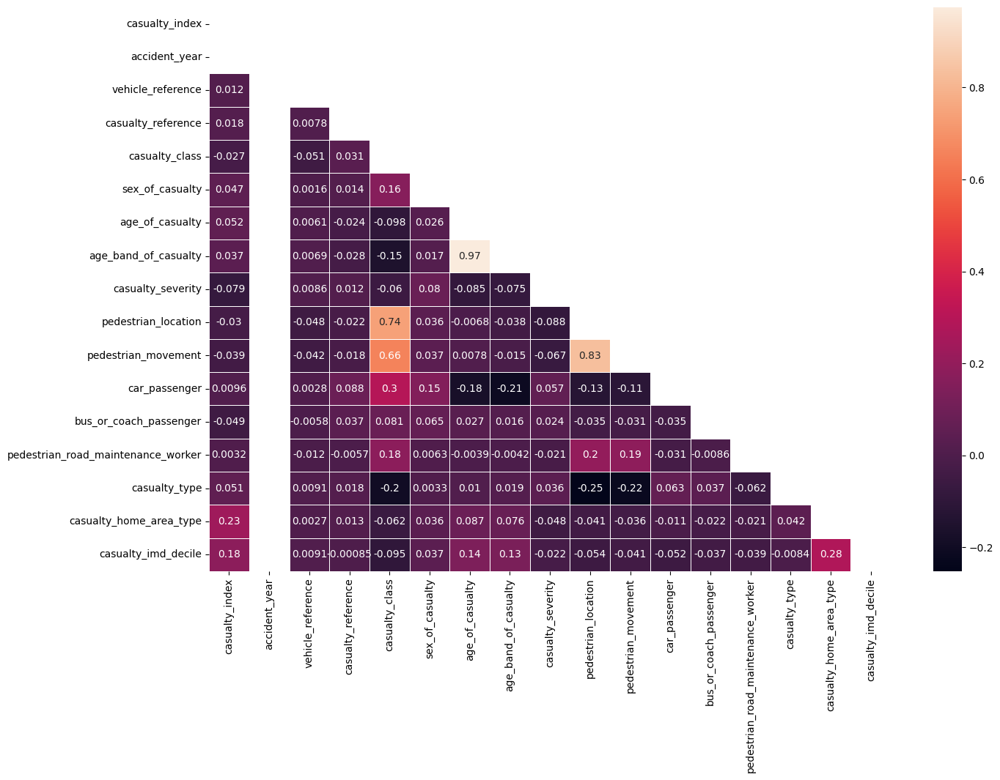

In [ ]:
#Heatmap to see correlations
plt.figure(figsize=(15,10))
corr=Cas_df.select_dtypes(include='number').corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, linewidths=.5,annot=True,mask=mask);

- There is a high correlaton between the age of casualty and sex of casualty. This will require further analysis

#### Integrating the accident, vehicle, and casualty data into a unified dataset.

In [ ]:
# joining accident, vehicle and casualty tables together

T2_df =Acc_df.merge(Veh_df,on="accident_index")
T1_df = T2_df.merge(Cas_df, on="accident_index")



Total_df1 =T1_df.copy()

Total_df1.head()

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,converted_time,new_time,vehicle_index,accident_year_y,accident_reference_y,vehicle_reference_x,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,casualty_index,accident_year,accident_reference,vehicle_reference_y,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,2020-02-04,3,09:00,10.0,E09000032,E09000032,6,0,6,20.0,0.0,4.0,0.0,0.0,9.0,9.0,1.0,9.0,9.0,0.0,0.0,1,3.0,2.0,E01004576,2023-08-14 09:00:00,9,681716,2020,010219808,1,9,9.0,5.0,1.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,9.0,6.0,2.0,32.0,6.0,1968.0,2.0,6.0,AUDI Q5,4.0,1.0,484748,2020,010219808,1,1,3,1.0,31.0,6.0,3,9.0,5.0,0.0,0.0,0.0,0,1.0,4.0
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,2020-04-27,2,13:55,9.0,E09000022,E09000022,3,3036,6,20.0,9.0,2.0,6.0,0.0,0.0,4.0,1.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01003034,2023-08-14 13:55:00,13,681717,2020,010220496,1,9,0.0,4.0,2.0,6.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,1.0,45.0,7.0,1395.0,1.0,2.0,AUDI A1,7.0,1.0,484749,2020,010220496,1,1,3,2.0,2.0,1.0,3,1.0,1.0,0.0,0.0,0.0,0,1.0,2.0
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,2020-04-27,2,13:55,9.0,E09000022,E09000022,3,3036,6,20.0,9.0,2.0,6.0,0.0,0.0,4.0,1.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01003034,2023-08-14 13:55:00,13,681717,2020,010220496,1,9,0.0,4.0,2.0,6.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,1.0,45.0,7.0,1395.0,1.0,2.0,AUDI A1,7.0,1.0,484750,2020,010220496,1,2,3,2.0,4.0,1.0,3,1.0,1.0,0.0,0.0,0.0,0,1.0,2.0
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,2020-01-01,4,01:25,1.0,E09000033,E09000033,5,0,6,30.0,3.0,1.0,6.0,0.0,0.0,0.0,4.0,1.0,2.0,0.0,0.0,1,1.0,2.0,E01004726,2023-08-14 01:25:00,1,681718,2020,010228005,1,9,0.0,18.0,1.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,6.0,3.0,38.0,6.0,1596.0,1.0,7.0,-1,2.0,1.0,484751,2020,010228005,1,1,3,1.0,23.0,5.0,3,5.0,9.0,0.0,0.0,0.0,0,1.0,3.0
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,2020-01-01,4,01:50,17.0,E09000025,E09000025,3,11,6,30.0,0.0,4.0,0.0,0.0,0.0,4.0,4.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01003617,2023-08-14 01:50:00,1,681719,2020,010228006,1,8,0.0,18.0,1.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,44.0,7.0,1798.0,8.0,8.0,TOYOTA PRIUS,2.0,1.0,484752,2020,010228006,1,1,3,1.0,47.0,8.0,2,4.0,1.0,0.0,0.0,0.0,0,1.0,3.0


In [ ]:
# checking the information in the total df
Total_df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 220435 entries, 0 to 220434
Data columns (total 83 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   accident_index                               220435 non-null  object        
 1   accident_year_x                              220435 non-null  int64         
 2   accident_reference_x                         220435 non-null  object        
 3   location_easting_osgr                        220435 non-null  float64       
 4   location_northing_osgr                       220435 non-null  float64       
 5   longitude                                    220435 non-null  float64       
 6   latitude                                     220435 non-null  float64       
 7   police_force                                 220435 non-null  int64         
 8   accident_severity                            220435 non-null  in

In [ ]:
# checking for duplicate
Total_df1.columns.duplicated().sum()

0

In [ ]:
# checking  for missing values
Total_df1.isnull().sum()

accident_index                        0
accident_year_x                       0
accident_reference_x                  0
location_easting_osgr                 0
location_northing_osgr                0
                                     ..
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
Length: 83, dtype: int64

In [ ]:
# number of rows and columns
Total_df1.shape


(220435, 83)

### Sweetviz profiling


In [ ]:
# Performing exploratory data analysis
!pip install sweetviz

import sweetviz as sv

# Perform EDA using sweetviz
report = sv.analyze(Total_df1)
report.show_html("eda_report.html")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 61.3 MB/s eta 0:00:00


                                             |          | [  0%]   00:00 -> (? left)

Report eda_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



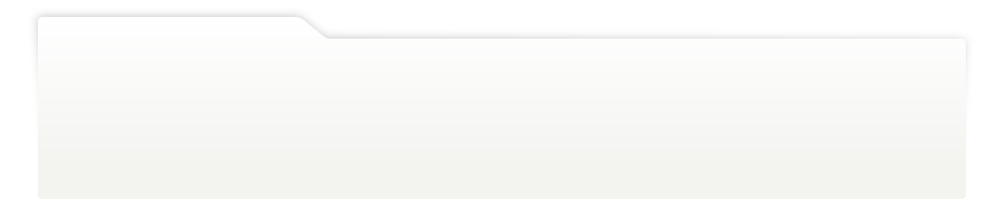
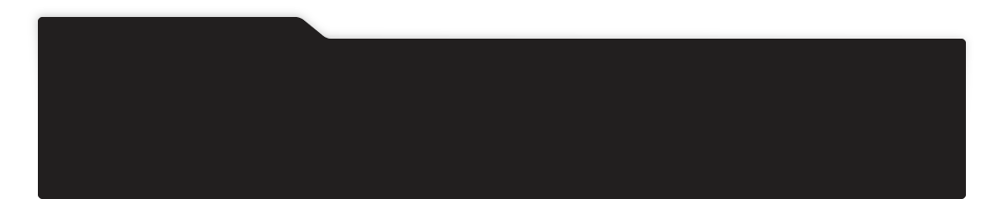
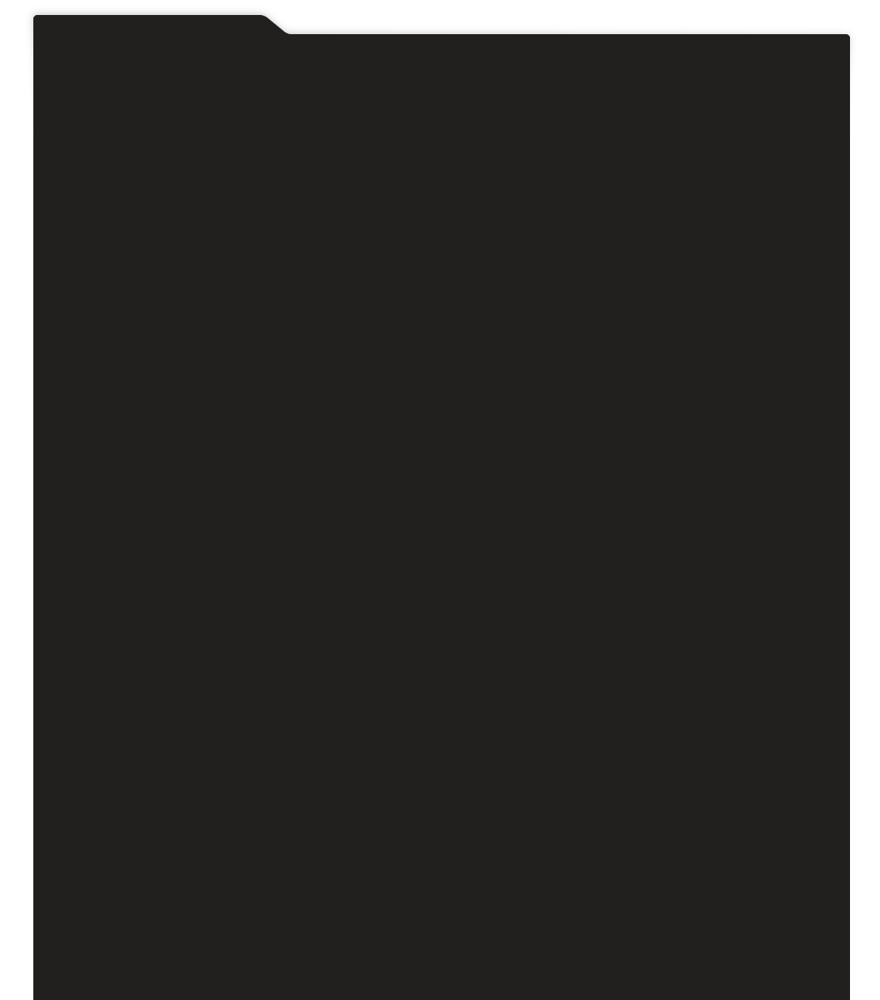
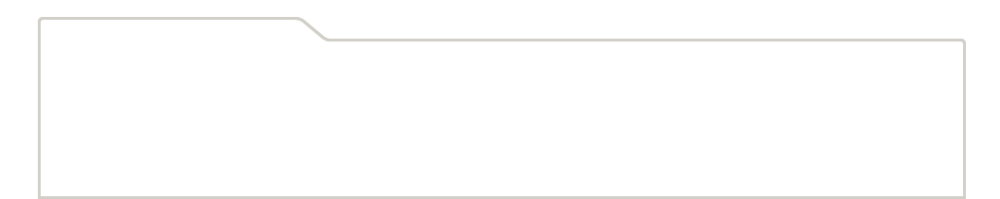
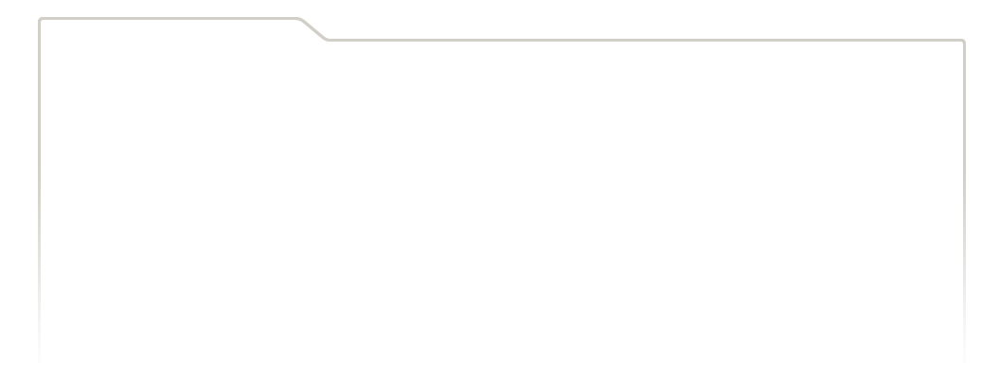
...
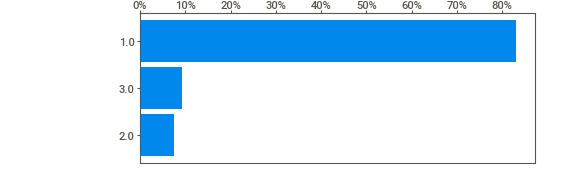
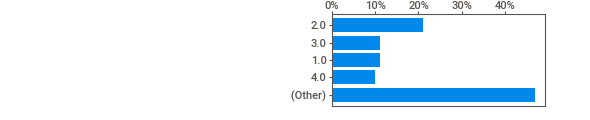
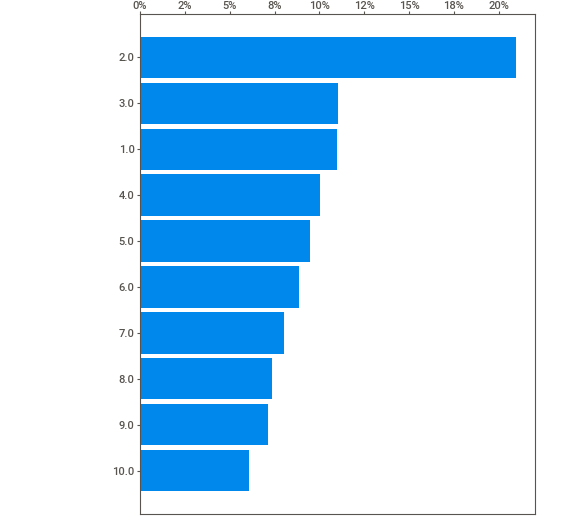
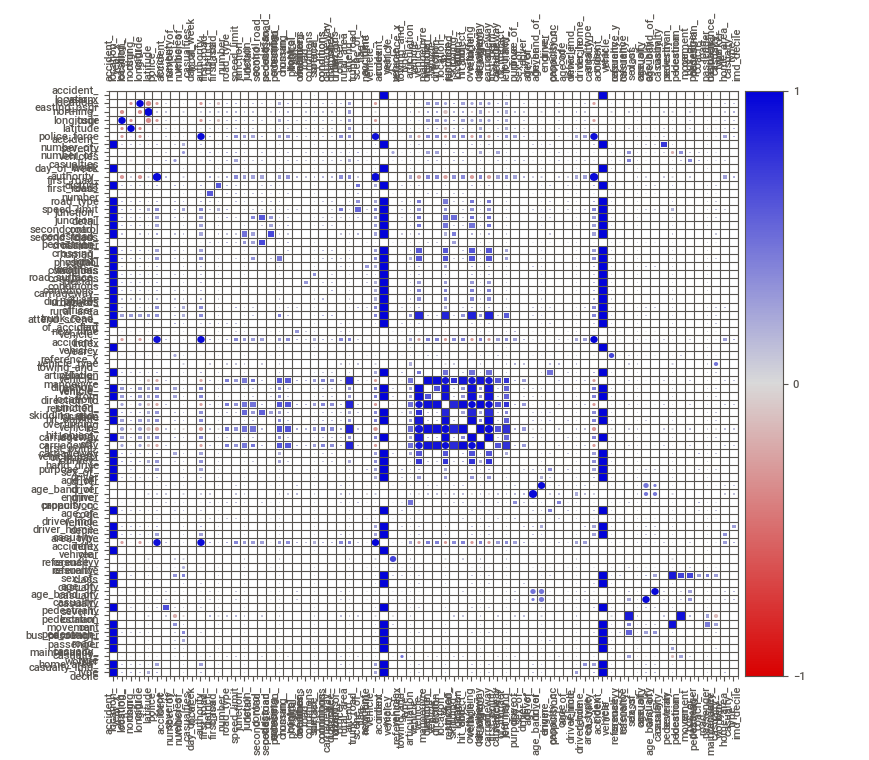
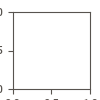

In [ ]:
# Import the necessary module for displaying the HTML content
from IPython.display import display, HTML

# Display the result using IPython display
display(HTML(filename="eda_report.html"))

 - There are 14 missing values in  the location_easting_osgr,                     location_northing_osgr,  longitude,   latitude, column of the accident table, of the 83 columns 24 of them have negative values.

 -the negative values is less than 1% for most columns. some columns has large number of missing values such as juction control = 42%,  age of vehicle = 22.9%, engine_capacity_cc =23%, age_of driver = 12.4%, vehicle typer =7.9%. etc  

 - The columns with the negative values are not needed for our intial analysis, and we need the negative values in our data for outlier analysis. the data cleaning will be done before building our classification model or before each question when necessary
  
 - before doing the data cleaning, question where columns with negative values are needed, a subsett of such columns without the negative values will be used. since the negative values are less than 1% of our data set in most of such column, it will not affect our analysis

# Exploratory Data Analysis

### Visualizing Accident Hotspot it the uk


In [ ]:
# Import necessary libraries

import folium
from folium.plugins import HeatMap

# Import KernelDensity from scikit-learn
from sklearn.neighbors import KernelDensity

# Select longitude and latitude columns from the Accident DataFrame
x = Acc_df[['longitude', 'latitude']]

# Set the kernel function and bandwidth for Kernel Density Estimation
kernel = 'gaussian'
bandwidth = 0.1

# Create a Kernel Density Estimation object
kde = KernelDensity(kernel=kernel, bandwidth=bandwidth)

# Train the Kernel Density Estimator using the selected data
kde.fit(x.values)

# Define the grid for density estimation
x_min, x_max = x['longitude'].min() - 0.1, x['longitude'].max() + 0.1
y_min, y_max = x['latitude'].min() - 0.1, x['latitude'].max() + 0.1
xx, yy = np.mgrid[x_min:x_max:200j, y_min:y_max:200j]
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Calculate the probability density for each grid point
z = np.exp(kde.score_samples(grid_points))
z = z.reshape(xx.shape)


In [ ]:
# Associate geographical locations with probability density values
data_with_density = pd.DataFrame({
    'latitude': grid_points[:, 1],  # Latitude data from grid_points
    'longitude': grid_points[:, 0],  # Longitude data from grid_points
    'Density': z.ravel()  # Reshaped density values from z
})

# Filter out data from high-density locations
data_with_density_filtered = data_with_density[data_with_density['Density'] > data_with_density['Density'].max() * 0.1]

# Create an interactive map and add HeatMap and marker layers
m = folium.Map(location=[Acc_df['latitude'].mean(), Acc_df['longitude'].mean()], zoom_start=6)
HeatMap(data_with_density_filtered[['latitude', 'longitude', 'Density']].values,
        name='Traffic Accidents Density',
        min_opacity=0.5,
        max_zoom=18,
        radius=15,
        blur=10,
        overlay=True).add_to(m)
m


-  - Interpreting the density plot, it becomes evident that a substantial concentration of accidents is centered around the major urban centers in the UK, namely London, Manchester, Liverpool, Leeds, and Birmingham.

#### Visualizing the  proportion of accident severity by catigories

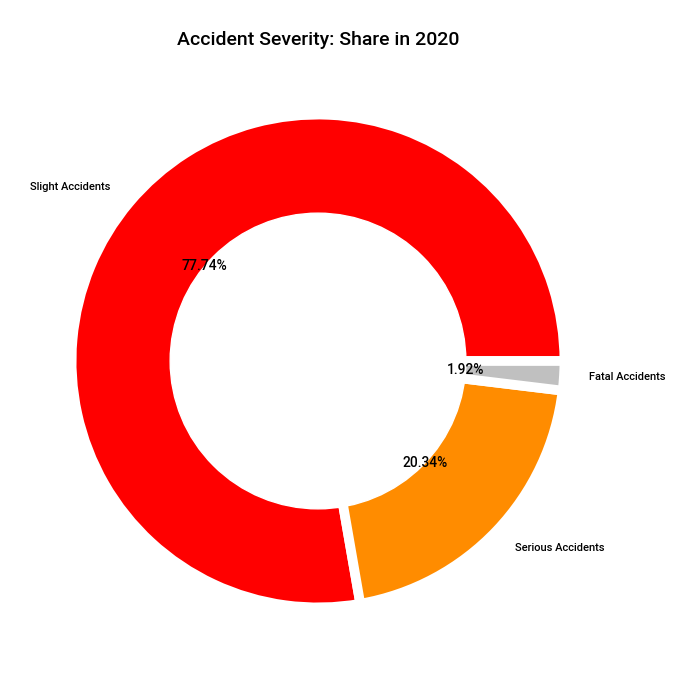

In [ ]:
# Visualizing the proportion of accident severity
# Get the counts of each accident severity level in the outlier_df DataFrame
slight = Total_df1.accident_severity.value_counts()[3]
serious = Total_df1.accident_severity.value_counts()[2]
fatal = Total_df1.accident_severity.value_counts()[1]

# Create a list of labels and corresponding counts
names = ['Slight Accidents', 'Serious Accidents', 'Fatal Accidents']
size = [slight, serious, fatal]

# Create a pie chart
plt.pie(x=size, labels=names, colors=['red', 'darkorange', 'silver'],
        autopct='%1.2f%%', pctdistance=0.6, textprops=dict(fontweight='bold'),
        wedgeprops={'linewidth': 7, 'edgecolor': 'white'})

# Create a circle for the center of the plot to make the pie chart look like a donut
my_circle = plt.Circle((0, 0), 0.6, color='white')

# Plot the donut chart
fig = plt.gcf()
fig.set_size_inches(8, 8)
fig.gca().add_artist(my_circle)
plt.title('\nAccident Severity: Share in 2020', fontsize=14, fontweight='bold')
plt.show()

- The overwhelming majority of accidents, around 80%, are categorized as "slight" incidents, while fatal accidents make up a mere 2% of the total accidents reported in the UK for the year 2020.

### Visualizing the distribution of accident by gender

#### checking the age band of drivers

In [ ]:
# checking the age band of driver
Total_df1['age_band_of_casualty'].value_counts()

6.0     54654
7.0     35201
8.0     30915
5.0     26022
4.0     21044
9.0     20155
10.0     9943
3.0      7690
11.0     7185
2.0      4488
1.0      3138
Name: age_band_of_casualty, dtype: int64

- I decided to exlcude the negtive values becasue it will skew the result if i use median or mode to fill it.

In [ ]:
# Using our newly constructed dataframe
age_df = pd.DataFrame()

# Separate male and female casualties and exclude unknown age bands (-1)
male = Total_df1[(Total_df1['sex_of_casualty'] == 1) & (Total_df1['age_band_of_casualty'] != -1)]
female = Total_df1[(Total_df1['sex_of_casualty'] == 2) & (Total_df1['age_band_of_casualty'] != -1)]

# List of age groups
group = ['0 - 5', '6 - 10', '11 - 15', '16 - 20', '21 - 25', '26 - 35', '36 - 45',
         '46 - 55', '56 - 65', '66 - 75', 'Over 75']

# Count the number of male casualties for each age group and store it in the 'male' column of age_df
age_df["male"] = male.groupby('age_band_of_casualty')['sex_of_casualty'].count() * -1

# Count the number of female casualties for each age group and store it in the 'female' column of age_df
age_df["female"] = female.groupby('age_band_of_casualty')['sex_of_casualty'].count()

# Store the age groups in the 'group_age' column of age_df
age_df["group_age"] = group

# age_df now contains the counts of male and female casualties for each age group
age_df


,male,female,group_age
age_band_of_casualty,,,
1.0,-1705,1433,0 - 5
2.0,-2445,2041,6 - 10
3.0,-4953,2731,11 - 15
4.0,-13696,7348,16 - 20
5.0,-16445,9577,21 - 25
6.0,-35879,18774,26 - 35
7.0,-22679,12522,36 - 45
8.0,-19232,11683,46 - 55
9.0,-12679,7476,56 - 65


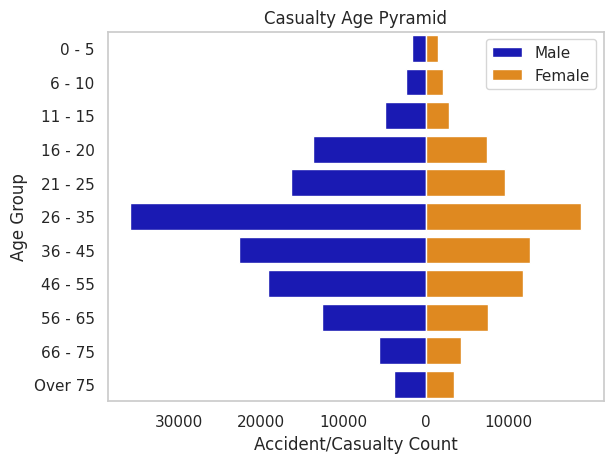

In [ ]:
# List of age classes
AgeClass = ['0-4','5-9', '10-14','15-19', '20-24','25-29', '30-34','35-39', '40-44',
            '45-49', '50-54', '55-59','60-64','65-69','70-74', '75-79','80-84',
            '85-89', '90-94', '95-99','100-104','105+']

# Set the seaborn theme to whitegrid for the plot
sns.set_theme(style="whitegrid")

# Plotting the Age pyramid
# Create a bar plot for male casualties
age_pyramid = sns.barplot(x='male', y='group_age', data=age_df, order=group, color=('mediumblue'), label='Male')

# Create a bar plot for female casualties, placing it on top of the male bar plot
age_pyramid = sns.barplot(x='female', y='group_age', data=age_df, order=group, color=('darkorange'), label='Female')

# Add a legend to differentiate between male and female bars
age_pyramid.legend()

# Set the x and y-axis labels
age_pyramid.set(xlabel='Accident/Casualty Count', ylabel='Age Group')

plt.xticks([-30000,-20000,-10000,0, 10000],[30000,20000,10000,0, 10000])
plt.grid(False)
# Set the title of the plot
plt.title('Casualty Age Pyramid')

plt.show()

In [ ]:
# Here, we use the combined database
# Create a new DataFrame 'age_df2' to store the counts of male and female drivers for each age group
age_df2 = pd.DataFrame()

# Separate male and female drivers and exclude unknown age bands (-1)
male = Total_df1[(Total_df1['sex_of_driver'] == 1) & (Total_df1['age_band_of_driver'] != -1)]
female = Total_df1[(Total_df1['sex_of_driver'] == 2) & (Total_df1['age_band_of_driver'] != -1)]

# List of age groups
group = ['0 - 5', '6 - 10', '11 - 15', '16 - 20', '21 - 25', '26 - 35', '36 - 45',
         '46 - 55', '56 - 65', '66 - 75', 'Over 75']

# Count the number of male drivers for each age group and store it in the 'male' column of age_df2
age_df2["male"] = male.groupby('age_band_of_driver')['sex_of_driver'].count() * -1

# Count the number of female drivers for each age group and store it in the 'female' column of age_df2
age_df2["female"] = female.groupby('age_band_of_driver')['sex_of_driver'].count()

# Store the age groups in the 'group_age' column of age_df2
age_df2["group_age"] = group

# age_df2 now contains the counts of male and female drivers for each age group
age_df2


,male,female,group_age
age_band_of_driver,,,
1.0,-27,8,0 - 5
2.0,-235,74,6 - 10
3.0,-1417,189,11 - 15
4.0,-10877,4022,16 - 20
5.0,-15559,6854,21 - 25
6.0,-39571,15984,26 - 35
7.0,-25107,10824,36 - 45
8.0,-21915,9537,46 - 55
9.0,-15037,5574,56 - 65


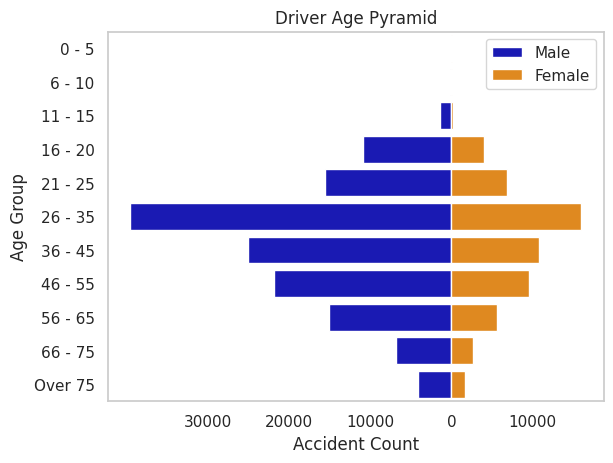

In [ ]:
#Visualizing the distribution of accident per Ageclass of driver

# Set the seaborn theme to whitegrid for the plot
sns.set_theme(style="whitegrid")

# Plotting the Age pyramid
# Create a bar plot for male drivers
age_pyramid = sns.barplot(x='male', y='group_age', data=age_df2, order=group, color=('mediumblue'), label='Male')

# Create a bar plot for female drivers, placing it on top of the male bar plot
age_pyramid = sns.barplot(x='female', y='group_age', data=age_df2, order=group, color=('darkorange'), label='Female')

# Add a legend to differentiate between male and female bars
age_pyramid.legend()

# Set the x and y-axis labels
age_pyramid.set(xlabel='Accident Count', ylabel='Age Group')

plt.xticks([-30000,-20000,-10000,0, 10000],[30000,20000,10000,0, 10000])
plt.grid(False)

# Set the title of the plot
plt.title('Driver Age Pyramid')


plt.show()

Upon analyzing the age of drivers and their involvement in accidents, the following trends were evident. Among drivers aged over 66 years, there were more male drivers than casualties, whereas among females of the same age, there were more casualties and fewer drivers. In general, there were more male casualties and male drivers compared to females. The age group most susceptible to accidents was between 26 and 35 years. Interestingly, the majority of drivers fell within the age range of 21 to 55, and coincidentally, most casualties also occurred within this age bracket. This suggests that individuals within this age range are more prone to both driving and being involved in accidents.

# Question 1

### 1 Are there significant hours of the day, and days of the week, on which accidents occur?


- #### 1a Significant hours of the day on which accidents occurs

In [ ]:
# Defining fuction to check the significant hour of the day
def hour_plot(data,title):
   # Group by 'new_time' and count the number of accidents in each hour
  hourly_accidents = data.groupby('new_time')['accident_index'].count().sort_values(ascending=False)

  # Calculate the total number of accidents
  total_accidents = hourly_accidents.sum()

  # Calculate the percentage of accidents for each hour
  hourly_percentages = (hourly_accidents / total_accidents) * 100

  # Create the bar plot
  plt.figure(figsize=(12, 8))  # Increase the size of the image
  bars = plt.bar(hourly_accidents.index, hourly_accidents.values, width=0.6)
  plt.xlabel('Hour of the Day',fontsize=18)
  plt.ylabel('Number of Accidents',fontsize=18)
  plt.title(title, fontsize=20)

  # Display percentages on top of the bars
  for bar, percentage in zip(bars, hourly_percentages):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')

  plt.xticks(hourly_accidents.index)

  plt.grid(False)  # Remove grid lines

  plt.tight_layout()
  plt.show()



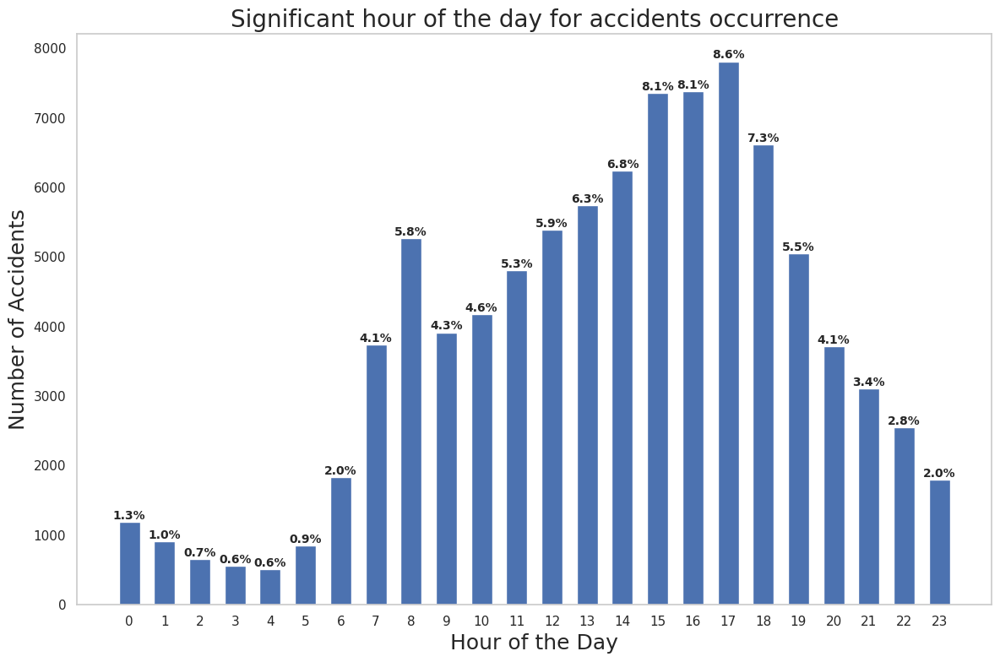

In [ ]:
# plot Significant Hour of the Day Accidents Occur

data = Acc_df
title = 'Significant hour of the day for accidents occurrence'
hour_plot(data, title)

- at lot of accident occurs in the morning around 8 am, how disproportionantly high amount accident occurs  saround 3 to 4 reaching peak at about 5 pm. this correspond to the rush our period when people go the work in the morning and leave work in the eveing.

###  1b  Are there significant  days of the week, on which accidents occur?



In [ ]:
# define fuction plot occurance per week
def plot_countplot_with_percentage(data, title):
    # Use this to order your labels
    order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

    # Set the size of the figure
    sns.set(rc={'figure.figsize': (12, 6)})  # Smaller figure size

    # Set the seaborn style to whitegrid to remove background and add gridlines
    sns.set_style("whitegrid")

    # Set the font size for the x and y-axis labels
    plt.rc('xtick', labelsize=12)
    plt.rc('ytick', labelsize=12)

    # Create the count plot with seaborn
    ax = sns.countplot(x='day_of_week', data=data, color='blue')  # Set color to blue

    # Annotate the bars with the percentage at the top
    for p in ax.patches:
        patch_height = p.get_height()
        if np.isnan(patch_height):
            patch_height = 0
        # Display the percentage with one decimal point
        percentage = (patch_height / len(data)) * 100
        ax.annotate('{:.1f}%'.format(percentage), (p.get_x() + p.get_width() / 2, patch_height + 50),
                    ha='center', va='bottom', fontsize=10, fontweight='bold')

    # Set labels and title
    ax.set(xlabel='Days of the Week', ylabel='Accident occurrence', title=title)

    # Set the tick labels according to the specified order
    ax.set_xticklabels(order)

    # Set the font size for the x and y-axis labels and the title
    plt.xlabel('Days of the Week', fontsize=18)
    plt.ylabel('Accident occurrence', fontsize=18)
    plt.title(title, fontsize=20)

    plt.grid(False)  # Remove grid lines

    plt.show()  # Show the plot without assigning it to a variable



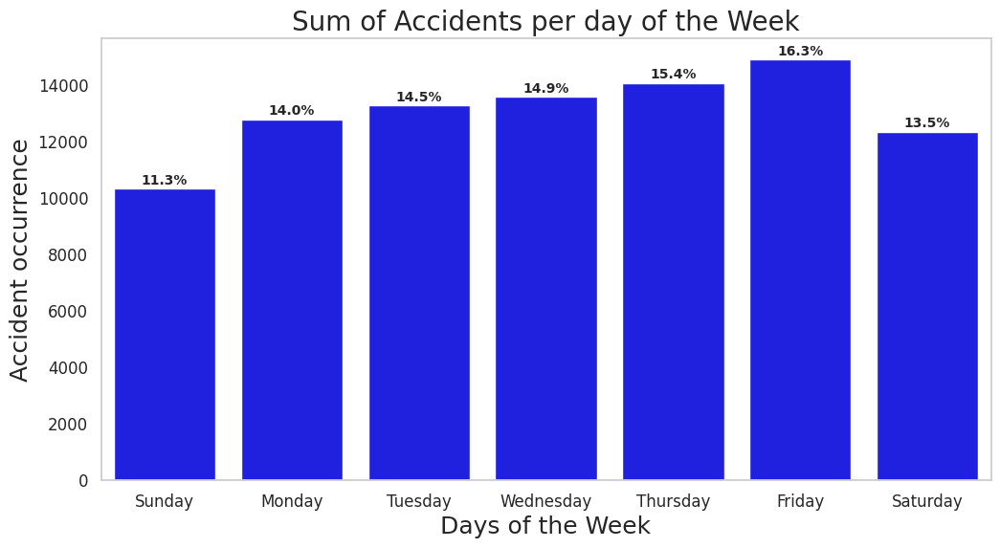

In [ ]:
# plot occurance of accident per day of the week
data = Acc_df
title = 'Sum of Accidents per day of the Week'
plot_countplot_with_percentage(data, title)

Most accidents are concentrated during weekdays, accounting for approximately 75% of the total accidents, whereas only 25% occur during the weekends. In terms of frequency per weekday, accident occurrences increase gradually from about 11% on Sundays to 14% on Mondays. As the week progresses, the incidence of accidents rises, culminating in a peak of about 16% on Fridays, before experiencing a sharp decline on Saturdays. This peak on Fridays corresponds to the time when people rush home for the weekend, resulting in heightened vehicular activity on the roads

### visualizing the distribution of accidents during the rush hour period (3 to 5 pm)

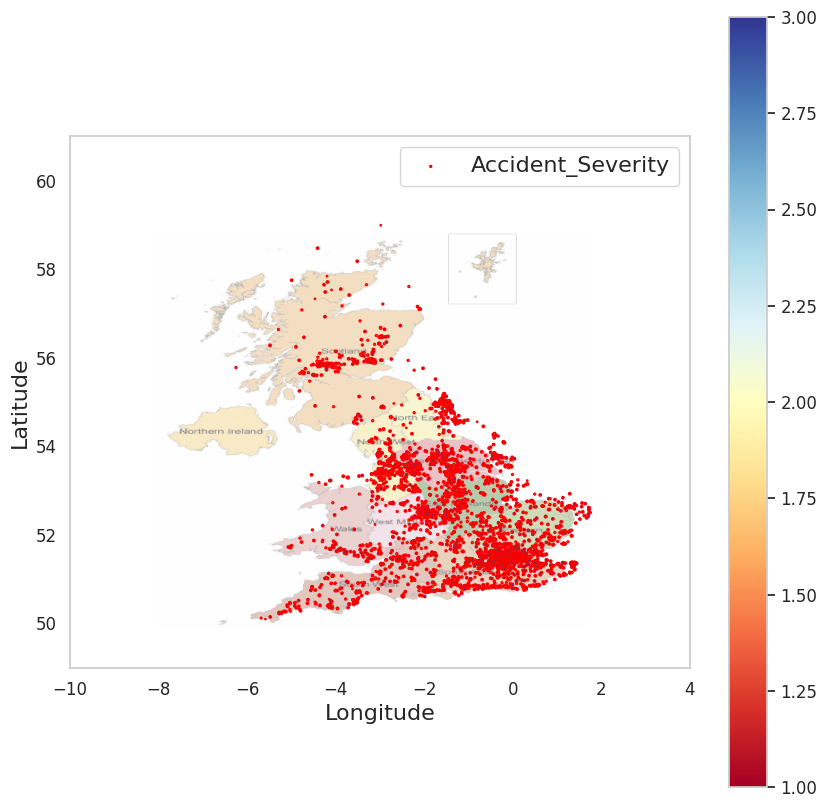

In [ ]:
# importing libary
import matplotlib.image as mpimg

# Filter the DataFrame to include only rows with 'new_time' in busy hours (15, 16, 17)
Acc_df["Busy_hour"] = Acc_df["new_time"].isin([15, 16, 17]).astype(int)
ddf_df = Acc_df[Acc_df["Busy_hour"] > 0]

# Select the features for plotting
features = ['longitude', 'latitude', 'day_of_week', 'accident_severity']
x = ddf_df.loc[:, features].values

# This section will only plot after geospatial clustering has been analyzed
fig = plt.figure(figsize=(10, 10))

# Extract the required data for plotting
long = x[:, 0]
lat = x[:, 1]
siz = ddf_df['accident_severity']
colr = ddf_df['accident_severity']

# Create the scatter plot for accident severity
sc = plt.scatter(long[::5], lat[::5], s=siz[::5], label='Accident_Severity',
                 c=colr[::5], cmap=plt.get_cmap('RdYlBu'), edgecolor="red")

# Load the UK map image and plot it with alpha transparency
UK_img = mpimg.imread('/content/drive/MyDrive/data science /hull online/Ailead/SQL/Map-of-Government-Office-Regions-GORs.png')
plt.imshow(UK_img, extent=[-8.8, 2.2, 49.7, 59], alpha=0.5)

# Set the limits for the plot
plt.ylim(49, 61)
plt.xlim(-10, 4)

# Set the x and y-axis labels
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)

# Set the legend
plt.legend(fontsize=16)

# Add a colorbar for the accident severity
plt.colorbar(sc)

# remove grid
plt.grid(False)
# Display the plot
plt.show()


A considerable number of accidents are observed in the morning, particularly around 8 am. However, a disproportionately high incidence of accidents occurs between 3 to 4 pm, reaching its peak at approximately 5 pm. This temporal pattern aligns with the rush hour period, coinciding with the morning and evening commutes when individuals are en route to and from their workplaces.

Most accidents are concentrated during weekdays, accounting for approximately 75% of the total accidents, whereas only 25% occur during the weekends. In terms of frequency per weekday, accident occurrences increase gradually from about 11% on Sundays to 14% on Mondays. As the week progresses, the incidence of accidents rises, culminating in a peak of about 16% on Fridays, before experiencing a sharp decline on Saturdays. This peak on Fridays corresponds to the time when people rush home for the weekend, resulting in heightened vehicular activity on the roads.

Significant clusters of accidents are found at the geographic boundaries between the East and West Midlands and the Eastern and South East regions of the UK. Additionally, a substantial number of accidents are recorded around the London metropolis. In contrast, the lowest number of accidents was documented in Scotland.

# Question 2


### Question 2 For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

In [ ]:
# checking the unique types
Veh_df.vehicle_type.unique()

array([ 9,  8,  3,  2, 11,  1, 90, 19,  4,  5, 21, 97, 20, 98, 10, 17, 23,
       22, 18, 16])

In [ ]:
# selecting Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.
veh_cat = [2,3,4,5]

Veh_sub = Veh_df[Veh_df["vehicle_type"].isin(veh_cat)]


In [ ]:
# sanity check
# checking the unique types
Veh_sub.vehicle_type.unique()

array([3, 2, 4, 5])

###  Join accident and vehicle data

In [ ]:
# join accident and vehicle table

acc_veh_df = pd.merge(Acc_df, Veh_sub, on ="accident_index")

acc_veh_df.head()

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,converted_time,new_time,vehicle_index,accident_year_y,accident_reference_y,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010228020,2020,010228020,529718.0,192342.0,-0.127840,51.614971,1,3,2,1,2020-01-01,4,03:25,32.0,E09000010,E09000010,3,406,3,30.0,6.0,2.0,3.0,406.0,0.0,5.0,4.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01001530,2023-08-14 03:25:00,3,681728,2020,010228020,1,3,0.0,3.0,7.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,1.0,6.0,1.0,37.0,7.0,114.0,1.0,5.0,YAMAHA XC115,8.0,1.0
1,2020010228077,2020,010228077,531477.0,174550.0,-0.109087,51.454673,1,2,2,1,2020-01-01,4,08:00,9.0,E09000022,E09000022,3,2214,6,30.0,3.0,4.0,6.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01003074,2023-08-14 08:00:00,8,681748,2020,010228077,2,2,0.0,18.0,8.0,4.0,9.0,6.0,5.0,4.0,3.0,11.0,1.0,1.0,6.0,1.0,19.0,4.0,1596.0,1.0,7.0,-1,5.0,1.0
2,2020010228086,2020,010228086,531043.0,176304.0,-0.114680,51.470537,1,3,1,1,2020-01-01,4,14:00,9.0,E09000022,E09000022,6,0,6,20.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01003186,2023-08-14 14:00:00,14,681749,2020,010228086,1,3,0.0,18.0,7.0,3.0,9.0,0.0,0.0,11.0,0.0,0.0,1.0,1.0,6.0,3.0,38.0,6.0,1596.0,1.0,7.0,-1,2.0,1.0
3,2020010228097,2020,010228097,528428.0,179923.0,-0.150994,51.503659,1,3,2,1,2020-01-01,4,14:37,1.0,E09000033,E09000033,3,4202,3,30.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01004761,2023-08-14 14:37:00,14,681752,2020,010228097,2,3,0.0,18.0,1.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,6.0,1.0,20.0,4.0,125.0,1.0,4.0,PEUGEOT TWEET 125,6.0,1.0
4,2020010228148,2020,010228148,518467.0,185248.0,-0.292651,51.553691,1,3,1,1,2020-01-01,4,19:05,28.0,E09000005,E09000005,3,404,6,30.0,3.0,2.0,3.0,4089.0,2.0,4.0,4.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01000635,2023-08-14 19:05:00,19,681774,2020,010228148,1,3,0.0,14.0,5.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,6.0,1.0,20.0,4.0,125.0,1.0,0.0,HONDA GLR 125,2.0,1.0


### Question 2a For motobike significant hours of the day on which accidents occur

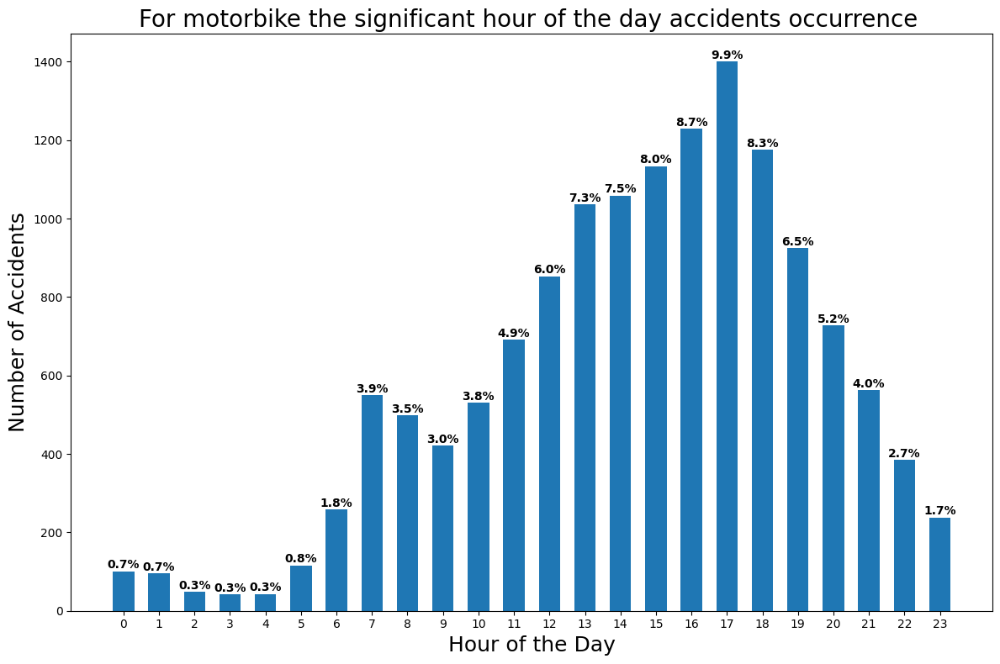

In [ ]:
# plot Significant Hour of the day accidents Occurs

data = acc_veh_df
title = 'For motorbike the significant hour of the day accidents occurrence '
hour_plot(data, title)

 ###  2b  significant  days of the week on which accidents occur

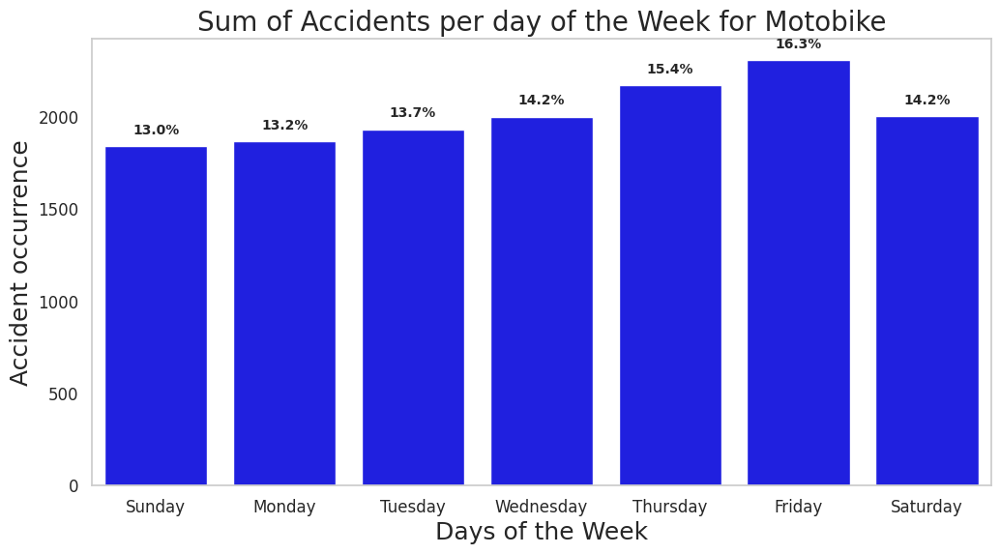

In [ ]:
# plot occurance of motobike accident per day of the week
data = acc_veh_df
title = 'Sum of Accidents per day of the Week for Motobike'
plot_countplot_with_percentage(data, title)

### showing the occurance of the different bike perday of the wee

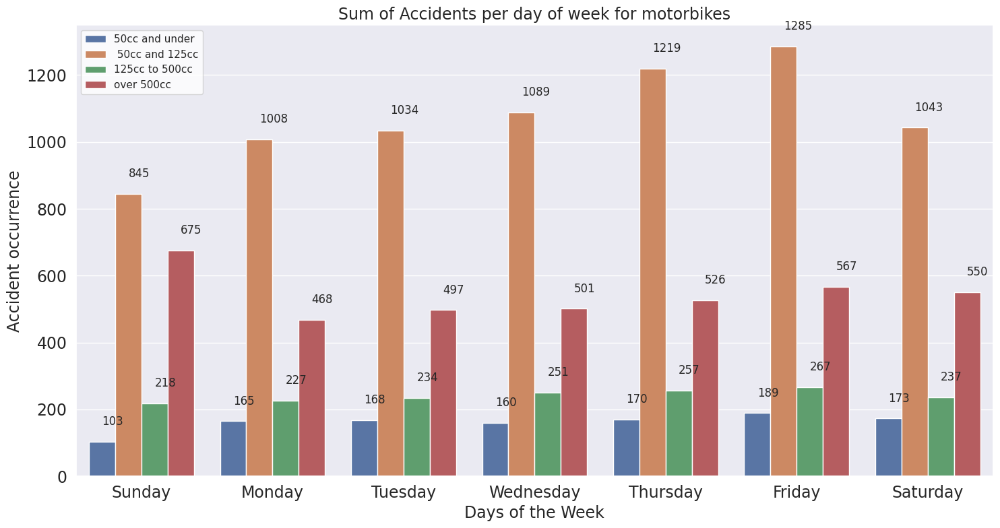

In [ ]:
# showing the occurance of the different bike perday of the week

# Define the order of days of the week for plotting
order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Set the figure size and font sizes for plotting
sns.set(rc={'figure.figsize': (15, 8)})
plt.rc('xtick', labelsize=17)
plt.rc('ytick', labelsize=17)

# Create a countplot to visualize the relationship between days of the week and accident occurrences involving motorbikes
ax = sns.countplot(x='day_of_week',
                   hue='vehicle_type',
                   data=acc_veh_df)

# Set the seaborn style to whitegrid to remove background and add gridlines
sns.set_style("whitegrid")

# Annotate each bar in the countplot with its corresponding count
for p in ax.patches:
    patch_height = p.get_height()
    if np.isnan(patch_height):
        patch_height = 0
    ax.annotate('{}'.format(int(patch_height)), (p.get_x() + 0.1, patch_height + 50))

# Set labels and titles for the plot
ax.set(xlabel='Days of the Week', ylabel='Accident occurrence',
       title='Sum of Accidents per day of week for motorbikes')
ax.set_xticklabels(order)
plt.xlabel('Days of the Week', fontsize=17)
plt.ylabel('Accident occurrence', fontsize=17)
plt.title('Sum of Accidents per day of week for motorbikes', fontsize=17)

# Add a legend to the plot
plt.legend(labels=['50cc and under', ' 50cc and 125cc', '125cc to 500cc', 'over 500cc'], loc=2)

plt.tight_layout()
# Display the plot
plt.show()


The majority of motorcycle accidents predominantly take place between 3 pm and 6 pm, with a notable peak occurring around 5 pm. This temporal pattern coincides with the rush hour period, characterized by a substantial presence of vehicles, motorcycles, and pedestrians on the roads. Regarding the occurrence of motorcycle accidents throughout the week, a prevailing trend is observed, with approximately 73% of such accidents transpiring during weekdays, while only 23% occur during the weekends.  
The occurrence of motorcycle accidents exhibits a gradual increase, commencing at approximately 13% on Sundays and culminating in a peak of 16.3% on Fridays, which corresponds to the period of heightened weekend rush activity.

all  motobike follows this trend except for motobike with engine capacity over 500 were accident occur predominantly on sundays

# Question 3

### Question 3 For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

In [ ]:
Cas_df.head()

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
484748,484748,2020010219808,2020,010219808,1,1,3,1.0,31.0,6.0,3,9.0,5.0,0.0,0.0,0.0,0,1.0,4.0
484749,484749,2020010220496,2020,010220496,1,1,3,2.0,2.0,1.0,3,1.0,1.0,0.0,0.0,0.0,0,1.0,2.0
484750,484750,2020010220496,2020,010220496,1,2,3,2.0,4.0,1.0,3,1.0,1.0,0.0,0.0,0.0,0,1.0,2.0
484751,484751,2020010228005,2020,010228005,1,1,3,1.0,23.0,5.0,3,5.0,9.0,0.0,0.0,0.0,0,1.0,3.0
484752,484752,2020010228006,2020,010228006,1,1,3,1.0,47.0,8.0,2,4.0,1.0,0.0,0.0,0.0,0,1.0,3.0


In [ ]:
# to get the detail of pedistrian

Ped = Cas_df[Cas_df["casualty_class"] == 3]

In [ ]:
# join accident and vehicle table

acc_cas_df = pd.merge(Acc_df, Ped, on ="accident_index")

acc_cas_df.head()

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,converted_time,new_time,Busy_hour,casualty_index,accident_year_y,accident_reference_y,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,2020-02-04,3,09:00,10.0,E09000032,E09000032,6,0,6,20.0,0.0,4.0,0.0,0.0,9.0,9.0,1.0,9.0,9.0,0.0,0.0,1,3.0,2.0,E01004576,2023-08-13 09:00:00,9,0,484748,2020,010219808,1,1,3,1.0,31.0,6.0,3,9.0,5.0,0.0,0.0,0.0,0,1.0,4.0
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,2020-04-27,2,13:55,9.0,E09000022,E09000022,3,3036,6,20.0,9.0,2.0,6.0,0.0,0.0,4.0,1.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01003034,2023-08-13 13:55:00,13,0,484749,2020,010220496,1,1,3,2.0,2.0,1.0,3,1.0,1.0,0.0,0.0,0.0,0,1.0,2.0
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,2020-04-27,2,13:55,9.0,E09000022,E09000022,3,3036,6,20.0,9.0,2.0,6.0,0.0,0.0,4.0,1.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01003034,2023-08-13 13:55:00,13,0,484750,2020,010220496,1,2,3,2.0,4.0,1.0,3,1.0,1.0,0.0,0.0,0.0,0,1.0,2.0
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,2020-01-01,4,01:25,1.0,E09000033,E09000033,5,0,6,30.0,3.0,1.0,6.0,0.0,0.0,0.0,4.0,1.0,2.0,0.0,0.0,1,1.0,2.0,E01004726,2023-08-13 01:25:00,1,0,484751,2020,010228005,1,1,3,1.0,23.0,5.0,3,5.0,9.0,0.0,0.0,0.0,0,1.0,3.0
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,2020-01-01,4,01:50,17.0,E09000025,E09000025,3,11,6,30.0,0.0,4.0,0.0,0.0,0.0,4.0,4.0,1.0,1.0,0.0,0.0,1,1.0,2.0,E01003617,2023-08-13 01:50:00,1,0,484752,2020,010228006,1,1,3,1.0,47.0,8.0,2,4.0,1.0,0.0,0.0,0.0,0,1.0,3.0


### 3a Significant hour of day of accident involving pedestrians

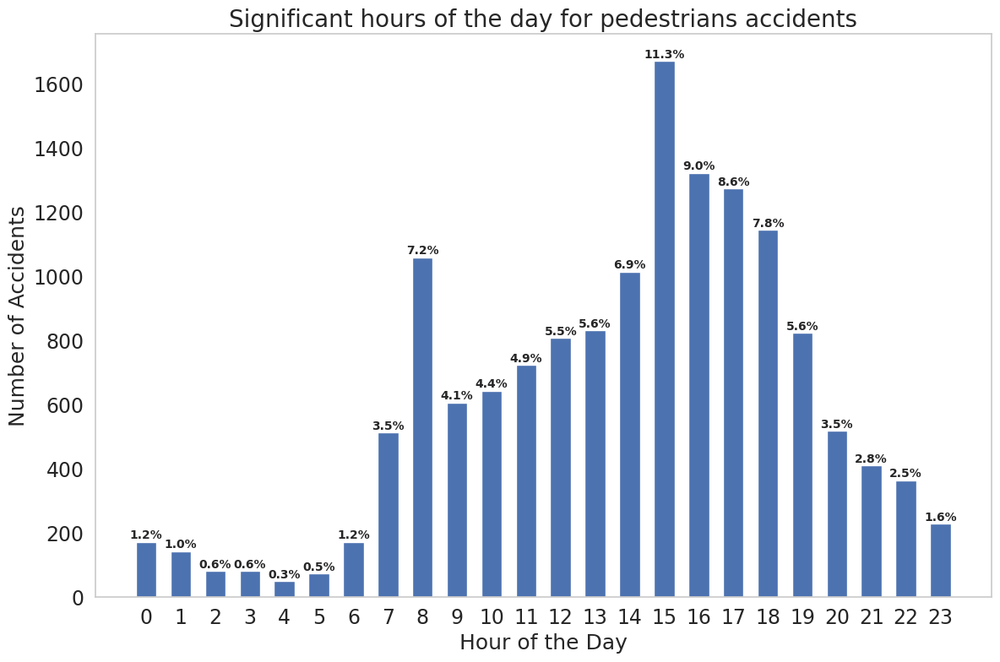

In [ ]:
# plot Significant Hour of the Day  for pedestrian

data = acc_cas_df
title = 'Significant hours of the day for pedestrians accidents'
hour_plot(data, title)

### 3b Significant day of the week of accident involving pedestrians

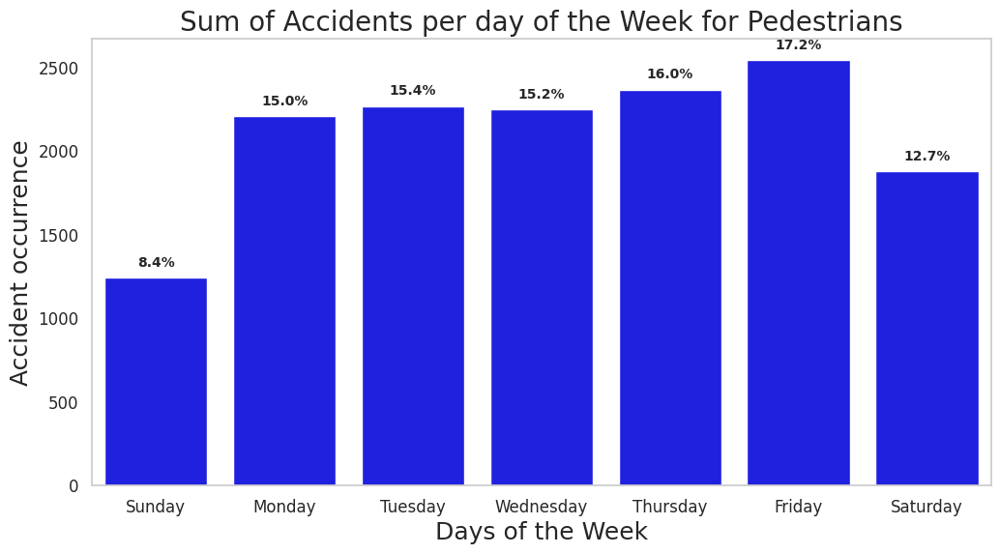

In [ ]:

# plot sum of accident occurance per day of the week for pedestrians

data = acc_cas_df
title = 'Sum of Accidents per day of the Week for Pedestrians'
plot_countplot_with_percentage(data, title)


### investigating accident occurance by casaulty

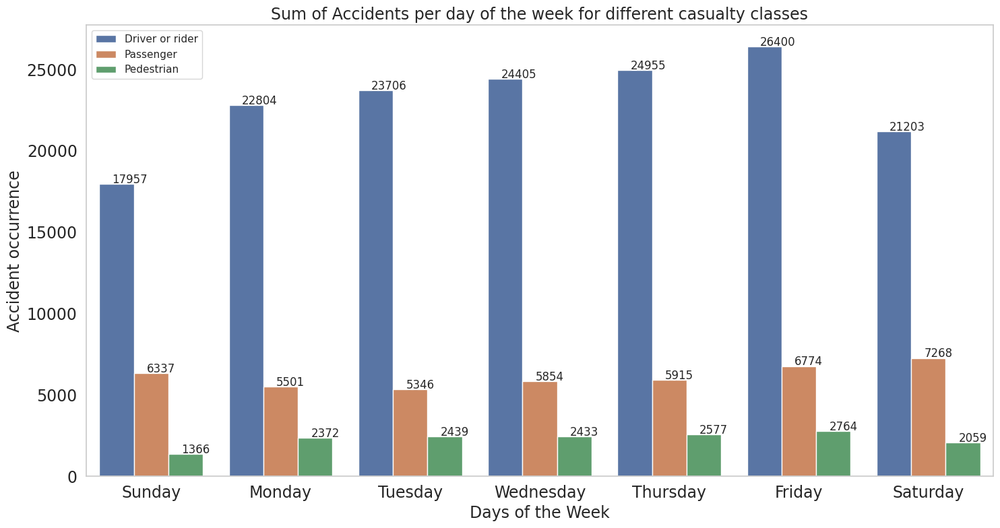

In [ ]:

# Set the figure size
sns.set(rc={'figure.figsize':(15,8)})

# Set the font size for the x and y-axis labels
plt.rc('xtick', labelsize=17)
plt.rc('ytick', labelsize=17)

# Set the seaborn style to whitegrid to remove background and add gridlines
sns.set_style("whitegrid")

# Create the count plot with seaborn
ax = sns.countplot(x='day_of_week',
                   hue='casualty_class',
                   data=Total_df1)

# Annotate the bars with the count of occurrences
for p in ax.patches:
    patch_height = p.get_height()
    if np.isnan(patch_height):
        patch_height = 0
    ax.annotate('{}'.format(int(patch_height)), (p.get_x()+0.1, patch_height+50))

# Set labels and title
ax.set(xlabel='Days of the Week', ylabel='Accident occurrence',
       title='Sum of Accidents per days of the week for casualty class')

# Set the tick labels according to the specified order
ax.set_xticklabels(order)

# Set the font size for the x and y-axis labels and the title
plt.xlabel('Days of the Week', fontsize=17)
plt.ylabel('Accident occurrence', fontsize=17)
plt.title('Sum of Accidents per day of the week for different casualty classes', fontsize=17)

# Add a legend with labels for different casualty classes
plt.legend(labels=['Driver or rider', 'Passenger', 'Pedestrian'], loc=2)

plt.grid(False)  # Remove grid lines

plt.tight_layout()
# Show the plot
plt.show()


The majority of pedestrian accidents occurred during weekdays (around 80%), with a fairly even distribution within the weekday (about 15.5%), and only a slight peak of 17% observed on Fridays. A substantial proportion of these accidents took place between 3 and 6 pm, peaking at approximately 3 pm. Additionally, significant accident occurrences were noted around 8 am during the early rush hour when people were commuting to work or school. Among the days of the week, Sundays experienced the least pedestrian accidents. Comparatively, the number of accidents involving drivers or riders was significantly higher, often double or triple that of pedestrian accidents on most days.

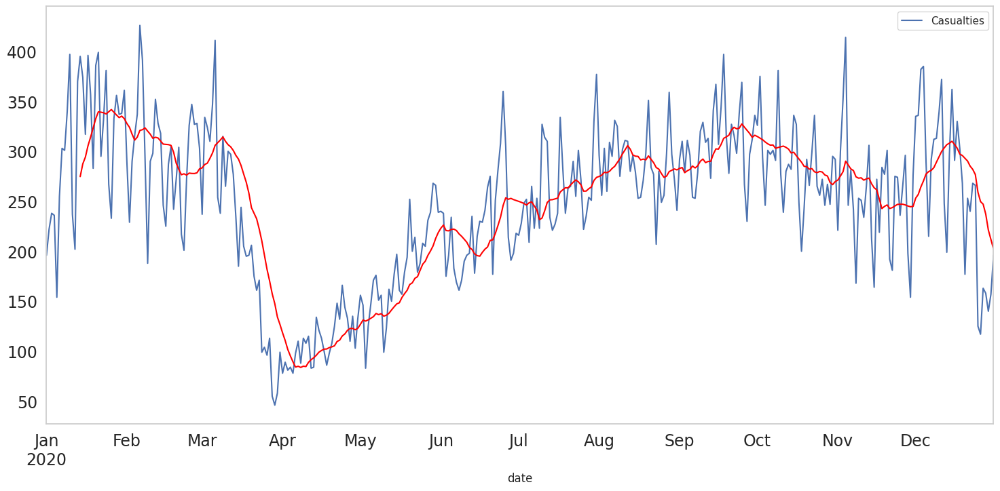

In [ ]:
%matplotlib inline
#Now let's take a look at the time series of accidents.
#'1st_Road_Class'

ts_df = pd.DataFrame()
ts_df["Casualties"]=Acc_df.groupby("date")['number_of_casualties'].count()


rolling_acc= ts_df["Casualties"].rolling(window=14).mean()
ts_df['Casualties'].plot(figsize=(18,8), legend=True)
rolling_acc.plot(color='red')

#

plt.grid(False)
plt.show()

The time series plot reveals a notable pattern, indicating the lowest number of casualties during the spring months (April and May). In contrast, the summer, winter, and Christmas holiday periods exhibit a substantially higher number of casualties. This trend can be attributed to increased human mobility, particularly during the summer and winter vacation periods.

### Effect of light condition

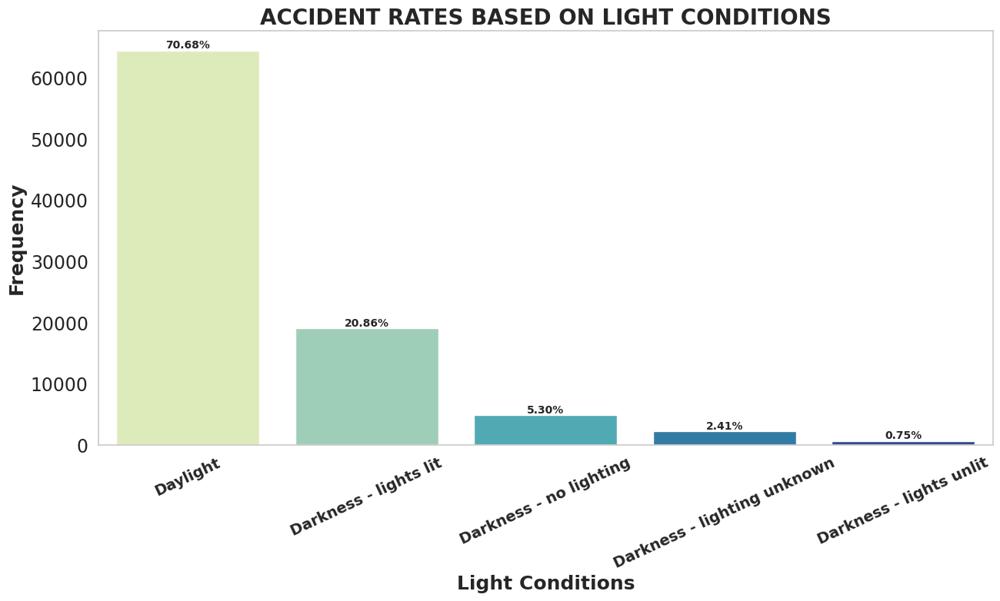

In [ ]:
# Create a figure with a specific size
plt.figure(figsize=(15, 7))

# Create a count plot using seaborn's countplot function
ax = sns.countplot(x='light_conditions', data=Acc_df,
                   order=Acc_df["light_conditions"].value_counts().index,
                   palette="YlGnBu")

# Update the tick labels to match the order of the unique values
ax.set_xticklabels(['Daylight', 'Darkness - lights lit', 'Darkness - no lighting',
                    'Darkness - lighting unknown', 'Darkness - lights unlit'],
                   fontsize=14, fontweight='bold')  # Increase font size and make labels bold

# Set the title of the plot
plt.title('ACCIDENT RATES BASED ON LIGHT CONDITIONS', fontsize=20, fontweight='bold')

# Set the label for the y-axis
plt.ylabel("Frequency", fontsize=18, fontweight='bold')
plt.xlabel("Light Conditions", fontsize=18, fontweight='bold')
# Loop through the bars and add text annotations for the percentages
total = float(len(Acc_df))
for p in ax.patches:
    percentage = '{:.2f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.grid(False)
plt.xticks(rotation=25)
# Display the plot
plt.show()


- With over 90% of accidents happening under good light conditions, the influence of darkness on accident occurrence appears to be minimal.

### Effect of road type

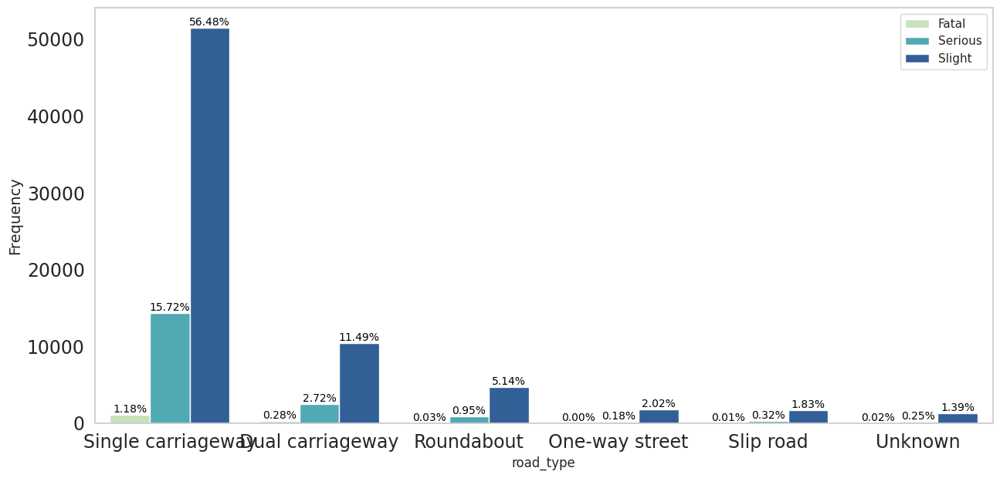

In [ ]:
# Set the size of the figure
plt.figure(figsize=(15, 7))

# Create a count plot with hue (accident_severity) based on road_type
ax = sns.countplot(x='road_type', hue='accident_severity', data=Acc_df,
                   order=Acc_df["road_type"].value_counts().index, palette="YlGnBu")

# Update the x-axis tick labels to match the road type names
ax.set_xticklabels(['Single carriageway', 'Dual carriageway', 'Roundabout',
                    'One-way street', 'Slip road', 'Unknown'])

# Add a legend to show the accident severity categories
plt.legend(['Fatal', 'Serious', 'Slight'])

# Set the y-axis label
plt.ylabel("Frequency", fontsize=14)

# Annotate each bar with the percentage value
total = float(len(Acc_df))
for p in ax.patches:
    height = p.get_height()
    # Calculate and annotate the percentage of each bar's frequency
    ax.annotate(f'{(height/total)*100:.2f}%', (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom', fontsize=10, color='black')

# Turn off grid lines
plt.grid(False)

# Display the plot
plt.show()


- Majority of the accident occurred under a single carriageway, account for over 75% of the all the accident


### Effect of weather condition

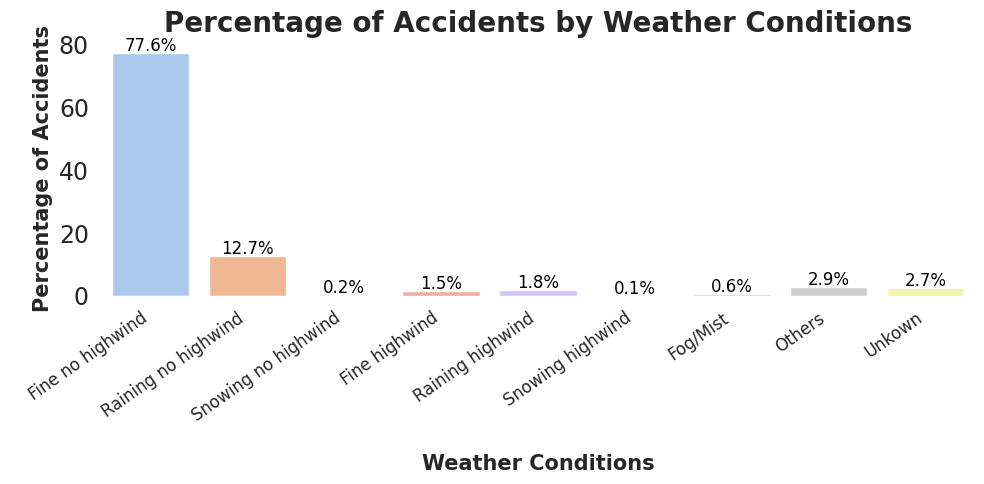

In [ ]:
# Calculate number of accidents by Weather_Conditions
df_weather_accident = Acc_df[Acc_df['weather_conditions'] != -1].groupby('weather_conditions')['accident_index'].count().reset_index()

# Calculate the total number of accidents
total_accidents = df_weather_accident['accident_index'].sum()

# Calculate the percentage of accidents
df_weather_accident['percentage'] = (df_weather_accident['accident_index'] / total_accidents) * 100

# Make a bar plot with percentage labels
plt.figure(figsize=(10, 5))
ax = sns.barplot(x="weather_conditions", y="percentage", data=df_weather_accident, palette='pastel')
sns.despine(top=True, right=True, left=True, bottom=True)
plt.title("Percentage of Accidents by Weather Conditions", fontsize=20, fontweight="bold")
plt.xlabel("\nWeather Conditions", fontsize=15, fontweight="bold")
plt.ylabel("\nPercentage of Accidents", fontsize=15, fontweight="bold")

# Customize x-axis labels
custom_labels = ['Fine no highwind', 'Raining no highwind', 'Snowing no highwind', 'Fine highwind', 'Raining highwind', 'Snowing highwind','Fog/Mist','Others','Unkown']
plt.xticks(range(len(custom_labels)), custom_labels, rotation=35, ha='right', fontsize=12)

# Display percentage values on the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

plt.tight_layout()
plt.grid(False)
# Show chart
plt.show()


# QUESTION 4 Using the apriori algorithm, explore the impact of selected variables on accident severity.


To implement the Apriori algorithm, the data must be transformed into a binary format, wherein all entries with a value of one remain unchanged, while any value greater than one is represented as one. Conversely, we represent each class with a value of one as zero. This process ensures that the data is encoded in zeros and ones, with categorical variables employed for the Apriori analysis.

As part of the preparation for the Apriori algorithm, we exclude the continuous variables and non-categorical columns from the dataset to focus solely on the categorical features, which are essential for conducting the Apriori analysis effectively.

### feature selection
- here we need to select the feature from the tables above needed to build our models
- possible feature to select:('speed_limit','accident_severity','road_type','light_conditions', 'weather_conditions', 'road_surface_conditions','urban_or_rural_area','age_of_driver')


The Apriori algorithm was utilized on chosen features derived from exploratory data analysis (EDA) to produce association rules. To generate these rules, a minimum support value of 25% was employed. Additionally, the assessment of these rules was conducted considering both confidence and lift metrics. Specifically, emphasis was placed on identifying robust rules exhibiting elevated lift values for further analysis.

In [ ]:
# selecting the features for our apriori algority
X_df = Total_df1[['speed_limit','accident_severity','road_type','light_conditions', 'weather_conditions', 'road_surface_conditions','urban_or_rural_area','age_of_driver']]

In [ ]:
# define a fuction to onehotend code our select features
def creat_dummy(dataframe,categorical_features):
  dummies =pd.get_dummies(dataframe, columns=categorical_features,prefix=categorical_features)
  return dummies

In [ ]:
# onehotencode the catigorical variables
categorical_features =['speed_limit','accident_severity','road_type','light_conditions', 'weather_conditions', 'road_surface_conditions','urban_or_rural_area','age_of_driver']
X_encoded =creat_dummy(X_df,categorical_features)

In [ ]:
# sanity check
X_encoded.head()

,speed_limit_20.0,speed_limit_30.0,speed_limit_40.0,speed_limit_50.0,speed_limit_60.0,speed_limit_70.0,accident_severity_1,accident_severity_2,accident_severity_3,road_type_1,road_type_2,road_type_3,road_type_6,road_type_7,road_type_9,light_conditions_1.0,light_conditions_4.0,light_conditions_5.0,light_conditions_6.0,light_conditions_7.0,weather_conditions_1.0,weather_conditions_2.0,weather_conditions_3.0,weather_conditions_4.0,weather_conditions_5.0,weather_conditions_6.0,weather_conditions_7.0,weather_conditions_8.0,weather_conditions_9.0,road_surface_conditions_1.0,road_surface_conditions_2.0,road_surface_conditions_3.0,road_surface_conditions_4.0,road_surface_conditions_5.0,road_surface_conditions_9.0,urban_or_rural_area_1,urban_or_rural_area_2,urban_or_rural_area_3,age_of_driver_3.0,age_of_driver_4.0,age_of_driver_5.0,age_of_driver_6.0,age_of_driver_7.0,age_of_driver_8.0,age_of_driver_9.0,age_of_driver_10.0,age_of_driver_11.0,age_of_driver_12.0,age_of_driver_13.0,age_of_driver_14.0,age_of_driver_15.0,age_of_driver_16.0,age_of_driver_17.0,age_of_driver_18.0,age_of_driver_19.0,age_of_driver_20.0,age_of_driver_21.0,age_of_driver_22.0,age_of_driver_23.0,age_of_driver_24.0,age_of_driver_25.0,age_of_driver_26.0,age_of_driver_27.0,age_of_driver_28.0,age_of_driver_29.0,age_of_driver_30.0,age_of_driver_31.0,age_of_driver_32.0,age_of_driver_33.0,age_of_driver_34.0,age_of_driver_35.0,age_of_driver_36.0,age_of_driver_37.0,age_of_driver_38.0,age_of_driver_39.0,age_of_driver_40.0,age_of_driver_41.0,age_of_driver_42.0,age_of_driver_43.0,age_of_driver_44.0,age_of_driver_45.0,age_of_driver_46.0,age_of_driver_47.0,age_of_driver_48.0,age_of_driver_49.0,age_of_driver_50.0,age_of_driver_51.0,age_of_driver_52.0,age_of_driver_53.0,age_of_driver_54.0,age_of_driver_55.0,age_of_driver_56.0,age_of_driver_57.0,age_of_driver_58.0,age_of_driver_59.0,age_of_driver_60.0,age_of_driver_61.0,age_of_driver_62.0,age_of_driver_63.0,age_of_driver_64.0,age_of_driver_65.0,age_of_driver_66.0,age_of_driver_67.0,age_of_driver_68.0,age_of_driver_69.0,age_of_driver_70.0,age_of_driver_71.0,age_of_driver_72.0,age_of_driver_73.0,age_of_driver_74.0,age_of_driver_75.0,age_of_driver_76.0,age_of_driver_77.0,age_of_driver_78.0,age_of_driver_79.0,age_of_driver_80.0,age_of_driver_81.0,age_of_driver_82.0,age_of_driver_83.0,age_of_driver_84.0,age_of_driver_85.0,age_of_driver_86.0,age_of_driver_87.0,age_of_driver_88.0,age_of_driver_89.0,age_of_driver_90.0,age_of_driver_91.0,age_of_driver_92.0,age_of_driver_93.0,age_of_driver_94.0,age_of_driver_95.0,age_of_driver_96.0,age_of_driver_97.0,age_of_driver_98.0,age_of_driver_99.0,age_of_driver_100.0
0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

#### Applying Apriori Algorithm

In [ ]:
# importing the apriori
from mlxtend.frequent_patterns import apriori, association_rules

pd.set_option("max_colwidth", None) # to show all the antecedent combinations

In [ ]:
# importing the apriori
freq_item = apriori(X_encoded, min_support= 0.25,use_colnames=True)

In [ ]:
freq_item

,support,itemsets
0,0.542663,(speed_limit_30.0)
1,0.777445,(accident_severity_3)
2,0.720652,(road_type_6)
3,0.710604,(light_conditions_1.0)
4,0.780892,(weather_conditions_1.0)
...,...,...
101,0.252410,"(road_surface_conditions_1.0, speed_limit_30.0, accident_severity_3, urban_or_rural_area_1, weather_conditions_1.0)"
102,0.250609,"(road_type_6, road_surface_conditions_1.0, speed_limit_30.0, urban_or_rural_area_1, weather_conditions_1.0)"
103,0.288262,"(road_type_6, light_conditions_1.0, road_surface_conditions_1.0, accident_severity_3, weather_conditions_1.0)"
104,0.255327,"(road_type_6, road_surface_conditions_1.0, accident_severity_3, urban_or_rural_area_1, weather_conditions_1.0)"


In [ ]:
# To get association_rulee (confidence )
association_rules(freq_item, metric ="confidence", min_threshold=0.7)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(speed_limit_30.0),(accident_severity_3),0.542663,0.777445,0.439218,0.809375,1.041070,0.017327,1.167501,0.086261
1,(speed_limit_30.0),(road_type_6),0.542663,0.720652,0.436850,0.805011,1.117058,0.045778,1.432631,0.229135
2,(speed_limit_30.0),(light_conditions_1.0),0.542663,0.710604,0.384930,0.709334,0.998213,-0.000689,0.995632,-0.003898
3,(speed_limit_30.0),(weather_conditions_1.0),0.542663,0.780892,0.428376,0.789395,1.010888,0.004614,1.040372,0.023552
4,(speed_limit_30.0),(road_surface_conditions_1.0),0.542663,0.688416,0.386595,0.712402,1.034843,0.013016,1.083402,0.073621
...,...,...,...,...,...,...,...,...,...,...
282,"(accident_severity_3, road_surface_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",(light_conditions_1.0),0.349228,0.710604,0.270021,0.773194,1.088080,0.021858,1.275961,0.124390
283,"(road_surface_conditions_1.0, light_conditions_1.0, urban_or_rural_area_1)","(accident_severity_3, weather_conditions_1.0)",0.348760,0.604246,0.270021,0.774230,1.281315,0.059284,1.752904,0.337129
284,"(accident_severity_3, light_conditions_1.0, urban_or_rural_area_1)","(road_surface_conditions_1.0, weather_conditions_1.0)",0.370658,0.646912,0.270021,0.728490,1.126104,0.030238,1.300461,0.177936
285,"(light_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)","(accident_severity_3, road_surface_conditions_1.0)",0.368925,0.536299,0.270021,0.731912,1.364747,0.072167,1.729660,0.423505


In [ ]:
# lift = 1 mean is random
# lifr < 1 mean is does not occur
# lift > 1 means it occurs more often
# so we want a lift greater than 1 threshold

rules = association_rules(freq_item, metric="lift", min_threshold=1.04)

rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(accident_severity_3),(speed_limit_30.0),0.777445,0.542663,0.439218,0.564951,1.041070,0.017327,1.051230,0.177260
1,(speed_limit_30.0),(accident_severity_3),0.542663,0.777445,0.439218,0.809375,1.041070,0.017327,1.167501,0.086261
2,(road_type_6),(speed_limit_30.0),0.720652,0.542663,0.436850,0.606187,1.117058,0.045778,1.161303,0.375130
3,(speed_limit_30.0),(road_type_6),0.542663,0.720652,0.436850,0.805011,1.117058,0.045778,1.432631,0.229135
4,(speed_limit_30.0),(urban_or_rural_area_1),0.542663,0.642634,0.464745,0.856414,1.332663,0.116011,2.488871,0.545818
...,...,...,...,...,...,...,...,...,...,...
599,(light_conditions_1.0),"(accident_severity_3, road_surface_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",0.710604,0.349228,0.270021,0.379987,1.088080,0.021858,1.049612,0.279719
600,(road_surface_conditions_1.0),"(accident_severity_3, light_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",0.688416,0.303572,0.270021,0.392235,1.292063,0.061036,1.145882,0.725466
601,(accident_severity_3),"(road_surface_conditions_1.0, light_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",0.777445,0.327947,0.270021,0.347318,1.059068,0.015060,1.029679,0.250605
602,(urban_or_rural_area_1),"(accident_severity_3, road_surface_conditions_1.0, light_conditions_1.0, weather_conditions_1.0)",0.642634,0.396874,0.270021,0.420178,1.058718,0.014976,1.040191,0.155195


### filtering to show accident_severity 3

In [ ]:
# filtering to show accident_severity 3
filtered_rules= rules[rules["consequents"].apply(lambda x: len(x) == 1 and "accident_severity_3" in x)]


In [ ]:
# Sort the filtered rules based on lift values in ascending order
sorted_rules = filtered_rules.sort_values(by='lift', ascending=False)

# show result
sorted_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
84,"(light_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.447769,0.777445,0.370658,0.827788,1.064755,0.022542,1.292335,0.110130
176,"(speed_limit_30.0, light_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.325633,0.777445,0.268914,0.825817,1.062220,0.015752,1.277713,0.086860
397,"(road_surface_conditions_1.0, light_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.348760,0.777445,0.287835,0.825310,1.061567,0.016694,1.274001,0.089056
578,"(road_surface_conditions_1.0, light_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",(accident_severity_3),0.327947,0.777445,0.270021,0.823367,1.059068,0.015060,1.259985,0.082990
386,"(light_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",(accident_severity_3),0.368925,0.777445,0.303572,0.822857,1.058412,0.016754,1.256358,0.087451
19,"(speed_limit_30.0, light_conditions_1.0)",(accident_severity_3),0.384930,0.777445,0.315630,0.819969,1.054698,0.016369,1.236205,0.084317
7,(urban_or_rural_area_1),(accident_severity_3),0.642634,0.777445,0.525701,0.818042,1.052219,0.026089,1.223114,0.138870
95,"(road_surface_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.457786,0.777445,0.374369,0.817782,1.051884,0.018466,1.221368,0.090970
345,"(road_type_6, light_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.329721,0.777445,0.269494,0.817341,1.051318,0.013155,1.218422,0.072825
409,"(road_surface_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",(accident_severity_3),0.428108,0.777445,0.349228,0.815747,1.049266,0.016397,1.207876,0.082102


In [ ]:
# Sort the filtered rules based on lift values in ascending order
sorted_rules = filtered_rules.sort_values(by='lift', ascending=False)

# Display specific columns
display_columns = ['antecedents', 'consequents', 'support', 'confidence', 'lift']
sorted_rules_display = sorted_rules[display_columns]

# Show the result
sorted_rules_display


,antecedents,consequents,support,confidence,lift
84,"(light_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.370658,0.827788,1.064755
176,"(speed_limit_30.0, light_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.268914,0.825817,1.062220
397,"(road_surface_conditions_1.0, light_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.287835,0.825310,1.061567
578,"(road_surface_conditions_1.0, light_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",(accident_severity_3),0.270021,0.823367,1.059068
386,"(light_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",(accident_severity_3),0.303572,0.822857,1.058412
19,"(speed_limit_30.0, light_conditions_1.0)",(accident_severity_3),0.315630,0.819969,1.054698
7,(urban_or_rural_area_1),(accident_severity_3),0.525701,0.818042,1.052219
95,"(road_surface_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.374369,0.817782,1.051884
345,"(road_type_6, light_conditions_1.0, urban_or_rural_area_1)",(accident_severity_3),0.269494,0.817341,1.051318
409,"(road_surface_conditions_1.0, urban_or_rural_area_1, weather_conditions_1.0)",(accident_severity_3),0.349228,0.815747,1.049266


### Question 5 Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region?

In [ ]:
# checking the combined df
Total_df1.shape

(220435, 83)

In [ ]:
# joining the accident, vehicle and casualty table to the lsoa table
comb = Total_df1.merge(lsoa_df, left_on="lsoa_of_accident_location", right_on="lsoa01cd")

In [ ]:
# subsetting humberside
Humber_df=comb[comb['police_force']==16]

In [ ]:
# checking the row and column of humberside
Humber_df.shape

(3985, 90)

#### Selecting longituted and latitude to to build the clusters

In [ ]:
# subsetting longitiude and latitude
loc_df = Humber_df[['longitude','latitude']]

In [ ]:
# import required libraries
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

#### Kmean clusters

#### determine optimal number of cluster using silhouette_score vs intertia ( elbow method)

In [ ]:
# implement kmeans clustering
# using silhouette to determine the number of clusters. we can also the elbow method to determine the number of clusters
sil_score =[]
num_clusters = range(2,11)

for cluster in num_clusters:
  kmeans = KMeans(n_clusters=cluster,random_state= 0)

  # train the algorithm
  kmeans.fit(loc_df)
  #predict the models
  labels = kmeans.predict(loc_df)
  # compute the silhouette score
  score = silhouette_score(loc_df,labels) # labels is th prediction
  # save the score
  sil_score.append(score)

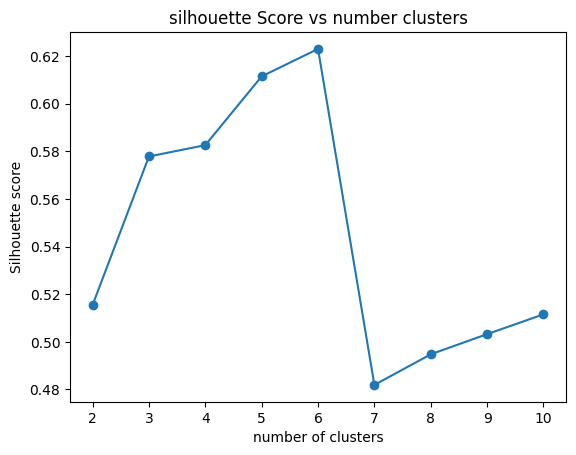

In [ ]:
# visualize the score

# Create a line plot to visualize the silhouette scores for different numbers of clusters
plt.plot(num_clusters, sil_score, marker = 'o') #(marker = 'o') for making point plot
plt.xlabel("number of clusters")
plt.ylabel("Silhouette score")
plt.title("silhouette Score vs number clusters")

# show the plot
plt.show()

#### implimenting the elbow method

In [ ]:
# Elbow method
# Initialize an empty list to store the distortion values
distortions = []

# Define a range of values for the number of clusters (from 1 to 9 in this case)
K = range(1, 10)

# Loop through the range of cluster values
for k in K:
    # Create a KMeans instance with 'k' clusters and a fixed random state for reproducibility
    kmeans = KMeans(n_clusters=k, random_state=42)

    # Fit the K-means model to the data in 'loc_df'
    kmeans.fit(loc_df)

    # Append the inertia (distortion) of the current clustering to the 'distortions' list
    distortions.append(kmeans.inertia_)

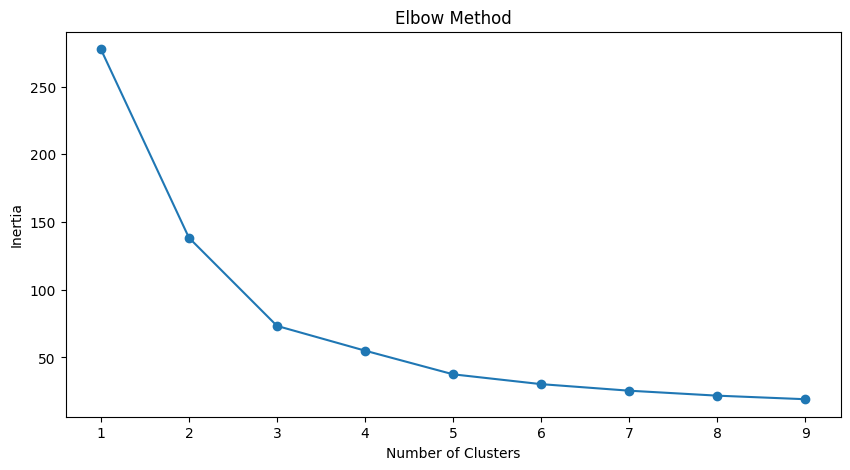

In [ ]:
# Create a DataFrame to hold the cluster numbers and their corresponding distortion values
frame = pd.DataFrame({"Cluster": range(1, 10), "SSE": distortions})

# Create a plot with a specific figure size
plt.figure(figsize=(10, 5))

# Plot the cluster numbers against the distortion values
plt.plot(frame["Cluster"], frame["SSE"], marker="o")  # Using a marker "o" for data points

# Add labels and a title to the plot
plt.xlabel('Number of Clusters')  # X-axis label
plt.ylabel('Inertia')              # Y-axis label
plt.title('Elbow Method')          # Title of the plot

# Display the plot
plt.show()

- combining this two method the optimum number of cluster is 5

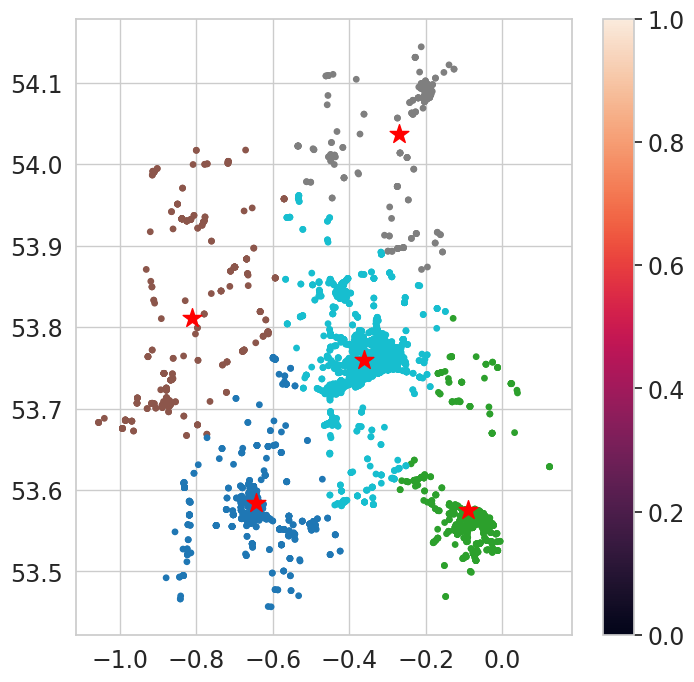

In [ ]:
# Optimal number of clusters
n_clusters = 5

# Initialize and fit the KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
kmeans.fit(loc_df)

# Get cluster labels and cluster centers
labels = kmeans.predict(loc_df)
centroids = kmeans.cluster_centers_

# Create a colormap with 10 different colors (one for each cluster)
colormap = plt.cm.get_cmap('tab10', n_clusters)

# Plot the data points with colors representing their clusters
fig = plt.figure(figsize=(8, 8))
plt.scatter(loc_df['longitude'], loc_df['latitude'], c=labels, cmap=colormap, s=15)
plt.scatter(centroids[:, 0], centroids[:, 1], color='red', marker='*', s=200)

# Add a colorbar to show the mapping of cluster labels to colors
plt.colorbar()
plt.show()

###  KMediods

In [ ]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 33.0 MB/s eta 0:00:00


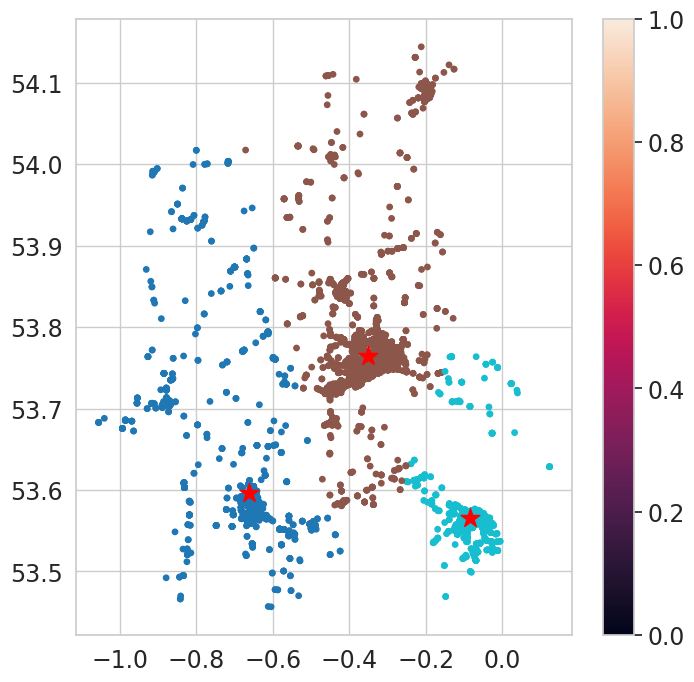

In [ ]:
# import kmediods
from sklearn_extra.cluster import KMedoids


# Define the number of clusters
n_clusters = 3

# Initialize and fit the KMedoids model
kmedoids = KMedoids(n_clusters=n_clusters, random_state=0)
kmedoids.fit(loc_df)

# Get cluster labels and cluster centers
label2 = kmedoids.predict(loc_df)
centroid2 = kmedoids.cluster_centers_

# Create a colormap with 10 different colors (one for each cluster)
colormap = plt.cm.get_cmap('tab10', n_clusters)

# Plot the data points with colors representing their clusters
fig = plt.figure(figsize=(8, 8))
plt.scatter(loc_df['longitude'], loc_df['latitude'], c=label2, cmap=colormap, s=15)
plt.scatter(centroid2[:, 0], centroid2[:, 1], color='red', marker='*', s=200)

# Add a colorbar to show the mapping of cluster labels to colors
plt.colorbar()
plt.show()


- with kmeadiod the

#### Dbscan

#### determining the number of clusters base of silohoutte score

In [ ]:
# to determine the optimum number of clusters

# import itertools
import itertools

eps = np.linspace(0.001, 0.01, 10)
minPts = np.arange(1, 6)

# Create a tuple of eps and minPts using the product method of itertools
hyper_list = list(itertools.product(eps, minPts))

for (eps, minPts) in hyper_list:
    dbscan = DBSCAN(eps=eps, min_samples=minPts)
    labels = dbscan.fit_predict(loc_df)

    # Check if there are at least two different labels
    if len(np.unique(labels)) > 1:
        score = silhouette_score(loc_df, labels)
        print(f'eps:{eps}; minPts:{minPts}; num_labels:{len(np.unique(labels))}; score:{score}')
    else:
        print(f'eps:{eps}; minPts:{minPts}; num_labels:{len(np.unique(labels))}; score: N/A (Not enough clusters)')

eps:0.001; minPts:1; num_labels:1267; score:0.8732038527760166
eps:0.001; minPts:2; num_labels:1022; score:0.81862046610115
eps:0.001; minPts:3; num_labels:447; score:0.2685587271835122
eps:0.001; minPts:4; num_labels:360; score:0.1470738471494928
eps:0.001; minPts:5; num_labels:210; score:-0.1301135688773499
eps:0.002; minPts:1; num_labels:1010; score:0.7891878640240475
eps:0.002; minPts:2; num_labels:830; score:0.7537693918942182
eps:0.002; minPts:3; num_labels:435; score:0.394093337275307
eps:0.002; minPts:4; num_labels:368; score:0.30486354445914493
eps:0.002; minPts:5; num_labels:238; score:0.07169264191671638
eps:0.003; minPts:1; num_labels:809; score:0.6750335192541594
eps:0.003; minPts:2; num_labels:671; score:0.6459384972817824
eps:0.003; minPts:3; num_labels:378; score:0.3934351836102923
eps:0.003; minPts:4; num_labels:324; score:0.3253433076071398
eps:0.003; minPts:5; num_labels:220; score:0.1540714206284931
eps:0.004; minPts:1; num_labels:650; score:0.5046999267013469
eps:0

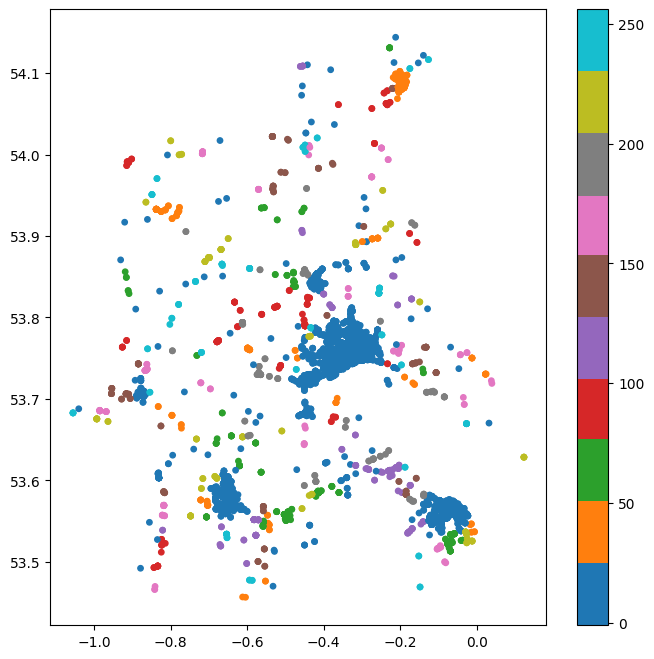

In [ ]:
from sklearn.cluster import DBSCAN


# Initialize DBSCAN with desired parameters (eps and min_samples)
dbscan = DBSCAN(eps=0.01, min_samples=2)

# Fit DBSCAN to the data
dbscan.fit(loc_df)

# Get cluster labels (-1 represents noise/outliers, non-negative integers represent clusters)
labels = dbscan.labels_

# Number of clusters found (ignoring noise, i.e., clusters with label -1)
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

# Create a colormap with different colors (one for each cluster including noise)
colormap = plt.cm.get_cmap('tab10', n_clusters + 1)  # +1 to include noise points

# Plot the data points with colors representing their clusters (including noise)
fig = plt.figure(figsize=(8, 8))
plt.scatter(loc_df['longitude'], loc_df['latitude'], c=labels, cmap=colormap, s=15)

# Get cluster centers (in DBSCAN, there are no explicit cluster centers, so we skip this step)

# Add a colorbar to show the mapping of cluster labels to colors
plt.colorbar()
plt.show()


- db scan cluster are not good

### valuatizing the kmean cluster on a map of humber

In [ ]:
# installing folium
pip install folium


In [ ]:
# installing selenium
!pip install selenium


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 37.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.2/400.2 kB 33.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.9 MB/s eta 0:00:00


In [ ]:
import folium
import numpy as np


# Assuming you have already defined reg_df
# reg_df should be a DataFrame containing your data points with columns 'longitude' and 'latitude'

# Define the number of clusters
n_clusters = 5

# Initialize and fit the KMedoids model
Kmeans = KMeans(n_clusters=n_clusters, random_state=0)
Kmeans.fit(loc_df)

# Get cluster labels and cluster centers
label2 = Kmeans.predict(loc_df)
centroid2 = Kmeans.cluster_centers_

# Create a colormap with 10 different colors (one for each cluster)
colormap = plt.cm.get_cmap('tab10', n_clusters)

# Create a folium map centered around Humberside
humberside_coords = (53.73130, -0.43745)
humberside_map = folium.Map(location=humberside_coords, zoom_start=10)

# Add markers for each cluster center
for i, centroid in enumerate(centroid2):
    folium.Marker(location=[centroid[1], centroid[0]], popup=f"Cluster {i+1} Center", icon=folium.Icon(color='red')).add_to(humberside_map)

# Add scatter plot points for the data points with colors representing their clusters
for lon, lat, cluster_label in zip(loc_df['longitude'], loc_df['latitude'], label2):
    color = colormap(cluster_label)
    folium.CircleMarker(location=[lat, lon], radius=5, color=None, fill_color=color, fill_opacity=0.7).add_to(humberside_map)

# Display the map
humberside_map.save("humberside_cluster_map.html")  # Save the map as an HTML file

humberside_map



### Clustering base on weather condition and speedlimit

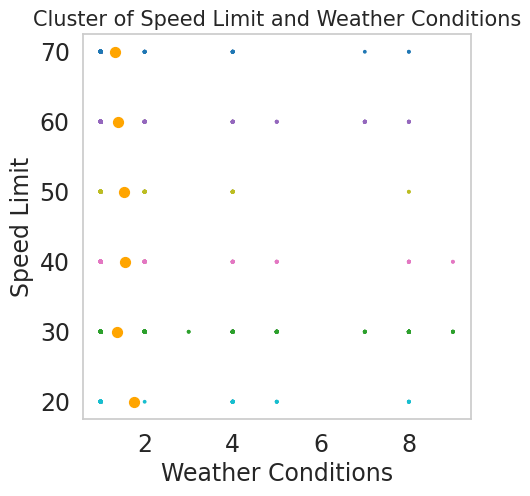

In [ ]:
# Subsetting the data to include only valid weather_conditions and speed_limit values
Humber_df2 = Humber_df[(Humber_df["weather_conditions"] >= 0) & (Humber_df["speed_limit"] >= 0)]

# Selecting only the necessary features for clustering
loc_df2 = Humber_df2[['weather_conditions', 'speed_limit']]

# Initialize K-means with 6 clusters and using 'k-means++' initialization
kmeans = KMeans(n_clusters=6, init='k-means++')
kmeans.fit(loc_df2)

# Predict cluster labels for the data points
labels = kmeans.predict(loc_df2)

# Get the cluster centroids
centroids = kmeans.cluster_centers_

# Create a new figure for the plot
fig = plt.figure(figsize=(5, 5))

# Plot the data points, coloring them based on their cluster labels
plt.scatter(loc_df2['weather_conditions'], loc_df2['speed_limit'], c=labels, cmap='tab10', s=3)

# Plot the cluster centroids as orange points
plt.scatter(centroids[:, 0], centroids[:, 1], color='orange', s=50)

# Add labels, title, and adjust formatting
plt.xlabel('Weather Conditions', fontsize=17)
plt.ylabel('Speed Limit', fontsize=17)
plt.title('Cluster of Speed Limit and Weather Conditions', fontsize=15)
plt.grid(False)
plt.show()


- the cluster are gattered around 2 which means raining

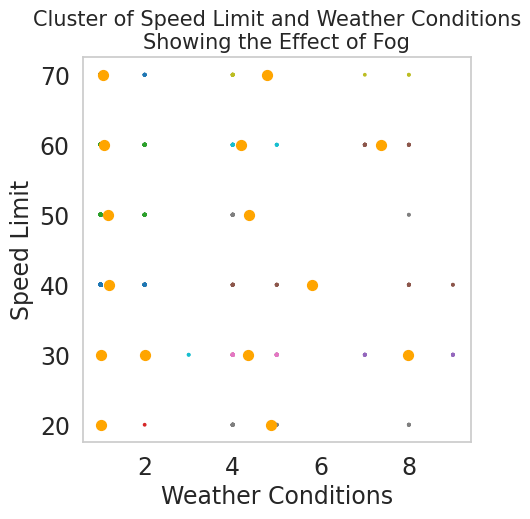

In [ ]:
# using 15  clusters to get the effect of fog

# Initialize the KMeans model with 15 clusters and 'k-means++' initialization
kmeans = KMeans(n_clusters=15, init='k-means++')

# Fit the model to the data
kmeans.fit(loc_df2)

# Predict the cluster labels for each data point
labels = kmeans.predict(loc_df2)

# Get the cluster centroids
centroids = kmeans.cluster_centers_

# Create a figure to plot the clusters
fig = plt.figure(figsize=(5, 5))

# Plot the data points with colors representing their clusters
plt.scatter(loc_df2['weather_conditions'], loc_df2['speed_limit'], c=labels, cmap='tab10', s=3)

# Plot the cluster centroids
plt.scatter(centroids[:, 0], centroids[:, 1], color='orange', s=50)

# Set x and y axis labels
plt.xlabel('Weather Conditions', fontsize=17)
plt.ylabel('Speed Limit', fontsize=17)

# Set the title with a line break to indicate the effect of fog
plt.title('Cluster of Speed Limit and Weather Conditions\nShowing the Effect of Fog', fontsize=15)

# Turn off grid lines
plt.grid(False)

# Display the plot
plt.show()


###  Visualizing accident occurance under different weather condition

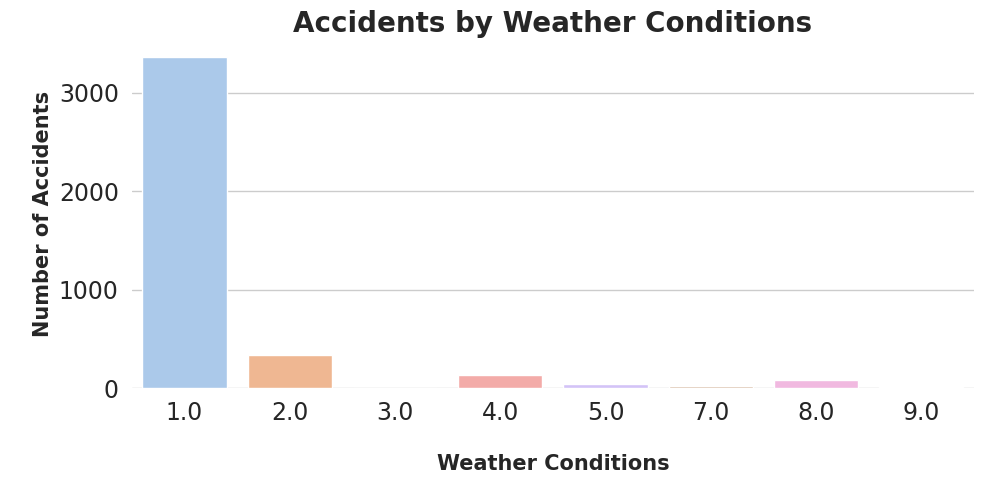

In [ ]:
# Calculate the number of accidents by Weather_Conditions
df_weather_accident = Humber_df2.groupby(['weather_conditions'])['accident_index'].count().reset_index()

# Create a figure for the plot
plt.figure(figsize=(10, 5))

# Create a bar plot using seaborn
sns.barplot(x="weather_conditions", y="accident_index", data=df_weather_accident, palette='pastel')

# Remove unnecessary spines from the plot
sns.despine(top=True, right=True, left=True, bottom=True)

# Set the plot title with font settings
plt.title("Accidents by Weather Conditions", fontsize=20, fontweight="bold")

# Set the x-axis label with line breaks for better readability
plt.xlabel("\nWeather Conditions", fontsize=15, fontweight="bold")

# Set the y-axis label with line breaks for better readability
plt.ylabel("\nNumber of Accidents", fontsize=15, fontweight="bold")

# Rotate x-axis labels and align them to the right
#plt.xticks(rotation=45, ha='right', labels=['Fine no highwind', 'Raining no highwind','Snowing no highwind', 'Fine highwind',
#                    'Raining highwind', 'Snowing highwind', 'Fog & Mist', 'Others','Unknown'])

# Ensure tight layout of the plot elements
plt.tight_layout()

# Display the chart
plt.show()


clustering based on speed limit and weather conitions  using 6 cluster show  that must of the accident are cluster around rain weahter. by the increasing the number of clusters to 14 mist and fog because a big factor at speed limit of 60

## Question 6  outlier detection

### Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data?

In [ ]:
# selecting variables to drop before we do our out lier detection
drop =['accident_index', 'accident_year_x', 'accident_reference_x',
       'location_easting_osgr', 'location_northing_osgr',
      'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
      'first_road_class', 'first_road_number',
       'junction_detail',
       'second_road_class', 'second_road_number',
       'special_conditions_at_site', 'carriageway_hazards',
        'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location', 'converted_time',
       'new_time',  'accident_year_y', 'accident_reference_y',
       'vehicle_reference_x','towing_and_articulation',
       'vehicle_manoeuvre', 'vehicle_direction_from', 'vehicle_direction_to',
       'vehicle_location_restricted_lane', 'junction_location',
       'skidding_and_overturning', 'hit_object_in_carriageway',
       'vehicle_leaving_carriageway', 'hit_object_off_carriageway',
       'first_point_of_impact', 'vehicle_left_hand_drive',
       'journey_purpose_of_driver', 'propulsion_code',
        'generic_make_model', 'driver_imd_decile',
       'driver_home_area_type', 'casualty_index', 'accident_year',
       'accident_reference', 'vehicle_reference_y', 'casualty_reference',
       'age_band_of_casualty',
       'car_passenger', 'bus_or_coach_passenger',
       'pedestrian_road_maintenance_worker','vehicle_index',
       'casualty_home_area_type', 'casualty_imd_decile','local_authority_highway']

In [ ]:
# drop unwanted features
outlier_df = Total_df1.drop(drop,axis =1)

In [ ]:
# columns to use for outlier dection
outlier_df.columns

Index(['longitude', 'latitude', 'police_force', 'accident_severity',
       'number_of_vehicles', 'number_of_casualties', 'road_type',
       'speed_limit', 'junction_control', 'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions', 'urban_or_rural_area',
       'vehicle_type', 'sex_of_driver', 'age_of_driver', 'age_band_of_driver',
       'engine_capacity_cc', 'age_of_vehicle', 'casualty_class',
       'sex_of_casualty', 'age_of_casualty', 'casualty_severity',
       'pedestrian_location', 'pedestrian_movement', 'casualty_type'],
      dtype='object')

In [ ]:
# checking our columns to use
outlier_df.head()

,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,road_type,speed_limit,junction_control,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,urban_or_rural_area,vehicle_type,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,age_of_vehicle,casualty_class,sex_of_casualty,age_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,casualty_type
0,-0.254001,51.462262,1,3,1,1,6,20.0,4.0,9.0,9.0,1.0,9.0,9.0,1,9,2.0,32.0,6.0,1968.0,6.0,3,1.0,31.0,3,9.0,5.0,0
1,-0.139253,51.470327,1,3,1,2,6,20.0,2.0,0.0,4.0,1.0,1.0,1.0,1,9,1.0,45.0,7.0,1395.0,2.0,3,2.0,2.0,3,1.0,1.0,0
2,-0.139253,51.470327,1,3,1,2,6,20.0,2.0,0.0,4.0,1.0,1.0,1.0,1,9,1.0,45.0,7.0,1395.0,2.0,3,2.0,4.0,3,1.0,1.0,0
3,-0.178719,51.529614,1,3,1,1,6,30.0,1.0,0.0,0.0,4.0,1.0,2.0,1,9,3.0,38.0,6.0,1596.0,7.0,3,1.0,23.0,3,5.0,9.0,0
4,-0.001683,51.541210,1,2,1,1,6,30.0,4.0,0.0,4.0,4.0,1.0,1.0,1,8,1.0,44.0,7.0,1798.0,8.0,3,1.0,47.0,2,4.0,1.0,0


In [ ]:
# confirm the rows and column number
outlier_df.shape

(220435, 28)

In [ ]:
#distribution of accident severity in the data

outlier_df.	accident_severity.value_counts()

3    171376
2     44828
1      4231
Name: accident_severity, dtype: int64

### Outlier detection
- IQR method
 - Upper quatile = Q3
 - lower quatile = Q1
 - Upper whisker = Q3+1.5*IQR
 - Lower whisker = Q1 -1.5*IQR
- Use local outlier and isolation forest to detect the outliers in ourdata

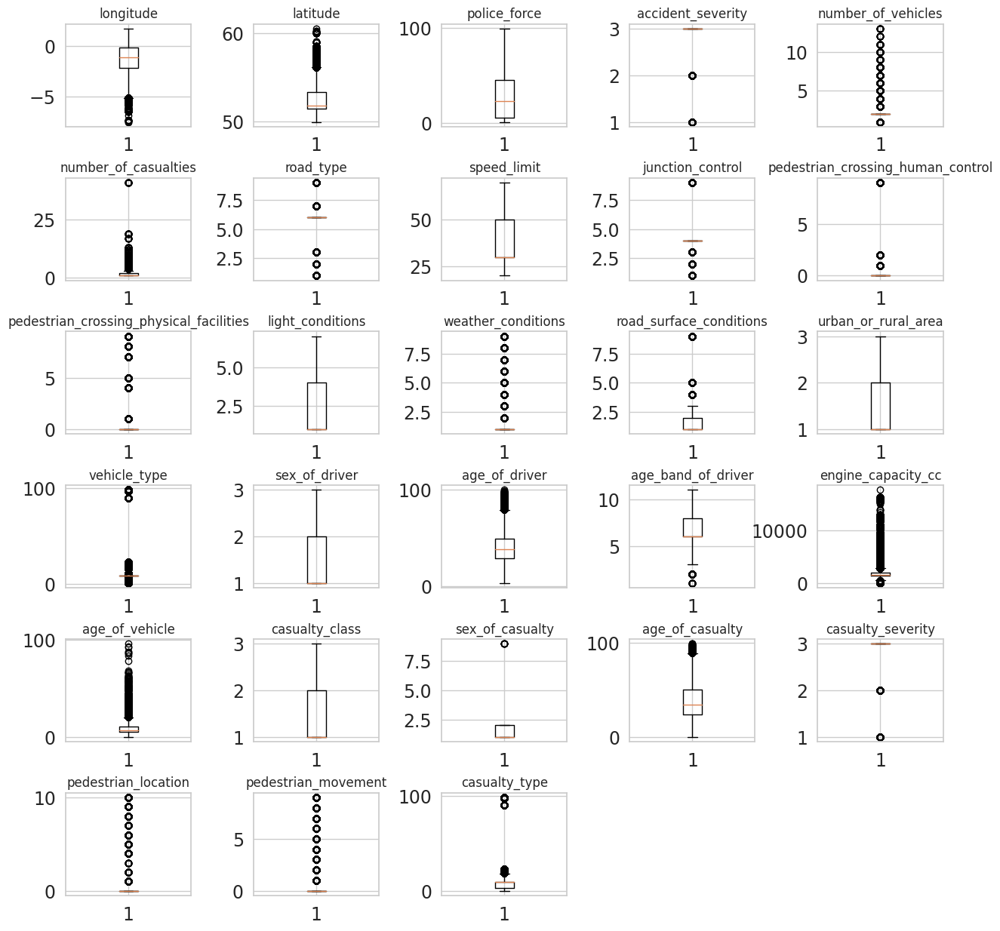

In [ ]:
# Define a function to create multiple boxplots for each variable in the DataFrame
def boxplots(df, variable_per_row=5):
    # Calculate the total number of variables and the number of rows needed for subplots
    total_variable = len(df.columns)
    total_rows = (total_variable - 1) // variable_per_row + 1

    # Create a figure with subplots and adjust the spacing
    fig, axes = plt.subplots(nrows=total_rows, ncols=variable_per_row, figsize=(15, 15))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)

    # Loop through each variable and create a boxplot for it
    for i, variable in enumerate(df.columns):
        row = i // variable_per_row
        col = i % variable_per_row
        axes[row, col].boxplot(df[variable])  # Create the boxplot
        axes[row, col].set_title(variable)    # Set the title of the subplot

    # Remove any empty subplots
    for i in range(total_variable, total_rows * variable_per_row):
        row = i // variable_per_row
        col = i % variable_per_row
        fig.delaxes(axes[row, col])

    # Display the plot
    plt.show()

# Call the boxplots function with the 'outlier_df' DataFrame as input
boxplots(outlier_df)



- the outlier are displaced by the box plot

- checking if they are truly outliers

### LocalOutlierFactor

In [ ]:
# Import the LocalOutlierFactor class from the sklearn.neighbors module
from sklearn.neighbors import LocalOutlierFactor

# Create a LocalOutlierFactor model and set the contamination parameter to 0.0025
# The contamination parameter determines the proportion of outliers in the dataset
lof_model = LocalOutlierFactor(contamination=0.0025)

# Fit the LOF model to the data and predict the labels of each data point
# Predicted labels are -1 for outliers and 1 for inliers (normal data points)
y_pred = lof_model.fit_predict(outlier_df)

# Replace the predicted outlier labels (-1) with 1 and inlier labels (1) with 0
# This transforms the predicted labels to a binary format (1 for anomalies, 0 for normal)
LOF_pred = pd.Series(y_pred).replace([-1, 1], [1, 0])

# Select the data points that are predicted as outliers by LOF (LOF_pred == 1)
# These are the data points that are considered anomalies
LOF_anomalies = outlier_df[LOF_pred == 1]


In [ ]:
# These are the data points that are considered anomalies
LOF_anomalies.shape

(552, 28)

In [ ]:
# distribution of accident_severity of the outlier
LOF_anomalies.	accident_severity.value_counts()

3    389
2    146
1     17
Name: accident_severity, dtype: int64

In [ ]:
# These are the data points that are considered anomalies
LOF_anomalies

,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,road_type,speed_limit,junction_control,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,urban_or_rural_area,vehicle_type,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,age_of_vehicle,casualty_class,sex_of_casualty,age_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,casualty_type
1056,-0.172967,51.485676,1,3,2,1,6,30.0,4.0,0.0,0.0,4.0,1.0,1.0,1,4,1.0,34.0,6.0,150.0,4.0,1,1.0,34.0,3,0.0,0.0,4
1542,0.175230,51.455137,1,3,2,1,6,30.0,4.0,0.0,0.0,1.0,2.0,5.0,1,98,3.0,38.0,6.0,8970.0,13.0,1,2.0,44.0,3,0.0,0.0,9
1619,-0.115939,51.397293,1,3,1,1,6,30.0,4.0,0.0,0.0,1.0,1.0,1.0,1,9,2.0,35.0,6.0,1618.0,4.0,3,2.0,49.0,3,5.0,1.0,0
1716,-0.409812,51.594544,1,2,2,1,6,20.0,9.0,0.0,0.0,1.0,1.0,2.0,1,1,2.0,23.0,5.0,1596.0,7.0,1,2.0,23.0,2,0.0,0.0,1
1859,-0.130683,51.489417,1,2,1,2,6,30.0,2.0,0.0,0.0,1.0,1.0,1.0,1,8,1.0,56.0,9.0,1596.0,7.0,3,1.0,57.0,3,8.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219419,-3.778569,56.511472,99,3,2,1,6,60.0,4.0,0.0,0.0,1.0,1.0,1.0,2,21,1.0,55.0,8.0,8867.0,11.0,1,1.0,55.0,3,0.0,0.0,21
219503,-3.835880,55.599073,99,3,2,2,3,70.0,4.0,0.0,0.0,4.0,2.0,2.0,2,90,1.0,53.0,8.0,1952.0,31.0,1,1.0,42.0,3,0.0,0.0,19
219504,-3.835880,55.599073,99,3,2,2,3,70.0,4.0,0.0,0.0,4.0,2.0,2.0,2,90,1.0,53.0,8.0,1952.0,31.0,2,1.0,21.0,3,0.0,0.0,19
219978,-3.182296,55.972624,99,3,2,2,6,20.0,3.0,0.0,0.0,4.0,1.0,1.0,1,9,1.0,47.0,8.0,2967.0,6.0,2,1.0,46.0,3,0.0,0.0,90


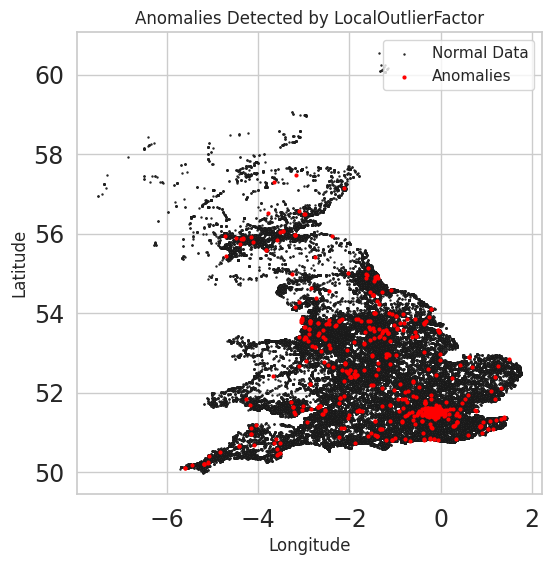

In [ ]:
# Create a scatter plot to visualize anomalies

# Set the figure size
plt.figure(figsize=(6, 6))

# Plot the regular data points from the outlier_df dataframe in white color
# Use a small size for the points and black edges
plt.scatter(outlier_df["longitude"], outlier_df["latitude"], c="white", s=0.5, edgecolor="k")

# Plot the anomalies detected by LOF (Local Outlier Factor) in red color
# Use a larger size for the anomaly points
plt.scatter(LOF_anomalies["longitude"], LOF_anomalies["latitude"], c="red", s=4)

# Add labels and titles
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Anomalies Detected by LocalOutlierFactor")
plt.legend(["Normal Data", "Anomalies"], loc="upper right")

# Show the plot
plt.show()


In [ ]:
import folium

# Create a map centered at a specific location in the UK (for example, London coordinates)
map_uk = folium.Map(location=[51.5074, -0.1278], zoom_start=6)

# Add the scatter plot of LOF anomalies to the map
for index, row in LOF_anomalies.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.7,
        popup="Anomaly",
    ).add_to(map_uk)

# Display the map
map_uk


### ilsolation forest

In [ ]:
# import isolationforest
from sklearn.ensemble import IsolationForest

# Create an instance of the Isolation Forest model
iforst = IsolationForest(contamination=0.0025,random_state=0)

# Fit and predict using the model
if_anomalies = iforst.fit_predict(outlier_df)

# Replace -1 with 1 and 1 with 0 to identify anomalies
if_anomalies = pd.Series(if_anomalies).replace([-1, 1], [1, 0])

# Select the rows from the dataframe that are identified as anomalies
if_anomalies = outlier_df[if_anomalies == 1]


In [ ]:
#  checking the outlier
if_anomalies.shape

(552, 28)

In [ ]:
# distribution of accident_severity of the outlier
if_anomalies.	accident_severity.value_counts()

3    338
2    139
1     75
Name: accident_severity, dtype: int64

In [ ]:
# These are the data points that are considered anomalies
if_anomalies

,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,road_type,speed_limit,junction_control,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,urban_or_rural_area,vehicle_type,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,age_of_vehicle,casualty_class,sex_of_casualty,age_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,casualty_type
0,-0.254001,51.462262,1,3,1,1,6,20.0,4.0,9.0,9.0,1.0,9.0,9.0,1,9,2.0,32.0,6.0,1968.0,6.0,3,1.0,31.0,3,9.0,5.0,0
74,-0.108489,51.591936,1,3,2,1,2,20.0,9.0,9.0,9.0,4.0,9.0,9.0,1,9,2.0,22.0,5.0,1329.0,10.0,1,2.0,22.0,3,0.0,0.0,9
75,-0.108489,51.591936,1,3,2,1,2,20.0,9.0,9.0,9.0,4.0,9.0,9.0,1,9,1.0,50.0,8.0,1968.0,2.0,1,2.0,22.0,3,0.0,0.0,9
718,-0.103473,51.536578,1,2,1,1,6,20.0,4.0,9.0,9.0,4.0,9.0,9.0,1,1,3.0,38.0,6.0,1596.0,7.0,3,2.0,69.0,2,1.0,9.0,0
1084,-0.240706,51.603795,1,3,1,1,9,30.0,9.0,0.0,0.0,1.0,9.0,9.0,1,98,3.0,38.0,6.0,2198.0,5.0,3,1.0,29.0,3,6.0,9.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219663,-2.169783,57.155128,99,2,1,1,6,30.0,4.0,0.0,8.0,1.0,8.0,2.0,1,9,1.0,91.0,11.0,1598.0,15.0,3,2.0,91.0,2,4.0,1.0,0
219998,-4.644525,55.908620,99,2,1,1,6,60.0,4.0,0.0,0.0,6.0,2.0,2.0,2,9,2.0,78.0,11.0,1200.0,0.0,3,1.0,46.0,2,8.0,1.0,0
220064,-4.063523,55.814225,99,1,2,1,3,70.0,4.0,0.0,0.0,6.0,1.0,2.0,1,21,1.0,40.0,7.0,12809.0,1.0,3,1.0,24.0,1,8.0,3.0,0
220203,-4.314034,55.870690,99,2,1,1,6,30.0,4.0,2.0,5.0,4.0,2.0,4.0,1,9,1.0,19.0,4.0,999.0,3.0,3,2.0,65.0,2,4.0,3.0,0


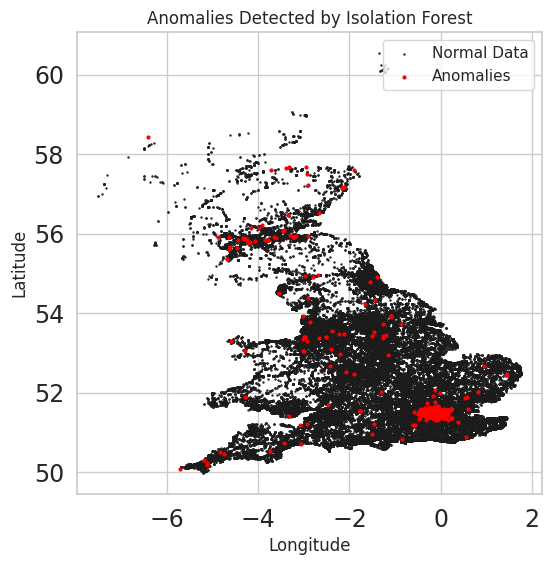

In [ ]:
# Create a scatter plot to visualize anomalies

# Set the figure size
plt.figure(figsize=(6, 6))

# Plot the regular data points from the outlier_df dataframe in white color
# Use a small size for the points and black edges
plt.scatter(outlier_df["longitude"], outlier_df["latitude"], c="white", s=0.5, edgecolor="k")

# Plot the anomalies detected by the Isolation Forest model (if_anomalies) in red color
# Use a smaller size for the points
plt.scatter(if_anomalies["longitude"], if_anomalies["latitude"], c="red", s=4)

# Add labels and titles
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Anomalies Detected by Isolation Forest")
plt.legend(["Normal Data", "Anomalies"], loc="upper right")

# Show the plot
plt.show()


In [ ]:
import folium

# Create a map centered at a specific location in the UK (for example, London coordinates)
map_uk = folium.Map(location=[51.5074, -0.1278], zoom_start=6)

# Add the scatter plot of LOF anomalies to the map
for index, row in if_anomalies.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.7,
        popup="Anomaly",
    ).add_to(map_uk)

# Display the map
map_uk


### portion of outlier detected in effect detected

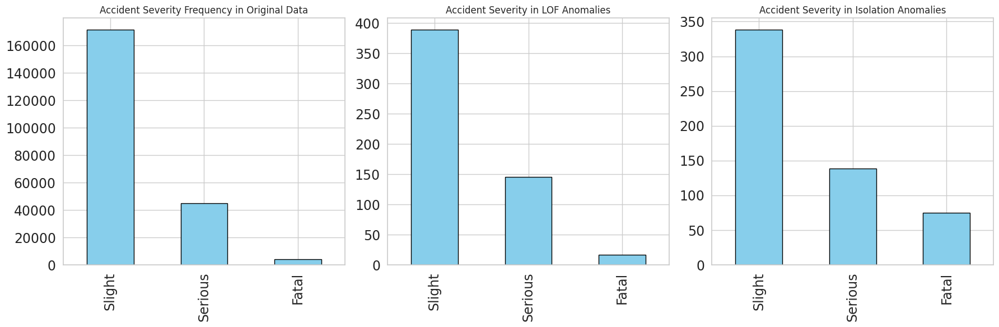

In [ ]:
import matplotlib.pyplot as plt

# Calculate the value counts for the "accident_severity" column in the original data
severity_counts = outlier_df["accident_severity"].value_counts()

# Calculate the value counts for the "accident_severity" column in LOF anomalies
lof_severity_counts = LOF_anomalies["accident_severity"].value_counts()

# Calculate the value counts for the "accident_severity" column in isolation anomalies
if_severity_counts = if_anomalies["accident_severity"].value_counts()

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Create the first subplot for the original data
severity_counts.plot(kind='bar', color='skyblue', edgecolor='black', ax=axes[0])
axes[0].set_xticks(range(len(severity_counts.index)))
axes[0].set_xticklabels(["Slight", "Serious", "Fatal"])
axes[0].set_title("Accident Severity Frequency in Original Data")

# Create the second subplot for LOF anomalies
lof_severity_counts.plot(kind='bar', color='skyblue', edgecolor='black', ax=axes[1])
axes[1].set_xticks(range(len(lof_severity_counts.index)))
axes[1].set_xticklabels(["Slight", "Serious", "Fatal"])
axes[1].set_title("Accident Severity in LOF Anomalies")

# Create the third subplot for isolation anomalies
if_severity_counts.plot(kind='bar', color='skyblue', edgecolor='black', ax=axes[2])
axes[2].set_xticks(range(len(if_severity_counts.index)))
axes[2].set_xticklabels(["Slight", "Serious", "Fatal"])
axes[2].set_title("Accident Severity in Isolation Anomalies")

# Adjust layout
plt.tight_layout()
#plt.grid(False)

# Show the combined plot
plt.show()


### Detection outlier in humber region

### Humber outlier

In [ ]:
# define humber df
Humber_outlier_df=outlier_df[outlier_df['police_force']==16]

In [ ]:


# Create an instance of the Isolation Forest model
iforest_hum = IsolationForest(contamination=0.01, random_state=0)

# Fit and predict using the model
if_anomalies_hum = iforest_hum.fit_predict(Humber_outlier_df)

# Replace -1 with 1 and 1 with 0 to identify anomalies
if_anomalies_hum = pd.Series(if_anomalies_hum).replace([-1, 1], [1, 0])

# Make sure the indices of Humber_outlier_df and if_anomalies_hum match
if_anomalies_hum.index = Humber_outlier_df.index

# Select the rows from the dataframe that are identified as anomalies
if_anomalies_hum_df = Humber_outlier_df[if_anomalies_hum == 1]


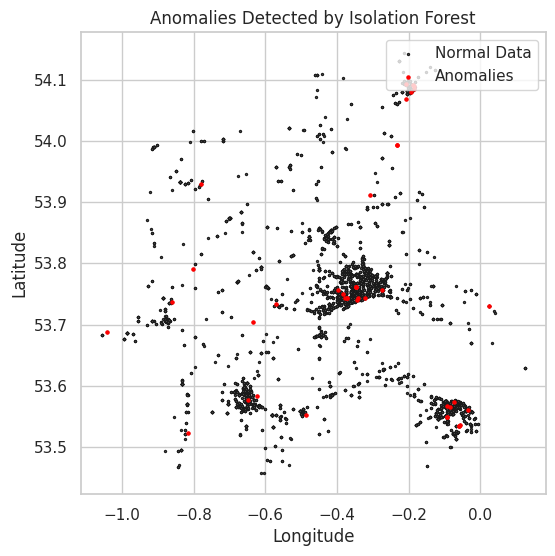

In [ ]:

# Set the figure size
plt.figure(figsize=(6, 6))

# Plot the regular data points from the outlier_df dataframe in white color
# Use a small size for the points and black edges
plt.scatter(Humber_outlier_df["longitude"], Humber_outlier_df["latitude"], c="white", s=2, edgecolor="k")

# Plot the anomalies detected by the Isolation Forest model (if_anomalies) in red color
# Use a smaller size for the points
plt.scatter(if_anomalies_hum_df["longitude"], if_anomalies_hum_df["latitude"], c="red", s=5)

# Add labels and titles
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Anomalies Detected by Isolation Forest")
plt.legend(["Normal Data", "Anomalies"], loc="upper right")

# Show the plot
plt.show()

In [ ]:
import folium

# Create a map centered at a specific location in the UK (for example, London coordinates)
map_uk2 = folium.Map(location=[53.73130, -0.43745], zoom_start=6)

# Add the scatter plot of LOF anomalies to the map
for index, row in if_anomalies_hum_df.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.7,
        popup="Anomaly",
    ).add_to(map_uk2)

# Display the map
map_uk2

### Question 7  Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?

In [ ]:
# dropping longitude, latitude, age_band_of_driver,
df_all = outlier_df.drop(["longitude", "latitude", "age_band_of_driver","casualty_severity","police_force"], axis=1)


In [ ]:
# checking for duplicated columns
df_all.duplicated().sum()

9106

In [ ]:
# Drop duplicated rows and reset the index
df_all.drop_duplicates(inplace=True)
df_all.reset_index(drop=True, inplace=True)


In [ ]:
# checking if the correction has been made

df_all.duplicated().sum()

0

In [ ]:
# checking for duplicated columns

df_all.columns.duplicated().sum()

0

In [ ]:
# checking row and column in the dataframe
df_all.shape

(211329, 23)

# Model building

### Feature selection

In [ ]:
# select the fetures and target

X = df_all.drop(["accident_severity"], axis =1)
y_label= df_all["accident_severity"]==1

In [ ]:
# checking the why label

X.shape

(211329, 22)

In [ ]:
# checking the why label
y_label.value_counts(normalize=True)

False    0.980235
True     0.019765
Name: accident_severity, dtype: float64

####  balancing our data
- we have to first balance our data because our data is not balance.
- we will use  randomundersampler balance ourdata


In [ ]:
# Import the RandomUnderSampler class from imblearn
from imblearn.under_sampling import RandomUnderSampler



# Initialize the RandomUnderSampler with a specific random state
rd = RandomUnderSampler(random_state=0)

# Perform random under-sampling on the features (X) and target (y_label)

# X_rd: Features after under-sampling
# y_rd: Target labels after under-sampling
X_rd, y_rd = rd.fit_resample(X, y_label)


In [ ]:
# checking the balance data
y_rd.value_counts()

False    4177
True     4177
Name: accident_severity, dtype: int64

### import the important library

In [ ]:
# import the important model
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
precision_score,
accuracy_score,
recall_score,
f1_score)

### Base model

### Split the data into testing and training

In [ ]:
# split the data into training and test data
from sklearn.model_selection import train_test_split

# split the data into training and test set
x_train_rd, x_test_rd, y_train_rd, y_test_rd = train_test_split(X_rd, y_rd, test_size =0.2, shuffle=True, random_state=0)

#### Training our model

In [ ]:
# Instantiate a Random Forest classifier with specified hyperparameters

rf = RandomForestClassifier(random_state=0)

# Train the Random Forest model
rf.fit(x_train_rd, y_train_rd)

RandomForestClassifier(random_state=0)

#### Fuction to evaluate our model

In [ ]:
# function to evaluate our model
# modified after. aileadtech.(2022) Data Visualization with Python.11 December.Available at:https://www.youtube.com/watch?v=icOcecahe5Y&list=PLqe6YDeOlcOYswRxkfWr17v25ym-ScKdL&index=16(Accessed: 26 March 2023).
def model_performance_classification(model, predictors, target, threshold=0.5):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred_proba = model.predict_proba(predictors)[:, 1]
    # convert the probability to class
    pred_class = np.round(pred_proba > threshold)
    acc = accuracy_score(target, pred_class)  # to compute accuracy
    recall = recall_score(target, pred_class)  # to compute recall
    precision = precision_score(target, pred_class)  # to compute precision
    f1 = f1_score(target, pred_class)  # to compute F1 score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1-score": f1
        },
        index=[0])

    # Print classification report
    class_report = classification_report(target, pred_class, target_names=["Not_Fatal", "Fatal"])
    print("Classification Report:\n", class_report)

    conf = confusion_matrix(target, pred_class)
    plt.figure(figsize=(5, 5))
    sns.heatmap(conf, annot=True, fmt="g")
    plt.xlabel("Predicted label")
    plt.ylabel("Actual label")
    plt.xticks([0.5, 1.5], ["Not_Fatal", "Fatal"])
    plt.yticks([0.5, 1.5], ["Not_Fatal", "Fatal"])
    plt.show()

    return df_perf



Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       1.00      1.00      1.00      3335
       Fatal       1.00      1.00      1.00      3348

    accuracy                           1.00      6683
   macro avg       1.00      1.00      1.00      6683
weighted avg       1.00      1.00      1.00      6683



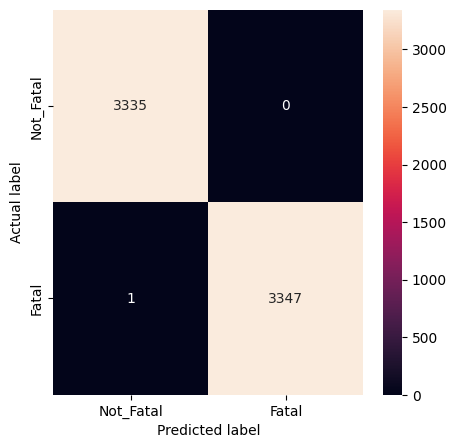

,Accuracy,Recall,Precision,F1-score
0,0.99985,0.999701,1.0,0.999851


In [ ]:
# training data
rf_train = model_performance_classification(rf,x_train_rd,y_train_rd)
rf_train

Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       0.83      0.81      0.82       842
       Fatal       0.81      0.83      0.82       829

    accuracy                           0.82      1671
   macro avg       0.82      0.82      0.82      1671
weighted avg       0.82      0.82      0.82      1671



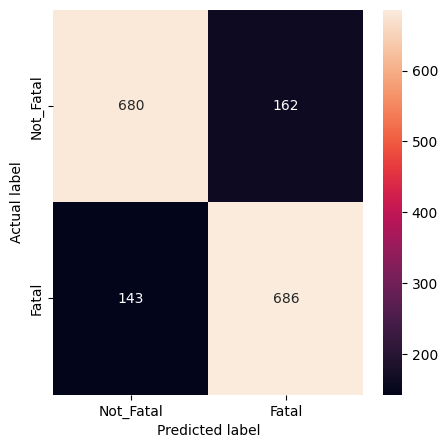

,Accuracy,Recall,Precision,F1-score
0,0.817475,0.827503,0.808962,0.818128


In [ ]:
# test data
rf_test = model_performance_classification(rf,x_test_rd,y_test_rd)
rf_test

- the model is overfitting because the accuracy, recall, precision and Fi_score is on training data is perfect and the model is not performing well on the test set

### To Improve the performance we will use grid to select hyperparameter for random forest




In [ ]:

# Set the parameters to tune
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': list(range(1, 16)),
    'min_samples_split': [2, 5, 10],
    'criterion': ['gini', 'entropy']
}

# Instantiate the Random Forest classifier
rf = RandomForestClassifier(random_state=0)

# Hyperparameter tuning based on accuracy (you can change scoring to 'recall' if needed)
grid = GridSearchCV(rf, param_grid, cv=5, n_jobs=-1, scoring='accuracy')

# Fit the grid search model on the training set
grid.fit(x_train_rd, y_train_rd)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200, 300]},
             scoring='accuracy')

In [ ]:
# the hyper parameter to improve the performance of our model
best_para = grid.best_params_
best_para

{'criterion': 'gini',
 'max_depth': 15,
 'min_samples_split': 2,
 'n_estimators': 300}

### Train the  model  with the hyperparameters

In [ ]:

# Instantiate a Random Forest classifier with specified hyperparameters

# 'criterion': The function to measure the quality of a split ('entropy' in this case)
# 'max_depth': The maximum depth of the individual trees in the forest (15 in this case)
# 'min_samples_split': The minimum number of samples required to split an internal node (2 in this case)
# 'n_estimators': The number of trees in the forest (300 in this case)
# 'random_state': The random seed for reproducibility (0 in this case)
rf2 = RandomForestClassifier(criterion='entropy',
                            max_depth=15,
                            min_samples_split=2,
                            n_estimators=300,
                            random_state=0)

# Train the Random Forest model

# x_train_rd: Under-sampled training features
# y_train_rd: Corresponding training labels
rf2.fit(x_train_rd, y_train_rd)


RandomForestClassifier(criterion='entropy', max_depth=15, n_estimators=300,
                       random_state=0)

Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       0.94      0.94      0.94      3335
       Fatal       0.94      0.94      0.94      3348

    accuracy                           0.94      6683
   macro avg       0.94      0.94      0.94      6683
weighted avg       0.94      0.94      0.94      6683



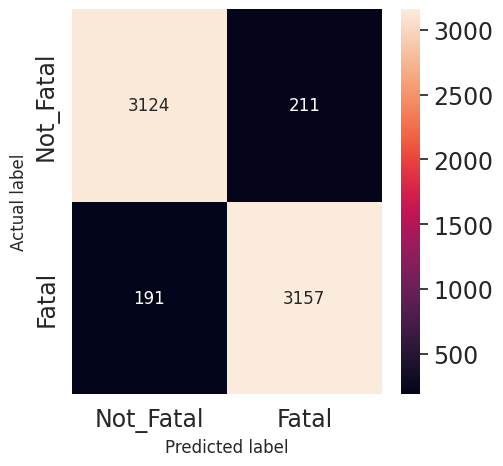

,Accuracy,Recall,Precision,F1-score
0,0.939847,0.942951,0.937352,0.940143


In [ ]:
# training data
rf_train2 = model_performance_classification(rf2,x_train_rd,y_train_rd)
rf_train2

Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       0.80      0.80      0.80       842
       Fatal       0.80      0.80      0.80       829

    accuracy                           0.80      1671
   macro avg       0.80      0.80      0.80      1671
weighted avg       0.80      0.80      0.80      1671



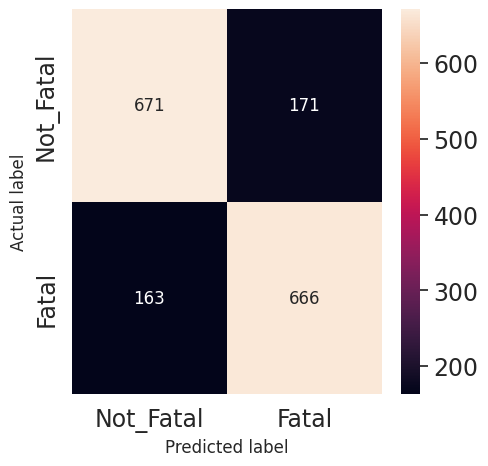

,Accuracy,Recall,Precision,F1-score
0,0.80012,0.803378,0.795699,0.79952


In [ ]:
# test data
rf_test2 = model_performance_classification(rf2,x_test_rd,y_test_rd)
rf_test2

- the model is not overfitting anymore and generalizing well

#### Using feature importance to select the top 10 feature contributing to our model

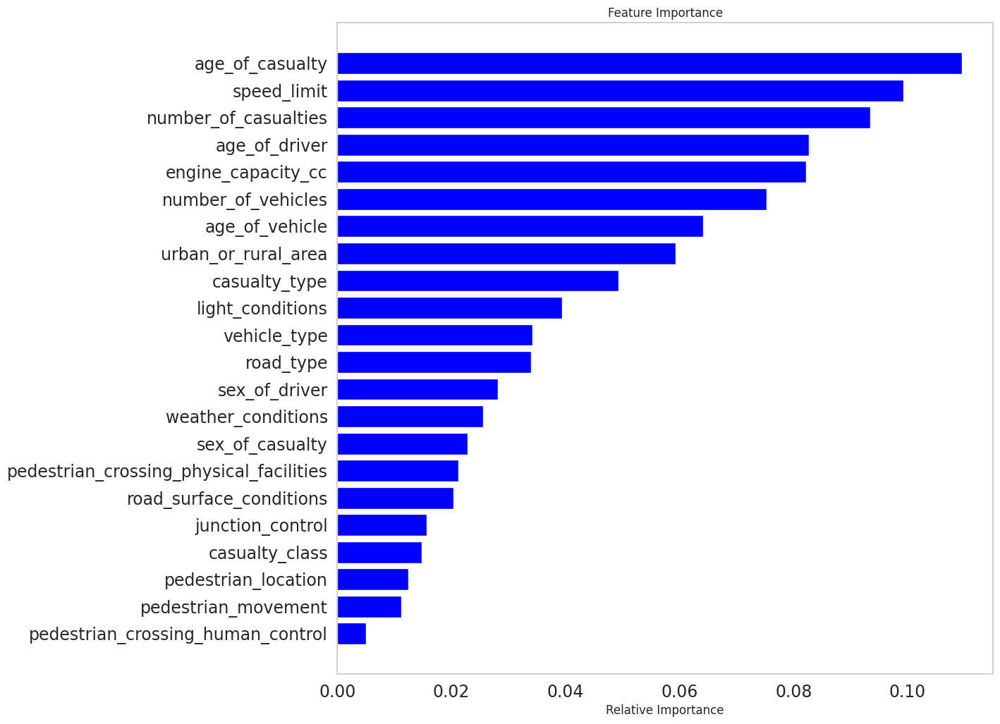

In [ ]:
# to visaulize
import_feature = rf2.feature_importances_
feature_names = x_train_rd.columns.to_list()
indices=np.argsort(import_feature)# sorting the important features
plt.figure(figsize=(12,12))
plt.title("Feature Importance")
plt.barh(range(len(indices)),import_feature[indices], color ="blue", align="center")

plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.grid(False)
plt.show()

#### Selecting the top 10 features

In [ ]:
# Top feature

top_10 = ['number_of_vehicles', 'number_of_casualties', 'speed_limit',
        'light_conditions','age_of_driver','casualty_type','age_of_vehicle',
       'urban_or_rural_area', 'engine_capacity_cc',
       'age_of_casualty','road_type']


Top_X = X_rd[top_10]

Top_X.head()

,number_of_vehicles,number_of_casualties,speed_limit,light_conditions,age_of_driver,casualty_type,age_of_vehicle,urban_or_rural_area,engine_capacity_cc,age_of_casualty,road_type
0,2,2,30.0,1.0,30.0,9,13.0,1,1796.0,30.0,6
1,2,1,20.0,1.0,41.0,9,3.0,1,1498.0,41.0,6
2,2,1,30.0,4.0,38.0,2,7.0,1,1596.0,16.0,6
3,1,1,70.0,6.0,25.0,9,15.0,2,1388.0,20.0,3
4,2,2,60.0,1.0,23.0,9,7.0,2,1596.0,18.0,6


In [ ]:
# checking the row and column
Top_X.shape

(8354, 11)

In [ ]:
Top_X.columns.duplicated().sum()

0

In [ ]:
# spliting our data into training and testing using the top ten features
x_train_tp, x_test_tp, y_train_tp, y_test_tp = train_test_split(Top_X, y_rd, test_size =0.2, shuffle=True, random_state=0)


### - using grid search to set the hyper parameter for the top 10 features

In [ ]:
# Set the parameters to tune
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': list(range(1, 16)),
    'min_samples_split': [2, 5, 10],
    'criterion': ['gini', 'entropy']
}

# Instantiate the Random Forest classifier
rf_tp = RandomForestClassifier(random_state=0)

# Hyperparameter tuning based on accuracy (you can change scoring to 'recall' if needed)
grid = GridSearchCV(rf_tp, param_grid, cv=5, n_jobs=-1, scoring='accuracy')

# Fit the grid search model on the training set
grid.fit(x_train_tp, y_train_tp)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200, 300]},
             scoring='accuracy')

## hyperparameter for the top 10 features

In [ ]:
# parameter to use to build our model
best_para = grid.best_params_
best_para

{'criterion': 'gini',
 'max_depth': 15,
 'min_samples_split': 2,
 'n_estimators': 300}

### Training the model with the hyperparemeter

In [ ]:
#instantiate the model
rf3 = RandomForestClassifier(criterion='gini',
                            max_depth=15,
                            min_samples_split=2,
                            n_estimators=300,
                            random_state=0)

# Train the Random Forest model

# x_train_rd: Under-sampled training features
# y_train_rd: Corresponding training labels
rf3.fit(x_train_tp, y_train_tp)

RandomForestClassifier(max_depth=15, n_estimators=300, random_state=0)

Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       0.95      0.96      0.96      3335
       Fatal       0.96      0.95      0.96      3348

    accuracy                           0.96      6683
   macro avg       0.96      0.96      0.96      6683
weighted avg       0.96      0.96      0.96      6683



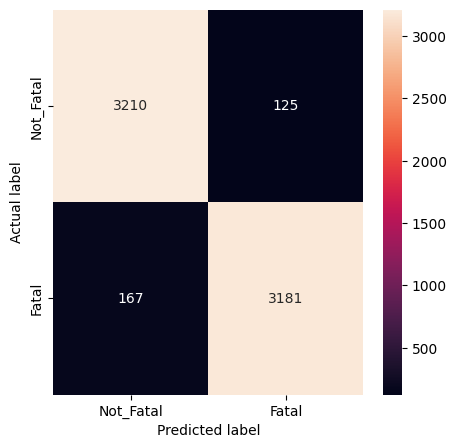

,Accuracy,Recall,Precision,F1-score
0,0.956307,0.950119,0.96219,0.956117


In [ ]:
# training data
rf_train3 = model_performance_classification(rf3,x_train_tp,y_train_tp)
rf_train3

Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       0.81      0.80      0.80       842
       Fatal       0.80      0.81      0.80       829

    accuracy                           0.80      1671
   macro avg       0.80      0.80      0.80      1671
weighted avg       0.80      0.80      0.80      1671



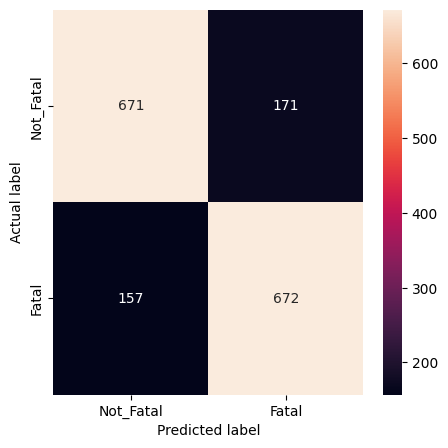

,Accuracy,Recall,Precision,F1-score
0,0.80371,0.810615,0.797153,0.803828


In [ ]:
# training data
rf_test3 = model_performance_classification(rf3,x_test_tp,y_test_tp)
rf_test3

#  Comparing the performance of Random forest, Decision tree and gradient boot on accident data

### Getting the hyperparameter for Gradient boost

In [ ]:
# selecting the best parameter for gradientboosting
from sklearn.ensemble import  GradientBoostingClassifier
# import the grid search model and the estimator
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# set the parameters to tune
param_grid = {'learning_rate': [0.001, 0.01, 0.1, 1, 10],
             'max_depth': list(range(1, 5)),
              'criterion':['friedman_mse','mse']}

# instantiate the models
gb = GradientBoostingClassifier(random_state=0)

# hyper paramter was build on recall
grid = GridSearchCV(gb, param_grid, cv = 5, n_jobs = -1, scoring = "recall")#


# fit the grid search model on the training set
grid.fit(x_train_tp, y_train_tp)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['friedman_mse', 'mse'],
                         'learning_rate': [0.001, 0.01, 0.1, 1, 10],
                         'max_depth': [1, 2, 3, 4]},
             scoring='recall')

In [ ]:
# get the best parameters

best_para = grid.best_params_
best_para

{'criterion': 'friedman_mse', 'learning_rate': 10, 'max_depth': 2}

### building gradientboost model


In [ ]:
#instantiate the model
gb1 = GradientBoostingClassifier(criterion='friedman_mse', learning_rate=0.1, max_depth=4,random_state=0)

# Train the Random Forest model


gb1.fit(x_train_tp, y_train_tp)

GradientBoostingClassifier(max_depth=4, random_state=0)

Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       0.82      0.80      0.81      3335
       Fatal       0.81      0.82      0.81      3348

    accuracy                           0.81      6683
   macro avg       0.81      0.81      0.81      6683
weighted avg       0.81      0.81      0.81      6683



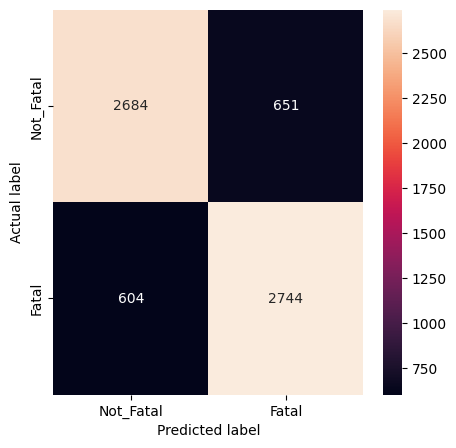

,Accuracy,Recall,Precision,F1-score
0,0.81221,0.819594,0.808247,0.813881


In [ ]:
# training data
gb_train = model_performance_classification(gb1,x_train_tp,y_train_tp)
gb_train

Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       0.77      0.76      0.77       842
       Fatal       0.76      0.77      0.77       829

    accuracy                           0.77      1671
   macro avg       0.77      0.77      0.77      1671
weighted avg       0.77      0.77      0.77      1671



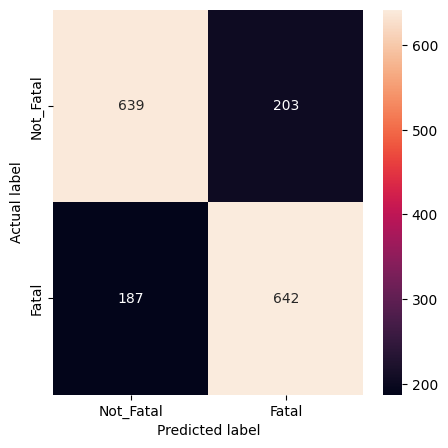

,Accuracy,Recall,Precision,F1-score
0,0.766607,0.774427,0.759763,0.767025


In [ ]:
# test data
gb_test = model_performance_classification(gb1,x_test_tp,y_test_tp)
gb_test

- gradientboost performed poorly when comparied to random forest

###  Get the hyperparameter for Decision tree

In [ ]:
# selecting the best parameter for decisiontree

from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

# Set the parameters to tune
param_grid = {
    'max_depth': list(range(1, 16)),
    'min_samples_split': [2, 5, 10],
    'criterion': ['gini', 'entropy']
}

# Instantiate the Decision Tree classifier
dt = DecisionTreeClassifier(random_state=0)

# Hyperparameter tuning based on accuracy (you can change scoring to 'recall' if needed)
grid = GridSearchCV(dt, param_grid, cv=5, n_jobs=-1, scoring='accuracy')

# Fit the grid search model on the training set
grid.fit(x_train_tp, y_train_tp)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=0), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

In [ ]:
# get the best parameters

best_para = grid.best_params_
best_para

{'criterion': 'gini', 'max_depth': 14, 'min_samples_split': 2}

### Training the model with decision tree classifier

In [ ]:
#instantiate the model
dt1 = DecisionTreeClassifier(criterion='gini', max_depth=14, min_samples_split=2, random_state=0)

# Train the Random Forest model


dt1.fit(x_train_tp, y_train_tp)

DecisionTreeClassifier(max_depth=14, random_state=0)

Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       0.92      0.90      0.91      3335
       Fatal       0.90      0.92      0.91      3348

    accuracy                           0.91      6683
   macro avg       0.91      0.91      0.91      6683
weighted avg       0.91      0.91      0.91      6683



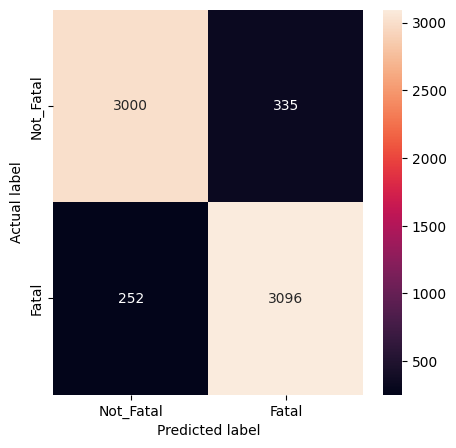

,Accuracy,Recall,Precision,F1-score
0,0.912165,0.924731,0.902361,0.913409


In [ ]:
# training  data
dt_train = model_performance_classification(dt1,x_train_tp,y_train_tp)
dt_train

Classification Report:
               precision    recall  f1-score   support

   Not_Fatal       0.77      0.75      0.76       842
       Fatal       0.76      0.77      0.76       829

    accuracy                           0.76      1671
   macro avg       0.76      0.76      0.76      1671
weighted avg       0.76      0.76      0.76      1671



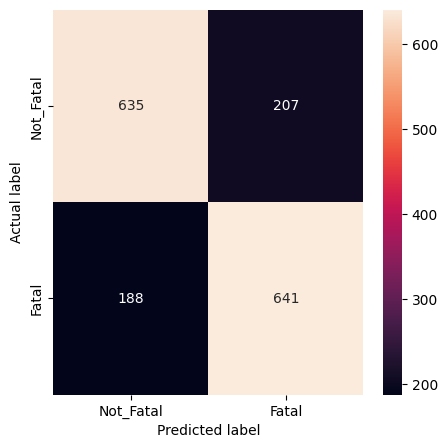

,Accuracy,Recall,Precision,F1-score
0,0.763615,0.773221,0.755896,0.76446


In [ ]:
# test data
dt_test = model_performance_classification(dt1,x_test_tp,y_test_tp)
dt_test

- the performance of decision tree and random forest is about thesame but poor compaired to random forest classifier

### visualizing the tree

In [ ]:
#pip install pydotplus
from sklearn import tree
import pydotplus
from IPython.display import Image

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.618747 to fit



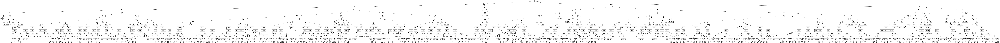

In [ ]:
###
dot_data = tree.export_graphviz(dt1, out_file = None, feature_names = x_train_tp.columns,
                               class_names=["0","1"])

# create a graph from the dot data
graph = pydotplus.graph_from_dot_data(dot_data)

# create the tree image from the graph
Image(graph.create_png())

#  Testing performance of different model (random forest,decision tree and gradient) using  cross validation  

In [ ]:

# Create the models
decision_tree = DecisionTreeClassifier(criterion='gini', max_depth=14, min_samples_split=2, random_state=0)
random_forest = RandomForestClassifier(criterion='gini',
                            max_depth=15,
                            min_samples_split=2,
                            n_estimators=300,
                            random_state=0)
gradient_boosting = GradientBoostingClassifier(criterion='friedman_mse', learning_rate=0.1, max_depth=4,random_state=0)

# Create a list of models
models = [decision_tree, random_forest, gradient_boosting]

# Create empty lists to store the evaluation metrics
model_names = []
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform cross-validation and calculate evaluation metrics for each model
for model in models:
    model_name = model.__class__.__name__
    model_names.append(model_name)

    scores = cross_val_score(model, Top_X, y_rd, cv=5)  # 5-fold cross-validation
    accuracy_scores.append(np.mean(scores))

    y_pred = model.fit(Top_X, y_rd).predict(Top_X)
    precision_scores.append(precision_score(y_rd, y_pred))
    recall_scores.append(recall_score(y_rd, y_pred))
    f1_scores.append(f1_score(y_rd, y_pred))

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Model': model_names,
    'Accuracy': accuracy_scores,
    'Precision': precision_scores,
    'Recall': recall_scores,
    'F1-score': f1_scores
})

# Print the DataFrame
print(results_df)


                        Model  Accuracy  Precision    Recall  F1-score
0      DecisionTreeClassifier  0.658702   0.912782  0.908634  0.910704
1      RandomForestClassifier  0.701399   0.957246  0.947859  0.952530
2  GradientBoostingClassifier  0.737518   0.801216  0.819421  0.810216


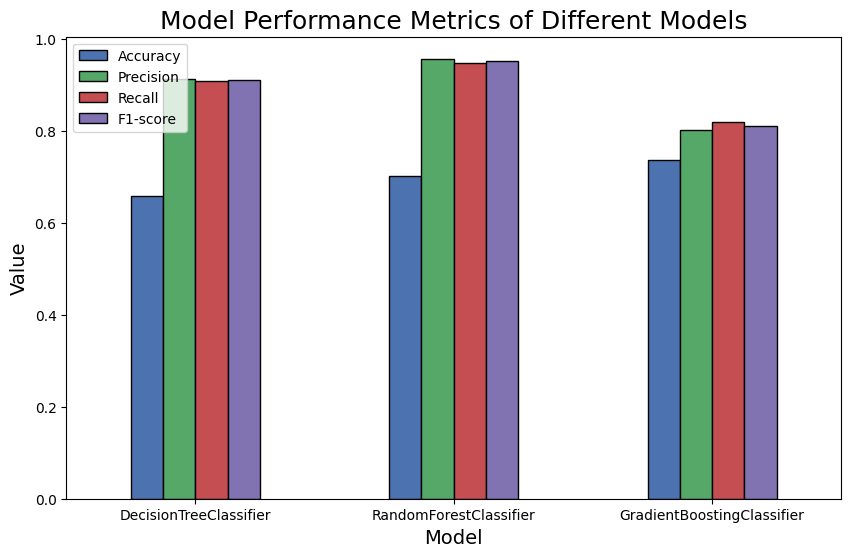

In [ ]:
# visualizing the result
data = {
    'Model': ['DecisionTreeClassifier', 'RandomForestClassifier', 'GradientBoostingClassifier'],
    'Accuracy': [0.658702, 0.701399, 0.737518],
    'Precision': [0.912782, 0.957246, 0.801216],
    'Recall': [0.908634, 0.947859, 0.819421],
    'F1-score': [0.910704, 0.952530, 0.810216]
}

# Create a DataFrame from the updated result data
df_m = pd.DataFrame(data)

# Set the Model column as the index
df_m.set_index('Model', inplace=True)

# Set the color palette
colors = ['#4c72b0', '#55a868', '#c44e52', '#8172b2']

# Plot the bar chart with the new color palette
ax = df_m.plot(kind='bar', figsize=(10, 6), color=colors, edgecolor='black')

# Set the plot title and labels
ax.set_title('Model Performance Metrics of Different Models', fontsize=18)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylabel('Value', fontsize=14)
ax.set_xticklabels(df_m.index, rotation=0)

# Show the plot
plt.show()


- based  on these metrics, the RandomForestClassifier seems to perform the best overall among the three models

-- Accuracy: The RandomForestClassifier has the highest accuracy (0.709292), which means it has the highest overall correct predictions on the dataset.

-- Precision: The RandomForestClassifier also has the highest precision (0.947080), indicating a low rate of false positives.

 --Recall: The RandomForestClassifier has the highest recall (0.950251), meaning it has the lowest rate of false negatives.

 -- F1-score: The RandomForestClassifier has the highest F1-score (0.948663), which balances precision and recall, making it a good choice when both false positives and false negatives are important.


### Stacking model

In [ ]:
import seaborn as sb

In [ ]:
def get_stacking():
  level0 = []
  level0.append(('dt',DecisionTreeClassifier(criterion='gini', max_depth=14, min_samples_split=2, random_state=0)))
  level0.append(('rf',RandomForestClassifier(criterion='gini',max_depth=15,min_samples_split=2,n_estimators=300,random_state=0)))
  level0.append(('db',GradientBoostingClassifier(criterion='friedman_mse', learning_rate=0.1, max_depth=4,random_state=0)))

  level1 = LogisticRegression()

  model =StackingClassifier(estimators =level0,final_estimator=level1, cv=5)

  return model

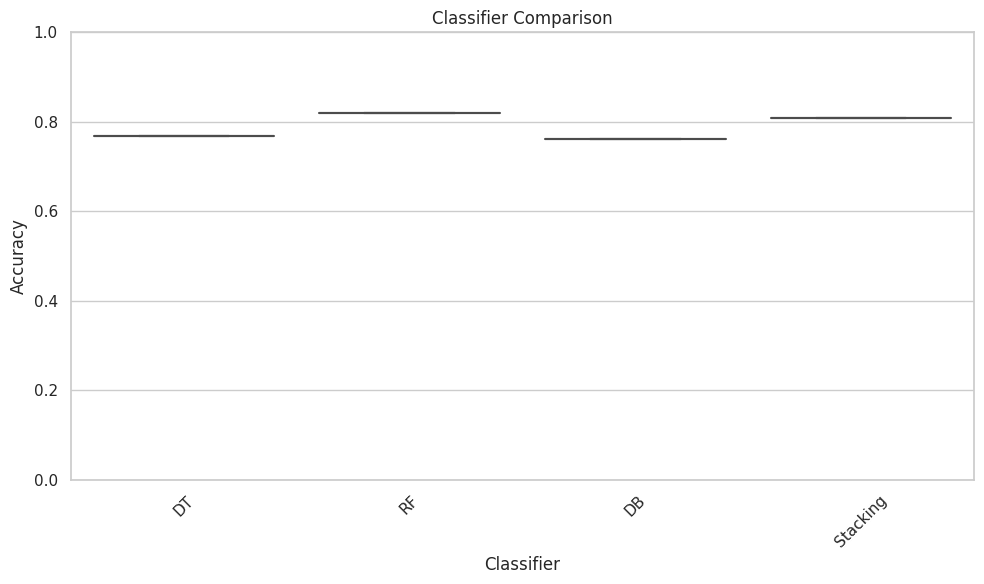

In [ ]:
# define classifiers
classifiers=[('DT',DecisionTreeClassifier()),
             ('RF',RandomForestClassifier()),
             ('DB',GradientBoostingClassifier()),
             ('Stacking',get_stacking())]


# train classifiers and collect results
results =[]
for name, clf in classifiers:
    clf.fit(x_train_tp,y_train_tp)
    predictions = clf.predict(x_test_tp)
    accuracy =accuracy_score(y_test_tp,predictions)
    results.append((name,accuracy))


# convert result to a Dataframe

df_results=pd.DataFrame(results, columns=['Classifier','Accuracy'])

# create a boxplot
plt.figure(figsize=(10,6))
sb.set(style="whitegrid")
sb.boxplot(x='Classifier', y='Accuracy',data= df_results)
plt.title('Classifier Comparison')
plt.xticks(rotation =45)
plt.ylim(0,1)
plt.tight_layout()
plt.show()

- the accuracy of the stack model is higher than that of the rf both we should consider all the other columns